In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import fsspec, os
import scipy as sp
import PIL
from PIL import Image
import random
import os
import glob
import re

In [2]:
# Parameters
state = None
selected_data_type = None
RESERVED_SHOT = None
EPOCH_NUM = None
VALIDATION_SPLIT = None
ACTIVATION_FUNC = None
LOSS_FUNC = None
OPTIMIZER_FUNC = None
OUTLIER_CUTOFF = None
NUM_CONV2D_LAYERS = None
NUM_DENSE_LAYERS = None
CONV2D_NEURONS = None
CONV2D_SIZE = None
DENSE_LAYER_NEURONS = None
MAX_POOLING_SIZE = None

In [3]:
# Parameters
state = 3
selected_data_type = "ma2"
RESERVED_SHOT = 119671
EPOCH_NUM = 35
VALIDATION_SPLIT = 0.1
ACTIVATION_FUNC = "relu"
LOSS_FUNC = "mse"
OPTIMIZER_FUNC = "sgd"
OUTLIER_CUTOFF = 90.0
NUM_CONV2D_LAYERS = 2
NUM_DENSE_LAYERS = 1
CONV2D_NEURONS = [64, 32]
CONV2D_SIZE = ["(7, 7)", "(8, 8)"]
DENSE_LAYER_NEURONS = [32]
MAX_POOLING_SIZE = "(4, 4)"


In [4]:
# Manual override logic
manual = False  # Toggle this to True to use manual values, False to skip

if manual:
    state = 3  # state 1, 2, or 3
    selected_data_type = 'ma2'  # ma2 basically always
    if state == 1:
        RESERVED_SHOT = 119671  # for state 1
    elif state == 2:
        RESERVED_SHOT = 114458  # for state 2
    else:
        RESERVED_SHOT = 119671  # Default for state 3 (choosing one from RESERVED_SHOTS[3])
    EPOCH_NUM = 15  # 15
    VALIDATION_SPLIT = 0.2  # 0.2
    ACTIVATION_FUNC = 'relu'  # 'relu'
    LOSS_FUNC = 'mae'  # 'mae'
    OPTIMIZER_FUNC = 'adam'  # 'adam'
    OUTLIER_CUTOFF = 99  # 99
    NUM_CONV2D_LAYERS = 2  # 2 Conv2D layers
    NUM_DENSE_LAYERS = 1  # 1 dense layer
    CONV2D_NEURONS = [16, 16]  # Neurons per Conv2D layer
    CONV2D_SIZE = [(8, 8), (8, 8)]  # Kernel sizes for Conv2D layers
    DENSE_LAYER_NEURONS = [10]  # Neurons for dense layer
    MAX_POOLING_SIZE = (4, 4)  # Max pooling size

    # Update parameters dictionary for Papermill
    parameters = {
        'state': state,
        'selected_data_type': selected_data_type,
        'RESERVED_SHOT': RESERVED_SHOT,
        'EPOCH_NUM': EPOCH_NUM,
        'VALIDATION_SPLIT': VALIDATION_SPLIT,
        'ACTIVATION_FUNC': ACTIVATION_FUNC,
        'LOSS_FUNC': LOSS_FUNC,
        'OPTIMIZER_FUNC': OPTIMIZER_FUNC,
        'OUTLIER_CUTOFF': OUTLIER_CUTOFF,
        'NUM_CONV2D_LAYERS': NUM_CONV2D_LAYERS,
        'NUM_DENSE_LAYERS': NUM_DENSE_LAYERS,
        'CONV2D_NEURONS': CONV2D_NEURONS,
        'CONV2D_SIZE': CONV2D_SIZE,
        'DENSE_LAYER_NEURONS': DENSE_LAYER_NEURONS,
        'MAX_POOLING_SIZE': MAX_POOLING_SIZE
    }

In [5]:
# Define shot lists and file paths
#state = 1  # state 1 -> javier, state 2 -> william, state 3 -> combined
if state == 1:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/' 
    file_path_hbt = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/'
elif state == 2:
    shot_list = [114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
                 114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
                 114462,114464,114467,114468,114472,114473]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/' 
    file_path_hbt = '//Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/' 
elif state == 3:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769,
             114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
             114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
             114462,114464,114467,114468,114472,114473]
    # For shots >= 119000, use Javier's paths
    # For shots < 119000, use William's paths
def get_paths_for_shot(shot_num):
        if shot_num >= 119000:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/')
        else:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/')
 
#selected_data_type = 'ma4'  # Options: 'ma1', 'ma2', 'ma3', 'ma4', 'mp1', 'mp2', 'mp3', 'mp4'
# Notebook type definition
notebook_type = 'untrimmed'  # Set to 'trimmed' or 'untrimmed' based on the notebook
TARGET_FRAME_COUNT = 800
CAMERA_DEPTH = 65535.0 # 2^16
#RESERVED_SHOT = 119671  # Set to a specific shot number or None for random selection

In [6]:
# Helper functions for data processing
def determine_frame_ratio(num_frames, target_frames=TARGET_FRAME_COUNT):
    """
    Determines the frame ratio needed to downsample the data to target_frames.
    Returns the ratio and the actual number of frames after downsampling.
    """
    ratio = max(1, num_frames // target_frames)
    actual_frames = num_frames // ratio
    return ratio, actual_frames

def process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=None):
    """
    Process a single shot's data with automatic frame rate handling.
    Returns: 2D data (32x32), cut 2D data (32x32), and flat data for the shot
    """
    tiff_files = sorted(glob.glob(os.path.join(folder_path, "*.tiff")))
    num_frames = len(tiff_files)
    
    if num_frames == 0:
        raise ValueError(f"No TIFF files found in {folder_path}")
    
    frame_ratio, actual_frames = determine_frame_ratio(num_frames, target_frame_count)
    
    # Initialize shot lists
    flat_shot = []
    shot_2d = []
    cut_shot = []
    
    # Process TIFF files with dynamic frame ratio
    for j, tiff_file in enumerate(tiff_files):
        if j % frame_ratio == 0 and len(shot_2d) < target_frame_count:
            try:
                im = Image.open(tiff_file)
                im = np.array(im, dtype=np.float32)
                im = im / max_pixel_value
                
                # Automatically crop the center 32x32 region of the image
                h, w = im.shape
                if h < 32 or w < 32:
                    raise ValueError(f"Image too small to crop to 32x32: got {h}x{w}")

                start_h = (h - 32) // 2
                start_w = (w - 32) // 2
                cropped_im = im[start_h:start_h + 32, start_w:start_w + 32]

                
                flat_im = cropped_im.reshape(-1)  # Flatten the cropped image (32*32 = 1024)
                cut_2d = cropped_im  # cut_2d is the same as cropped_im (32x32)
                
                shot_2d.append(cropped_im)  # Store cropped image (32x32)
                flat_shot.append(flat_im)
                cut_shot.append(cut_2d)
                
            except Exception as e:
                print(f"Error loading {tiff_file}: {e}")
                continue
    
    return np.array(shot_2d), np.array(cut_shot), np.array(flat_shot)
    
def process_all_shots(shot_list, base_path, max_pixel_value, target_frame_count, state):
    """
    Process multiple shots with automatic frame rate handling
    """
    training_data_2D = []
    cut_training_data_2D = []
    flat_training_data = []
    valid_shots = []
    
    for shot in shot_list:
        if shot == RESERVED_SHOT:
            continue
        if state == 3:
            file_path, _ = get_paths_for_shot(shot)
            folder_path = os.path.join(file_path, str(shot), 'CAM-26731/tiff/')
        else:
            folder_path = os.path.join(base_path, str(shot), 'CAM-26731/tiff/')
        
        try:
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=shot)
            
            if len(shot_2d) == target_frame_count:
                training_data_2D.append(shot_2d)
                cut_training_data_2D.append(cut_2d)
                flat_training_data.append(flat_data)
                valid_shots.append(shot)
            else:
                print(f"Shot {shot} produced {len(shot_2d)} frames, expected {target_frame_count}. Skipping.")
                
        except Exception as e:
            print(f"Error processing shot {shot}: {e}")
            continue
    
    return (np.array(training_data_2D), 
            np.array(cut_training_data_2D), 
            np.array(flat_training_data), valid_shots)

In [7]:
# Load and format HBT data
def format_hbt_data(data, mode_num):
    # Determine frame ratio
    original_length = data[0][0].shape[0] # 5000
    target_length = TARGET_FRAME_COUNT
    frame_ratio = original_length // target_length  # generally 5 (5000/TARGET_FRAME_COUNT)
    
    data = np.asarray(data, dtype=float)
    data = np.reshape(data[:,mode_num-1,:], (len(data), original_length, 1))
    data = data[:,::frame_ratio,:]
    data = data[:,:target_length,:]
    return data

# Load HBT data
hbt_ma_data = []
hbt_mp_data = []
hbt_time_data = []
valid_shots_hbt = []
for i in range(len(shot_list)):
    shot = shot_list[i]
    if state == 3:
        _, file_path_hbt = get_paths_for_shot(shot)
    else:
        file_path_hbt = file_path_hbt
        
    try:
        ma_list = []
        mp_list = []
        for j in range(1,5):
            ma_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Amp.npy'))
            mp_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Phase.npy'))
            ma_list.append(ma_data)
            mp_list.append(mp_data)
        
        hbt_ma_data.append(ma_list)
        hbt_mp_data.append(mp_list)
        time_data = np.load(os.path.join(file_path_hbt, f'{shot}time.npy'))
        hbt_time_data.append(time_data)
        valid_shots_hbt.append(shot)
    except Exception as e:
        print(f"Error loading HBT data for shot {shot}: {e}")
        continue

# Format HBT data
hbt_ma1_data = format_hbt_data(hbt_ma_data, 1)
hbt_ma2_data = format_hbt_data(hbt_ma_data, 2)
hbt_ma3_data = format_hbt_data(hbt_ma_data, 3)
hbt_ma4_data = format_hbt_data(hbt_ma_data, 4)

hbt_mp1_data = format_hbt_data(hbt_mp_data, 1)
hbt_mp2_data = format_hbt_data(hbt_mp_data, 2)
hbt_mp3_data = format_hbt_data(hbt_mp_data, 3)
hbt_mp4_data = format_hbt_data(hbt_mp_data, 4)

# Format time data
hbt_time_data = np.asarray(hbt_time_data, dtype=float)
hbt_time_data = np.reshape(hbt_time_data, (len(hbt_time_data), hbt_ma_data[0][0].shape[0]))
original_length = hbt_time_data.shape[1]
frame_ratio = original_length // TARGET_FRAME_COUNT
hbt_time_data = hbt_time_data[:,::frame_ratio]
hbt_time_data = hbt_time_data[:,:TARGET_FRAME_COUNT]

# Assign hbt_dataType based on selected_data_type
data_type_mapping = {
    'ma1': hbt_ma1_data,
    'ma2': hbt_ma2_data,
    'ma3': hbt_ma3_data,
    'ma4': hbt_ma4_data,
    'mp1': hbt_mp1_data,
    'mp2': hbt_mp2_data,
    'mp3': hbt_mp3_data,
    'mp4': hbt_mp4_data
}
if selected_data_type not in data_type_mapping:
    raise ValueError(f"Invalid selected_data_type: {selected_data_type}. Choose from {list(data_type_mapping.keys())}")
hbt_dataType = data_type_mapping[selected_data_type]

print("HBT data shapes:")
print(f"Mode amplitude 1: {hbt_ma1_data.shape}")
print(f"Mode phase 1: {hbt_mp1_data.shape}")
print(f"Time data: {hbt_time_data.shape}")


# Process shot list
if state == 3:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, None, CAMERA_DEPTH, TARGET_FRAME_COUNT, 3)
else:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, file_path, CAMERA_DEPTH, TARGET_FRAME_COUNT, state)   
print(f"training_data_2D shape: {training_data_2D.shape}")
print(f"cut_training_data_2D shape: {cut_training_data_2D.shape}")

# Process RESERVED_SHOT separately for testing
reserved_shot_data_2d = None
reserved_shot_cut_2d = None
reserved_shot_flat = None
if RESERVED_SHOT is not None:
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    
    try:
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        if len(shot_2d) == TARGET_FRAME_COUNT:
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
            print(f"Successfully processed RESERVED_SHOT {RESERVED_SHOT} with {len(shot_2d)} frames")
        else:
            print(f"RESERVED_SHOT {RESERVED_SHOT} produced {len(shot_2d)} frames, expected {TARGET_FRAME_COUNT}. Falling back to random shot.")
            RESERVED_SHOT = random.choice(valid_shots)
            folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
    except Exception as e:
        print(f"Error processing RESERVED_SHOT {RESERVED_SHOT}: {e}. Falling back to random shot.")
        RESERVED_SHOT = random.choice(valid_shots)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        reserved_shot_data_2d = shot_2d
        reserved_shot_cut_2d = cut_2d
        reserved_shot_flat = flat_data

# Set RESERVED_SHOT if None
if RESERVED_SHOT is None:
    RESERVED_SHOT = random.choice(valid_shots)
    print(f"Randomly selected reserved shot: {RESERVED_SHOT}")
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
    reserved_shot_data_2d = shot_2d
    reserved_shot_cut_2d = cut_2d
    reserved_shot_flat = flat_data

HBT data shapes:
Mode amplitude 1: (81, 800, 1)
Mode phase 1: (81, 800, 1)
Time data: (81, 800)


training_data_2D shape: (80, 800, 32, 32)
cut_training_data_2D shape: (80, 800, 32, 32)


Successfully processed RESERVED_SHOT 119671 with 800 frames


Normalization factor (90.0 percentile): 3.90
Number of outliers (|value| > 11.69): 654
Saved normalization info to normalization_untrimmed_state_3.npz
Training shape: (63800, 32, 32, 1) Target shape: (63800,)
Testing shape: (200, 32, 32, 1) Testing label shape: (200,)


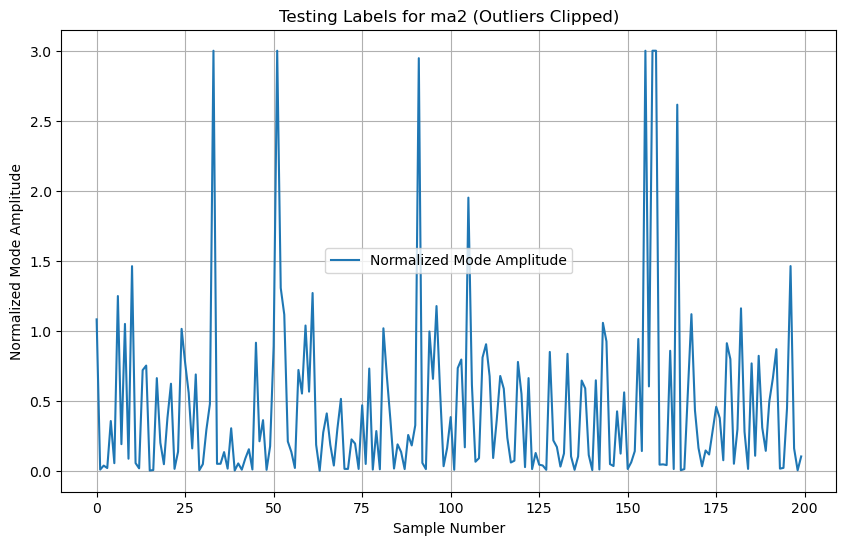

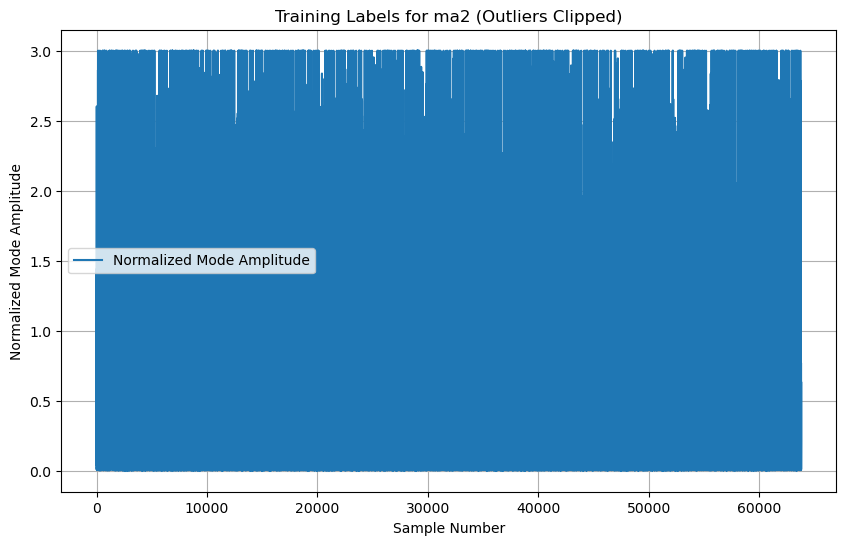

In [8]:
# Prepare data for HBT prediction model
target_data = hbt_dataType  # Using mode 2 amplitude as target
training_data = cut_training_data_2D

# Normalization factors
camera_norm = 1  # Camera data already normalized by max_pixel_value
# Compute ma_norm using 90th percentile to handle outliers
raw_target_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        raw_target_vector.append(target_data[i][j])

raw_target_vector = np.asarray(raw_target_vector, dtype=np.float32)[:, 0]
percentile_cutoff = np.percentile(np.abs(raw_target_vector), OUTLIER_CUTOFF) #99%
ma_norm = percentile_cutoff if percentile_cutoff > 0 else 1.0  # Use 99th percentile for normalization
outlier_threshold = 3 * ma_norm  # Define outliers as values > 3 * normalization factor
outliers = np.abs(raw_target_vector) > outlier_threshold
print(f"Normalization factor ({OUTLIER_CUTOFF} percentile): {ma_norm:.2f}")
print(f"Number of outliers (|value| > {outlier_threshold:.2f}): {np.sum(outliers)}")

# Clip outliers for normalization
raw_target_vector = np.clip(raw_target_vector, -outlier_threshold, outlier_threshold)

# Reshape the training data and labels, excluding RESERVED_SHOT
target_vector = []
training_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        target_vector.append(target_data[i][j])
        training_vector.append(training_data[i][j])

# Shuffle the data
random.seed(123)
zip_list = list(zip(target_vector, training_vector))
random.shuffle(zip_list)
target_vector, training_vector = zip(*zip_list)

# Convert to numpy arrays and normalize with clipping
target_vector = np.asarray(target_vector, dtype=np.float32)[:, 0]
target_vector = np.clip(target_vector, -outlier_threshold, outlier_threshold) / ma_norm
training_vector = np.asarray(training_vector, dtype=np.float32).reshape(-1, 32, 32, 1)

# Split into training and testing sets
test_size = 200
testing_inputs = training_vector[-test_size:]
testing_labels = target_vector[-test_size:]
training_vector = training_vector[:-test_size]
target_vector = target_vector[:-test_size]

# Save normalization info to a per-run file
normalization_filename = f"normalization_{notebook_type}_state_{state}.npz"
np.savez(normalization_filename,
         ma_norm=ma_norm,
         outlier_threshold=outlier_threshold,
         selected_data_type=selected_data_type)
print(f"Saved normalization info to {normalization_filename}")

print('Training shape:', training_vector.shape, 'Target shape:', target_vector.shape)
print('Testing shape:', testing_inputs.shape, 'Testing label shape:', testing_labels.shape)

# Plot testing labels
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Testing Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

# Plot training labels
plt.figure(figsize=(10, 6))
plt.plot(target_vector, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Training Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

In [9]:
import ast

# Define model architecture
num_conv2d_layers = NUM_CONV2D_LAYERS #2
num_dense_layers = NUM_DENSE_LAYERS #1

conv2d_neurons = CONV2D_NEURONS #[16, 16]
conv2d_size = CONV2D_SIZE #[(8, 8), (8, 8)]
dense_layer_neurons = DENSE_LAYER_NEURONS #[10]
max_pooling_size = MAX_POOLING_SIZE #(4, 4)
activation_func = ACTIVATION_FUNC # 'relu'
loss_func = LOSS_FUNC #'mean_squared_error'
optimizer_func = OPTIMIZER_FUNC #'adam'

# Reinterpret conv2d_size to handle various input formats
conv2d_size = [
    tuple(int(x) for x in ast.literal_eval(size) if isinstance(x, (int, float)))
    if isinstance(size, str) else tuple(int(x) for x in size)
    for size in conv2d_size
]
# Reinterpret max_pooling_size to handle various input formats
max_pooling_size = (
    tuple(int(x) for x in ast.literal_eval(max_pooling_size) if isinstance(x, (int, float)))
    if isinstance(max_pooling_size, str) else tuple(int(x) for x in max_pooling_size)
)
# Create the model
william_model = tf.keras.models.Sequential()

# Add input layer
william_model.add(tf.keras.layers.InputLayer(shape=(32, 32, 1)))

# Add Conv2D layers
for i in range(num_conv2d_layers):
    william_model.add(tf.keras.layers.Conv2D(conv2d_neurons[i], conv2d_size[i], 1, activation=activation_func))
    william_model.add(tf.keras.layers.MaxPooling2D(max_pooling_size, 1))

# Flatten the output
william_model.add(tf.keras.layers.Flatten())

# Add dense layers
for i in range(num_dense_layers):
    william_model.add(tf.keras.layers.Dense(dense_layer_neurons[i], activation=activation_func))

# Output layer
william_model.add(tf.keras.layers.Dense(1))

# Compile the model
william_model.compile(optimizer=optimizer_func, loss=loss_func)

# Display model summary
william_model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 26, 26, 64)     │         3,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 32)     │       131,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 13, 13, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 5408)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │       173,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 307,425 (1.17 MB)

 Trainable params: 307,425 (1.17 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
# Train the model
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
Model = william_model
history = Model.fit(training_vector, target_vector,
                       epochs=EPOCH_NUM,
                       validation_split=VALIDATION_SPLIT,
                       verbose=1,
                       callbacks=[early_stop])

Epoch 1/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 3:00 101ms/step - loss: 0.1807

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2350  

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2316

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2303

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2389

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2438

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2479

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2505

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2536

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2548

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2554

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2563

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2572

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2580

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2587

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2588

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2584

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2582

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2592

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2599

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2612

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2625

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2641

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2655

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2668

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2680

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2688

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2698

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2708

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2717

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2725

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2730

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2738

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2743

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2749

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2755

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2761

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2767

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2773

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2779

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2784

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2789

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2792

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2795

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2799

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2801

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2804

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2807

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2808

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2809

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2810

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2810

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2812

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2813

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2815

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2816

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2817

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2819

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2821

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2822

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2824

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2825

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2827

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2828

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2830

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2832

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2834

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2835

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2837

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2839

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2840

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2842

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2843

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2844

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2845

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2847

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2848

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2850

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2851

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2852

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2853

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2855

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2856

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2857

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2859

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2860

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2861

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2862

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2863

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2864

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2865

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2866

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2866

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2867

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2868

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2869

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2870

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2871

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2871

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2872

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2873

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2873

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2873

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2874

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2875

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2875

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2875

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2876

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2876

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2876

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2876

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2876

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2876

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2876

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2877

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2877

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2877

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2877

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2878

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2878

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2878

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2878

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2879

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2879

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2879

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2879

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2879

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2879

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2879

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2880

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2880

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2880

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2880

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2880

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2880

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2880

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2880

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2880

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2880

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2880

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2880

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2880

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2880

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2880

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2879

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2879

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2879

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2879

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2879

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2879

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2879

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2878

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2878

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2878

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2877

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2877

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2877

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2876

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2876

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2876

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2875

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2875

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2875

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2874

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2874

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2874

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2874

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2873

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2873

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2873

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2872

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2872

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2872

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2872

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2871

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2871

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2871

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2870

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2870

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2870

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2869

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2869

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2869

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2868

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2868

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2868

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2867

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2867

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2867

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2866

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2866

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2865

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2865

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2865

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2864

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2864

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2864

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2863

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2863

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2863

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2862

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2862

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2861

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2861

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2861

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2860

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2860

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2860

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2860

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2860

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2859

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2859

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2859

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2859

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2858

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2858

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2858

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2857

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2857

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2857

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2857

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2856

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2856

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2856

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2855

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2855

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2855

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2855

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2854

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2854

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2854

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2853

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2853

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2853

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2852

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2852

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2852

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2851

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2851

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2851

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2850

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2850

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2850

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2849

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2849

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2849

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2848

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2848

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2848

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2847

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2847

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2846

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2846

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2846

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2845

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2845

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2844

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2844

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2844

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2843

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2843

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2842

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2842

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2842

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2841

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2841

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2841

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2840

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2840

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2839

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2839

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2839

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2838

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2838

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2837

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2837

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2837

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2836

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2836

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2835

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2835

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2835

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2834

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2834

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2834

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2833

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2833

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2833

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2832

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2832

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2832

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2831

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2831

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2831

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2830

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2830

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2830

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2829

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2829

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2829

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2828

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2828

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2827

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2827

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2827

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2826

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2826

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2826

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2826

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2825

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2825

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2825

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2824

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2824

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2824

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2823

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2823

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2823

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2822

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2822

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2822

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2821

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2821

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2821

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2820

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2820

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2820

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2819

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2819

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2819

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2818

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2818

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2818

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2817

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2817

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2817

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2817

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2816

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2816

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2816

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2815

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2815

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2815

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2814

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2814

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2814

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2813

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2813

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2813

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2813

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2812

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2812

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2812

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2811

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2811

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2811

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2811

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2810

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2810

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2810

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2809

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2809

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2809

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2809

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2808

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2808

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2808

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2807

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2807

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2807

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2807

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2806

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2806

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2806

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2806

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2805

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2805

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2805

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2805

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2804

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2804

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2804

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2804

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2803

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2803

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2803

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2803

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2802

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2802

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2802

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2802

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2802

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2801

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2801

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2801

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2801

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2800

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2800

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2800

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2800

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2799

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2799

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2799

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2799

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2799

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2798

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2798

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2798

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2798

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2797

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2797

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2797

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2797

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2797

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2796

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2796

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2796

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2796

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2795

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2795

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2795

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2795

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2795

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2794

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2794

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2794

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2794

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2794

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2793

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2793

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2793

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2793

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2793

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2792

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2792

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2792

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2792

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2792

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2792

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2791

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2791

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2791

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2791

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2791

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2791

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2790

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2790

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2790

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2790

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2790

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2790

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2789

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2789

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2789

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2789

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2789

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2789

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2788

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2788

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2788

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2788

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2788

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2788

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2788

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2787

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2787

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2787

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2787

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2787

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2787

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2787

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2786

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2786

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2786

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2786

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2786

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2786

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2786

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2786

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2785

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2785

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2785

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2785

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2785

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2785

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2785

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2784

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2784

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2784

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2784

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2784

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2784

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2784

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2783

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2783

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2783

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2783

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2783

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2783

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2783

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2782

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2782

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2782

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2782

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2782

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2782

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2782

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2781

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2781

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2781

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2781

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2781

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2781

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2781

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2780

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2780

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2780

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2780

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2780

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2780

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2779

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2779

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2779

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2779

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2779

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2779

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2779

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2778

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2778

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2778

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2778

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2778

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2777

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2777

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2777

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2777

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2777

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2777

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2776

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2776

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2776

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2776

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2776

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2776

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2775

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2775

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2775

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2775

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2775

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2775

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2774

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2774

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2774

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2774

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2774

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2774

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2773

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2773

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2773

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2773

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2773

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2773

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2772

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2772

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2772

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2772

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2772

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2772

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2771

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2771

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2771

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2771

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2771

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2771

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2770

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2770

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2770

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2770

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2770

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2770

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2769

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2769

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2769

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2769

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2769

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2768

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2768

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2768

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2768

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2768

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2768

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2767

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2767

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2767

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2767

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2767

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2767

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2767

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2766

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2766

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2766

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2766

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2766

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2766

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2765

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2765

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2765

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2765

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2765

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2765

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2764

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2764

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2764

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2764

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2764

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2764

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2763

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2763

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2763

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2763

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2763

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2763

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2762

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2762

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2762

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2762

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2762

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2762

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2762

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2761

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2761

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2761

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2761

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2761

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2761

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2760

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2760

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2760

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2760

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2760

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2760

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2760

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2759

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2759

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2759

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2759

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2759

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2759

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2759

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2758

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2758

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2758

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2758

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2758

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2758

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2758

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2757

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2757

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2757

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2757

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2757

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2757

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2756

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2756

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2756

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2756

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2756

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2756

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2755

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2755

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2755

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2755

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2755

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2754

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2754

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2754

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2754

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2754

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2754

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2753

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2753

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2753

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2753

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2753

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2752

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2752

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2752

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2752

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2752

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2751

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2751

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2751

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2751

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2751

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2751

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2750

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2750

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2750

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2750

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2750

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2749

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2749

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2749

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2749

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2749

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2749

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2748

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2748

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2748

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2748

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2748

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2747

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2747

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2747

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2747

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2747

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2747

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2746

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2746

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2746

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2746

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2746

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2745

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2745 

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2745

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2745

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2745

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2745

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2744

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2744

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2744

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2744

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2744

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2743

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2743

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2743

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2743

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2743

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2743

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2742

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2742

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2742

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2742

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2742

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2741

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2741

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2741

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2741

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2741

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2740

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2740

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2740

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2740

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2740

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2739

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2739

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2739

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2739

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2739

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2739

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2738

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2738

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2738

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2738

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2738

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2737

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2737

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2737

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2737

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2737

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2736

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2736

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2736

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2736

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2736

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2735

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2735

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2735

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2735

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2735

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2734

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2734

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2734

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2734

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2734

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2733

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2733

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2733

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2733

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2733

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2733

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2732

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2732

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2732

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2732

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2732

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2731

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2731

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2731

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2731

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2731

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2731

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2730

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2730

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2730

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2730

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2730

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2729

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2729

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2729

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2729

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2729

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2729

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2728

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2728

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2728

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2728

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2728

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2728

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2727

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2727

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2727

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2727

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2727

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2726

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2726

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2726

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2726

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2726

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2726

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2725

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2725

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2725

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2725

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2725

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2725

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2724

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2724

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2724

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2724

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2724

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2724

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2723

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2723

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2723

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2723

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2723

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2723

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2722

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2722

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2722

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2722

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2722

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2721

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2721

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2721

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2721

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2721

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2721

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2720

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2720

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2720

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2720

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2720

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2720

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2719

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2719

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2719

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2719

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2719

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2719

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2718

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2718

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2718

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2718

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2718

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2718

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2717

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2717

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2717

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2717

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2717

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2717

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2716

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2716

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2716

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2716

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2716

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2715

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2715

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2715

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2715

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2715

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2715

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2714

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2714

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2714

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2714

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 29ms/step - loss: 0.2714 - val_loss: 0.2371


Epoch 2/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.1418

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1568 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2030

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2103

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2076

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2041

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2031

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2030

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2037

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2033

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2029

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2031

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2028

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2031

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2041

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2051

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2060

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2073

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2085

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2094

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2100

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2105

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2111

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2118

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2127

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2137

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2145

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2152

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2158

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2163

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2169

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2173

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2177

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2180

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2184

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2187

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2190

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2193

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2196

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2200

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2202

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2204

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2207

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2210

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2212

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2213

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2214

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2215

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2215

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2216

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2216

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2217

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2218

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2219

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2220

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2221

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2221

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2222

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2222

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2223

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2223

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2223

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2223

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2223

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2223

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2223

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2223

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2223

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2224

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2224

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2225

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2225

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2225

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2225

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2225

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2225

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2224

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2224

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2224

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2224

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2224

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2224

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2224

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2224

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2223

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2223

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2223

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2222

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2222

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2221

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2221

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2220

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2220

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2219

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2219

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2218

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2217

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2217

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2216

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2215

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2214

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2213

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2212

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2211

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2210

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2209

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2208

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2207

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2206

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2205

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2204

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2204

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2203

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2202

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2202

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2201

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2200

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2200

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2199

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2198

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2197

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2197

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2196

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2196

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2195

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2195

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2194

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2194

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2194

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2193

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2193

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2193

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2192

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2192

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2192

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2191

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2191

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2191

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2191

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2190

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2190

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2190

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2190

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2189

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2189

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2189

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2189

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2188

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2188

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2188

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2188

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2187

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2187

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2187

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2186

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2186

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2186

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2185

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2185

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2185

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2184

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2184

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2184

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2183

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2183

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2183

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2183

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2183

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2182

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2182

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2182

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2182

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2182

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2181

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2181

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2181

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2181

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2180

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2180

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2180

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2180

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2179

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2179

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2179

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2179

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2179

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2178

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2178

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2178

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2178

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2178

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2178

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2177

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2177

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2177

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2177

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2177

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2176

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2176

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2176

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2176

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2176

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2176

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2175

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2175

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2175

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2175

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2175

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2175

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2175

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2175

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2175

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2175

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2175

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2175

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2174

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2174

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2174

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2174

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2174

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2174

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2174

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2174

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2174

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2174

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2174

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2174

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2174

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2174

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2174

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2174

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2174

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2174

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2174

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2174

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2174

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2173

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2173

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2173

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2173

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2173

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2173

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2173

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2173

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2173

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2173

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2173

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2172

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2172

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2172

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2172

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2172

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2172

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2172

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2172

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2172

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2172

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2172

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2172

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2171

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2171

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2171

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2171

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2171

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2171

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2171

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2171

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2171

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2171

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2171

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2171

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2171

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2171

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2171

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2171

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2171

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2171

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2171

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2171

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2171

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2171

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2171

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2171

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2170

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2170

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2170

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2170

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2170

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2170

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2170

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2170

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2170

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2170

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2170

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2170

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2170

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2170

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2170

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2170

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2170

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2170

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2170

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2170

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2170

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2170

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2170

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2169

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2169

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2169

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2169

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2169

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2169

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2169

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2169

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2169

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2168

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2168

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2168

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2168

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2168

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2168

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2168

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2168

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2168

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2168

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2168

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2168

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2168

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2168

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2168

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2168

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2168

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2168

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2168

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2168

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2168

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2168

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2167

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2167

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2167

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2167

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2167

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2167

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2167

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2167

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2167

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2167

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2167

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2167

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2167

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2167

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2167

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2167

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2167

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2167

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2166

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2166

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2166

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2166

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2166

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2166

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2166

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2166

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2165

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2165

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2165

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2165

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2165

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2165

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2165

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2165

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2165

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2165

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2165

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2165

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2165

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2165

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2165

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2165

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2164

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2164

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2164

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2164

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2164

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2164

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2164

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2163

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2163

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2163

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2163

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2164

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2164

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2164

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2164

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2164

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2164

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2164

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2164

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2163

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2163

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2163

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2163

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2163

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2164

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2164

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2164

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2164

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2164

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2164

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2164

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2164

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2164

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2164

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2164

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2164

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2164

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2164

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2164

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2164

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2164

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2164

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2164

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2164

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2164

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2164

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2164

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2164

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2164

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2164

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2164

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2164

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2164

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2164

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2164

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2165

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2165

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2165

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2165

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2165

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2165

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2165

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2165

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2165

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2165

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2165

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2165

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2166

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2166

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2166

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2166

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2166

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2166

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2166

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2166

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2166

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2166

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2166

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2166

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2166

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2166

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2166

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2166

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2166

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2167

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2167

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2167

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2167

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2167

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2167

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2167

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2167

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2167

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2167

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2167

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2167

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2167

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2167

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2167

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2167

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2167

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2167

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2167

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2167

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2168

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2168

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2168

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2168

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2168

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2168

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2168

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2168

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2168

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2168

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2168

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2168

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2168

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2168

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168 

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2168

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2168

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2168

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2168

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2168

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2168

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2168

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2168

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2168

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2169

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2169

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2169

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2169

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2169

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2169

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2169

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2169

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2169

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2169

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2169

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2169

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2169

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2169

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2169

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2169

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2169

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.2169 - val_loss: 0.2336


Epoch 3/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 37ms/step - loss: 0.4530

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.3448 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.3011

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2700

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2570

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2497

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2459

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2421

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2385

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2355

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2331

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2314

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2303

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2292

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2288

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2282

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2278

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2271

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2267

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2265

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2263

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2259

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2255

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2250

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2246

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2243

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2239

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2235

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2232

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2229

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2226

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2222

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2219

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2216

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2213

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2208

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2205

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2201

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2197

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2194

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2191

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2189

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2187

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2186

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2184

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2183

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2182

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2181

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2180

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2180

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2181

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2181

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2181

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2181

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2181

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2181

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2181

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2182

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2182

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2182

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2182

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2182

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2182

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2183

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2183

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2183

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2183

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2183

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2183

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2183

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2183

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2182

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2182

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2181

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2180

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2180

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2179

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2177

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2177

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2176

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2175

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2174

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2173

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2172

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2171

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2170

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2170

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2169

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2168

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2167

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2167

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2166

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2166

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2165

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2165

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2164

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2164

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2164

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2164

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2165

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2164

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2165

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2165

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2165

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2165

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2165

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2165

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2165

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2166

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2166

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2166

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2166

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2166

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2166

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2165

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2165

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2165

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2165

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2165

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2165

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2165

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2165

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2165

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2164

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2164

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2164

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2164

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2164

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2164

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2164

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2163

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2163

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2163

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2163

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2163

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2163

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2163

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2163

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2163

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2163

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2162

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2162

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2162

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2162

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2162

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2162

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2162

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2162

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2162

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2162

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2162

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2162

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2161

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2161

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2161

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2161

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2161

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2161

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2161

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2161

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2161

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2161

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2161

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2161

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2161

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2161

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2161

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2161

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2161

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2161

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2162

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2162

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2162

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2162

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2162

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2162

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2162

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2162

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2162

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2162

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2163

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2163

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2163

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2163

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2163

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2163

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2163

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2163

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2163

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2163

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2163

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2163

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2163

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2163

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2164

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2164

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2164

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2164

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2164

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2164

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2164

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2164

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2164

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2164

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2164

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2164

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2164

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2164

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2165

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2164

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2164

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2164

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2164

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2164

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2164

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2164

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2164

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2164

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2164

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2164

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2163

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2163

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2163

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2163

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2163

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2163

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2163

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2163

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2162

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2162

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2162

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2162

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2162

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2161

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2161

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2161

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2161

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2160

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2160

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2160

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2160

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2159

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2159

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2159

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2159

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2159

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2158

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2158

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2158

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2158

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2157

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2157

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2157

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2157

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2157

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2156

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2156

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2156

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2156

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2155

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2155

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2155

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2153

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2153

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2153

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2152

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2152

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2152

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2151

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2151

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2151

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2151

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2150

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2150

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2150

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2149

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2149

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2149

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2148

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2148

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2148

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2147

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2147

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2147

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2147

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2146

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2146

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2146

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2146

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2145

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2145

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2145

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2144

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2144

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2144

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2144

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2143

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2143

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2143

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2142

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2142

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2142

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2142

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2141

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2141

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2141

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2141

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2140

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2140

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2140

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2140

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2139

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2139

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2139

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2138

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2138

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2138

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2138

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2137

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2137

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2137

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2136

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2136

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2136

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2136

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2135

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2135

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2135

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2135

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2133

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2133

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2133

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2132

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2132

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2132

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2132

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2131

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2131

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2131

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2131

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2130

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2130

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2130

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2129

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2129

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2129

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2129

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2128

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2128

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2128

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2128

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2127

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2127

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2127

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2127

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2126

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2126

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2126

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2126

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2126

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2125

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2125

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2125

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2125

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2124

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2124

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2124

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2124

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2124

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2122

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2122

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2122

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2122

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2122

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2121

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2121

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2121

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2121

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2121

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2120

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2120

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2120

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2120

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2120

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2119

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2119

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2119

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2119

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2119

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2118

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2118

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2118

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2118

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2118

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2116

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2116

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2116

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2116

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2116

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2116

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2115

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2115

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2115

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2115

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2115

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2115

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2114

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2114

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2114

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2114

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2114

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2114

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2113

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2113

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2113

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2113

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2113

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2113

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2113

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2113

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2112

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2112

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2112

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2112

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2112

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2112

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2112

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2112

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2111

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2111

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2111

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2111

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2110

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2110

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2110

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2110

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2110

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2110

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2110

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2110

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2110

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2109

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2109

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2109

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2109

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2109

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2109

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2109

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2109

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2109

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2108

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2108

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2108

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2108

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2108

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2108

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2108

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2108

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2108

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2107

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2107

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2107

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2107

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2107

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2107

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2107

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2107

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2107

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2107

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2106

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2106

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2106

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2106

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2106

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2106

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2106

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2106

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2106

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2106

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2105

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2105

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2105

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2105

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2105

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2105

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2105

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2105

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2105

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2105

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2105

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2104

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2104

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2104

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2104

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2104

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2104

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2104

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2104

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2104

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2104

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2103

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2103

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2103

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2103

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2103

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2103

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2103

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2103

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2103

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2103

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2103

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2102

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2102

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2102

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2102

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2102

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2102

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2102

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2102

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2102

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2102

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2102

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2101

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2101

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2101

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2101

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2101

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2101

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2101

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2101

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2101

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2101

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2101

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2100

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2100

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2100

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2100

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2100

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2100

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2100

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2100

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2100

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2100

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2100

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2098

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2098

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2098

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2098

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2098

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2098

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2098

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2098

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2098

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2098

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2097

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2097

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2097

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2097

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2097

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2097

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2097

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2097

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2097

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2097

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2097

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2096

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2096

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2096

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2096

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2096

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2096

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2096

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2096

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2096

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2096

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2096

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2095

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2095

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2095

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2095

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2095

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2095

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2095

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2095

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2095

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2095

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2095

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2095

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2094

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2094

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2094

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2094

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2094

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2094

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2094

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2094

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2094

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2094

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2094

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2093

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2093

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2093

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2093

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2093

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2093

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2093

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2093

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2093

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2093

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2093

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2092

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2092

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2092

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2092

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2092

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2092

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2092

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2092

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2092

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2092

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2092

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2092

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2091

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2091

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2091

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2091

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2091

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2091

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2091

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2091

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2091

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2091

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2090

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2090

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2090

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2090

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2090

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2090

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2090

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2090

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2090

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2090

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2090

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2089

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2089

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2089

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2089

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2089

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2089

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2089

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2089

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2089

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2089

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2089

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2089

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2089

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2088

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2088

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2088

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2088

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2088

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2088

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2088

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2088

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2088

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2088

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2088

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2088

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2087

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2087

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2087

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2087

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2087

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2087

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2087

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2087 

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2087

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2087

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2087

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2086

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2086

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2086

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2086

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2086

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2086

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2086

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2086

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2086

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2086

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2085

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2085

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2085

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2085

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2085

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2085

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2085

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2085

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2085

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2085

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2085

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2084

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2084

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2084

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2084

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2084

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2084

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2084

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2084

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2084

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2084

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2084

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2084

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2084

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2083

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2083

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2083

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2083

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2083

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2083

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2083

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2083

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2083

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2083

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2083

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2083

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2082

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2082

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2082

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2082

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2082

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2082

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2082

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2082

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2082

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2082

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2082

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2082

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2081

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2081

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2081

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2081

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2081

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2081

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2081

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2081

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2081

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2081

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2081

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2081

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2080

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2080

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2080

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2080

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2080

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2080

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2080

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2080

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2080

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2080

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2080

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2080

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2080

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2079

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2079

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2079

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2079

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2079

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2079

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2079

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2079

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2079

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2079

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2079

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2079

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2079

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2079

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2079

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2078

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2078

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2078

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2078

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2078

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2078

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2078

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2078

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2078

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2078

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2078

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2078

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2078

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2078

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2078

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2077

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2077

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2077

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2077

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2077

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2077

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2077

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2077

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2077

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2077

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2077

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2077

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2077

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2077

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2077

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2076

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2076

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2076

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2076

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2076

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2076

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2076

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2076

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2076

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2075

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2075

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2075

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2075

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2075

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2075

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2075

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2075

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2075

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2075

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2075

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2075

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2075

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2075

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2075

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2074

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2074

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2074

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2074

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2074

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2074

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2074

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2074

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2074

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2074

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.2074 - val_loss: 0.2017


Epoch 4/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.2550

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1743 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1423

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1429

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1500

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1549

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1594

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1627

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1654

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1669

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1674

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1673

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1674

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1677

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1679

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1682

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1682

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1690

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1698

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1705

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1714

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1722

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1727

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1733

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1738

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1743

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1746

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1752

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1757

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1763

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1770

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1775

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1779

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1783

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1787

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1790

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1793

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1797

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1800

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1803

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1806

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1809

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1813

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1816

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1819

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1822

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1825

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1827

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1829

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1831

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1833

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1835

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1837

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1840

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1843

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1846

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1848

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1850

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1852

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1853

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1855

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1856

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1858

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1859

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1861

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1862

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1864

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1865

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1867

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1869

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1871

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1872

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1874

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1876

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1877

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1879

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1880

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1882

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1883

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1884

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1886

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1887

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1888

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1889

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1891

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1892

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1893

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1894

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1894

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1895

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1896

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1897

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1897

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1898

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1898

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1899

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1899

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1899

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1900

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1900

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1901

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1901

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1901

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1902

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1902

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1903

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1903

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1904

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1904

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1905

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1905

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1906

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1907

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1907

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1908

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1908

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1908

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1909

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1909

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1909

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1910

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1910

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1911

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1911

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1912

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1912

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1913

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1913

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1914

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1914

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1915

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1915

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1915

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1916

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1917

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1917

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1917

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1918

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1918

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1919

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1919

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1919

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1920

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1920

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1920

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1921

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1921

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1921

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1922

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1922

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1922

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1923

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1923

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1924

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1924

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1925

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1925

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1926

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1926

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1926

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1927

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1927

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1928

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1928

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1928

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1929

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1929

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1930

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1930

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1930

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1930

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1931

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1931

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1931

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1931

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1932

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1932

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1932

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1932

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1933

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1933

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1933

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1933

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1933

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1934

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1934

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1934

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1934

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1934

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1935

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1935

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1935

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1935

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1935

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1935

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1935

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1936

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1936

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1936

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1936

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1936

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1936

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1937

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1937

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1937

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1937

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1937

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1937

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1937

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1937

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1937

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1938

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1938

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1938

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1938

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1938

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1938

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1938

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1938

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1938

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1938

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1939

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1939

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1939

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1939

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1939

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1939

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1939

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1939

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1940

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1940

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1940

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1940

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1941

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1941

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1941

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1941

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1941

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1942

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1942

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1942

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1942

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1942

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1942

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1943

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1943

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1943

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1943

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1943

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1944

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1944

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1944

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1944

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1944

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1945

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1945

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1945

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1945

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1945

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1946

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1946

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1946

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1946

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1947

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1947

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1947

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1947

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1947

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1947

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1948

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1948

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1948

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1948

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1948

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1949

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1949

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1949

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1949

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1949

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1950

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1950

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1950

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1950

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1950

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1950

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1951

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1951

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1951

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1951

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1951

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1951

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1952

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1952

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1952

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1952

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1952

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1953

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1953

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1953

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1953

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1953

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1954

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1954

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1954

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1954

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1954

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1955

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1955

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1955

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1955

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1956

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1956

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1956

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1956

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1956

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1957

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1957

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1957

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1957

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1958

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1958

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1958

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1958

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1958

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1959

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1959

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1959

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1959

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1960

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1960

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1960

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1960

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1961

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1961

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1961

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1961

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1962

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1962

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1962

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1962

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1962

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1963

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1963

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1963

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1963

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1963

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1963

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1964

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1964

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1964

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1964

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1964

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1965

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1965

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1965

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1965

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1965

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1966

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1966

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1966

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1966

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1966

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1967

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1967

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1967

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1967

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1967

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1967

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1967

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1968

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1968

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1968

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1968

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1968

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1968

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1968

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1968

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1969

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1969

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1969

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1969

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1969

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1969

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1969

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1969

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1969

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1969

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1970

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1970

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1970

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1970

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1970

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1970

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1970

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1970

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1970

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1970

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1970

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1971

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1971

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1971

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1971

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1972

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1972

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1972

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1972

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1972

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1972

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1972

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1972

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1972

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1972

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1972

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1972

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1972

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1972

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1972

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1972

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1972

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1972

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1972

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1972

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1972

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1972

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1972

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1972

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1972

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1973

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1973

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1973

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1973

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1973

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1973

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1973

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1973

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1973

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1973

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1973

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1973

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1973

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1973

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1973

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1973

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1973

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1973

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1973

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1973

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1973

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1973

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1974

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1974

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1974

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1974

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1974

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1974

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1974

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1974

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1974

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1974

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1974

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1974

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1974

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1974

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1974

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1974

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1974

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1974

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1973

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1973

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1973

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1973

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1973

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1973

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1973

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1973

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1973

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1973

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1973

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1973

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1973

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1973

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1973

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1973

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1972

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1972

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1972

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1972

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1972

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1972

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1972

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1972

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1971

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1971

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1971

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1970

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1970

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1970

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1970

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1970

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1970

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1970

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1970

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1970

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1970

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1970

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1970

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1970

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1970

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1970

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1970

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1969

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1969

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1969

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1969

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1969

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1969

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1969

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1969

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1969

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1969

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1969

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1969

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1969

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1969

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1969

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1968

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1968

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1968

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1968

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1968

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1968

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1968

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1968

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1968

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1968

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1968

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1968

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1968

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1968

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1968

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1968

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1968

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1967

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1967

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1967

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1967

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1967

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1967

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1967

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1967

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1967

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1967

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1967

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1967

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1967

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1967

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1967

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1967

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1967

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1967

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1966

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1966

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1965

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1965

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1965

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1965

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1965

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1965

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1965

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1965

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1965

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1965

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1965

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1965

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1965

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1965

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1965

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1965

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1964

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1964

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1964

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1964

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1964

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1964

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1964

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1964

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1964

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1964

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1964

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1964

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1964

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1964

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1964

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1964

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1963

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1963

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1963

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962 

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1962

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1962

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1962

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1962

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1962

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1962

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1962

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1961

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1961

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1961

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1961

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1961

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1961

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1961

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1961

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1961

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1961

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1961

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1961

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1961

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1961

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1961

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1961

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1961

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1961

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1961

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1961

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1961

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1961

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1961

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1961

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1961

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1961

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1961

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1960

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1960

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1960

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1960

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1960

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1960

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1960

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1960

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1960

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1960

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1960

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1960

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1960

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1959

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1959

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1959

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1959

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1959

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1959

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1959

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1959

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1959

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1958

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1958

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1958

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1958

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1958

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1958

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1958

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1958

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1958

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1958

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1958

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1958

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1958

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1958

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1958

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1958

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1958

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1958

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1958

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1958

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1958

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1958

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1958

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1958

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1958

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1958

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1958

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1958

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1958

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1957

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1957

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1957

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1957

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1957

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1957

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1957

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1957

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1957

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1956

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1956

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1956

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1956

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1956

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1956

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1956

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1956

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1956

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1956

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1956

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1956

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1956 - val_loss: 0.1954


Epoch 5/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.1649

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1707 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1925

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2007

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2151

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2245

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2301

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2329

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2351

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2357

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2353

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2340

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2321

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2303

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2283

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2267

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2248

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2231

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2215

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2199

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2187

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2176

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2165

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2155

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2143

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2130

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2117

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2103

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2091

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2080

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2069

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2059

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2049

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2041

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2033

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2025

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2017

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2010

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2004

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1997

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1991

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1985

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1980

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1976

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1973

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1969

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1966

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1963

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1960

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1959

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1958

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1957

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1956

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1955

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1954

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1953

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1953

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1953

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1953

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1953

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1953

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1953

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1953

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1952

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1952

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1952

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1951

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1951

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1950

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1950

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1950

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1949

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1948

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1947

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1947

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1946

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1945

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1944

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1943

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1942

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1941

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1940

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1939

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1938

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1937

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1937

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1936

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1935

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1934

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1933

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1933

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1932

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1931

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1931

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1930

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1930

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1929

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1928

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1928

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1927

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1927

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1926

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1926

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1925

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1925

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1924

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1924

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1923

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1922

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1922

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1921

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1920

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1920

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1919

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1919

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1918

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1918

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1917

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1917

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1916

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1915

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1915

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1914

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1913

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1913

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1912

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1911

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1911

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1910

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1909

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1909

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1908

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1908

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1907

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1907

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1906

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1906

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1906

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1906

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1905

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1905

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1905

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1904

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1904

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1904

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1903

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1903

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1903

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1902

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1902

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1902

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1902

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1901

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1901

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1901

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1901

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1900

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1900

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1900

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1900

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1900

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1899

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1899

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1899

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1899

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1899

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1899

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1899

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1899

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1899

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1899

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1899

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1899

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1899

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1899

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1899

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1899

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1899

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1899

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1899

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1899

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1899

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1899

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1899

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1899

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1899

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1899

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1899

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1899

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1898

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1898

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1898

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1898

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1898

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1898

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1898

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1898

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1898

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1897

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1897

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1897

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1897

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1896

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1896

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1896

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1896

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1896

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1895

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1895

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1895

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1895

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1895

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1895

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1895

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1894

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1894

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1894

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1894

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1894

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1894

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1893

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1893

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1893

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1893

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1893

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1893

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1892

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1892

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1892

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1892

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1892

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1891

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1891

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1891

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1891

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1891

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1890

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1890

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1890

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1890

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1890

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1890

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1889

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1889

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1889

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1889

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1889

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1889

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1889

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1888

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1888

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1888

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1888

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1888

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1888

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1888

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1888

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1888

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1888

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1888

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1888

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1888

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1888

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1888

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1888

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1888

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1888

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1888

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1888

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1888

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1888

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1888

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1888

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1888

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1888

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1888

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1888

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1888

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1888

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1888

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1888

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1888

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1888

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1888

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1888

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1888

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1888

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1888

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1888

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1888

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1888

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1888

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1888

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1889

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1889

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1889

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1889

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1889

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1889

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1889

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1889

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1889

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1889

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1889

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1889

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1890

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1890

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1890

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1890

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1890

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1890

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1890

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1890

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1890

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1890

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1890

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1890

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1890

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1890

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1890

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1890

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1890

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1890

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1890

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1890

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1890

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1890

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1890

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1890

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1890

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1890

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1891

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1891

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1891

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1891

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1891

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1891

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1891

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1891

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1891

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1891

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1891

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1891

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1891

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1891

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1891

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1891

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1891

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1891

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1891

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1891

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1891

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1892

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1892

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1892

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1892

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1892

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1892

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1892

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1892

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1892

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1892

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1892

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1892

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1892

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1892

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1892

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1892

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1892

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1892

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1893

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1893

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1893

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1893

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1893

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1893

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1894

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1894

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1894

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1894

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1894

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1894

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1894

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1894

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1894

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1894

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1894

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1894

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1894

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1894

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1894

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1894

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1894

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1894

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1894

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1894

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1894

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1895

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1895

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1895

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1895

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1895

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1895

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1895

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1895

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1895

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1895

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1895

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1895

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1895

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1895

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1895

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1895

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1895

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1895

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1895

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1895

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1895

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1895

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1895

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1895

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1895

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1895

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1895

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1895

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1894

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1894

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1894

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1893

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1893

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1893

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1893

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1893

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1893

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1893

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1893

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1893

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1893

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1893

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1893

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1893

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1893

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1893

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1893

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1893

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1893

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1893

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1893

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1893

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1893

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1893

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1893

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1893

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1893

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1893

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1893

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1893

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1892

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1892

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1892

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1892

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1892

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1892

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1892

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1892

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1892

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1892

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1892

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1892

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1892

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1891

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1891

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1891

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1891

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1891

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1891

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1891

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1891

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1891

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1891

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1891

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1891

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1891

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1891

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1891

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1891

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1890

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1890

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1890

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1890

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1890

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1890

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1890

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1890

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1890

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1890

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1890

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1890

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890 

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1890

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1890

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1890

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1890

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1890

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1890

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1890

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1890

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1890

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1890

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1890

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1890

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1890

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1890

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1890

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1889

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1889

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1889

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1889

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1889

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1889

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1889

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1889

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1889

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1889

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1889

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1889

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1889

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1889

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1889

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1889

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1889

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1889

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1889

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1889

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1889

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1889

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1889

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1888

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1888

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1888

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1888

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1888

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1888 - val_loss: 0.1812


Epoch 6/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:14 42ms/step - loss: 0.0706

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1076 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1243

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.1432

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 36ms/step - loss: 0.1518

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.1558

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.1611

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.1644

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.1663

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1682 

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1697

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1708

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.1725

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1742

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1759

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1777

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1788

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1797

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1805

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1810

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1815

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1818

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1821

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1824

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1826

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1829

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1831

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1833

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1835

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1838

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1840

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1844

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1848

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1850

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1852

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1854

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1856

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1857

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1857

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1858

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1859

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1860

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1861

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1862

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1864

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1865

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1867

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1869

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1870

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1872

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1873

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1873

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1874

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1875

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1875

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1876

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1877

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1877

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1878

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1878

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1878

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1878

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1878

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1878

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1877

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1877

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1876

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1876

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1875

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1875

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1874

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1873

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1872

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1871

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1870

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1869

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1868

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1867

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1866

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1864

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1863

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1862

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1860

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1859

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1857

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1856

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1855

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1854

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1852

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1851

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1850

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1849

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1847

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1846

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1845

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1844

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1843

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1842

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1841

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1841

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1840

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1839

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1839

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1838

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1837

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1837

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1836

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1836

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1835

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1835

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1834

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1834

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1834

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1833

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1833

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1832

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1832

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1832

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1831

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1831

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1831

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1830

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1830

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1829

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1829

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1829

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1828

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1828

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1827

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1827

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1826

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1826

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1825

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1825

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1824

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1824

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1823

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1823

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1822

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1822

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1822

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1821

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1821

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1821

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1821

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1820

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1820

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1820

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1820

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1820

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1820

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1820

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1819

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1819

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1819

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1819

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1819

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1819

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1819

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1819

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1818

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1818

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1818

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1818

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1818

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1818

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1818

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1817

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1817

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1817

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1817

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1817

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1817

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1817

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1817

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1817

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1816

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1816

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1816

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1816

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1816

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1816

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1816

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1816

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1816

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1816

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1816

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1815

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1815

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1815

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1815

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1815

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1815

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1815

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1815

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1815

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1815

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1815

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1815

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1814

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1814

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1814

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1814

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1814

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1814

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1814

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1814

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1814

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1814

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1813

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1813

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1813

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1813

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1813

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1813

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1813

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1813

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1813

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1812

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1812

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1812

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1812

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1812

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1812

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1812

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1812

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1812

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1812

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1812

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1811

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1811

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1811

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1811

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1811

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1811

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1811

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1811

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1811

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1811

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1811

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1811

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1811

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1811

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1811

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1810

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1810

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1810

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1810

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1810

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1810

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1810

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1810

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1810

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1810

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1810

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1810

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1810

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1810

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1810

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1810

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1810

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1810

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1810

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1810

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1810

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1810

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1810

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1810

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1810

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1810

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1810

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1810

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1810

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1810

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1810

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1810

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1810

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1810

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1810

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1810

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1810

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1810

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1810

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1810

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1811

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1811

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1811

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1811

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1812

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1812

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1812

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1812

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1812

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1812

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1812

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1812

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1812

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1812

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1812

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1812

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1812

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1812

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1812

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1812

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1812

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1812

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1813

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1813

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1813

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1813

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1813

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1813

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1813

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1813

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1813

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1813

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1813

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1813

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1813

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1813

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1813

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1813

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1813

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1813

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1813

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1813

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1813

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1814

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1814

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1814

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1814

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1814

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1814

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1814

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1814

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1814

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1814

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1814

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1814

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1814

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1814

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1814

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1814

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1814

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1814

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1814

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1814

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1814

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1814

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1814

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1814

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1814

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1814

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1814

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1814

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1815

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1815

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1815

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1815

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1815

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1815

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1815

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1815

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1815

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1815

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1815

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1815

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1815

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1815

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1815

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1815

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1815

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1815

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1815

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1815

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1815

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1815

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1815

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1815

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1815

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1815

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1815

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1815

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1815

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1815

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1815

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1815

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1815

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1815

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1815

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1815

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1815

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1815

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1815

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1815

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1815

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1816

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1816

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1816

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1816

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1816

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1816

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1816

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1816

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1816

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1816

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1816

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1816

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1816

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1816

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1816

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1816

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1816

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1816

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1816

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1816

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1816

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1816

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1816

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1817

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1817

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1817

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1817

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1817

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1817

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1817

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1817

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1817

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1817

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1817

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1817

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1817

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1817

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1817

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1817

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1817

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1817

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1817

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1817

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1818

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1818

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1818

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1818

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1818

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1818

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1818

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1818

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1818

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1818

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1818

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1818

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1818

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1818

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1818

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1818

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1818

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1818

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1818

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1819

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1819

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1819

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1819

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1819

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1819

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1819

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1819

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1819

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1819

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1819

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1819

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1819

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1819

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1819

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1819

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1819

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1819

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1819

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1819

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1819

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1820

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1820

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1820

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1820

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1820

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1820

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1820

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1820

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1820

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1820

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1820

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1820

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1820

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1820

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1821

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1821

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1821

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1821

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1821

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1821

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821 

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1821

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1821

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1821

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1821

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1821

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1821

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1821

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1821

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1821

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1821

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1821

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1821

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1821

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1821

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1821

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1821

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1821

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1821

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1822

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1822

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1822

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1822

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1822

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1822

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1822

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1822

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1822

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1822

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1822

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1822

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1822

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1822

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1822

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1822

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1822

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1823

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1823

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1823

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1823

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1823

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1823

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1823

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1823

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1823

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1823

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1823

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1823

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1824

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1824

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1824

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1824

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1824

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1824

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1824

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1824

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1824

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1824

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1824

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1824

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1824

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1824

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1824

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1824

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1825

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1825

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1825

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1825

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1825

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1825

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1825

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1825

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1825

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1825

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1825 - val_loss: 0.1815


Epoch 7/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.1103

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1422 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1409

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1403

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1432

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1462

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1482

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1486

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1490

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1497

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1499

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1502

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1513

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1521

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1531

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1541

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1550

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1555

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1558

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1559

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1558

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1557

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1557

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1555

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1556

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1557

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1560

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1562

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1565

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1567

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1570

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1573

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1577

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1582

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1587

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1591

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1595

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1599

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1604

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1609

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1613

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1617

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1621

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1624

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1627

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1630

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1633

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1636

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1639

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1641

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1642

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1644

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1645

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1647

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1648

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1650

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1651

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1652

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1653

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1653

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1654

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1655

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1655

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1656

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1656

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1657

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1657

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1658

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1658

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1659

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1659

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1659

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1660

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1660

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1661

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1662

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1663

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1664

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1665

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1666

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1667

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1668

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1668

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1669

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1669

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1670

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1670

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1670

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1670

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1671

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1671

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1671

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1671

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1671

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1672

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1672

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1672

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1673

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1673

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1673

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1673

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1674

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1674

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1674

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1675

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1675

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1675

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1675

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1676

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1676

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1676

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1677

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1677

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1677

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1678

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1678

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1679

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1680

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1681

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1681

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1682

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1683

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1684

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1684

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1685

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1685

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1686

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1687

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1687

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1688

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1688

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1689

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1690

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1690

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1691

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1692

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1692

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1693

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1694

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1694

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1695

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1696

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1696

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1697

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1698

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1698

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1699

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1699

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1700

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1700

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1701

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1701

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1701

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1702

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1702

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1703

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1703

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1703

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1704

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1704

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1704

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1705

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1705

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1705

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1705

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1707

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1707

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1707

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1707

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1707

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1708

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1708

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1708

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1708

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1708

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1709

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1709

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1709

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1709

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1709

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1710

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1710

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1710

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1710

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1710

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1710

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1711

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1711

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1711

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1711

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1711

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1712

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1712

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1712

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1712

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1712

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1712

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1713

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1713

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1713

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1713

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1713

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1713

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1713

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1713

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1714

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1714

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1714

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1714

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1714

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1714

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1714

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1714

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1715

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1715

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1715

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1715

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1715

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1715

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1716

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1716

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1716

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1716

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1716

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1716

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1717

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1717

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1717

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1717

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1717

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1718

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1718

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1718

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1718

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1718

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1719

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1719

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1719

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1719

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1719

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1720

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1720

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1720

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1720

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1720

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1720

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1721

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1721

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1721

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1721

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1721

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1721

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1722

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1722

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1722

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1722

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1722

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1723

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1723

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1723

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1723

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1723

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1724

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1724

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1724

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1724

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1724

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1724

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1725

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1725

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1725

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1725

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1725

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1725

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1726

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1726

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1726

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1726

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1726

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1727

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1727

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1727

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1727

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1727

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1727

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1728

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1728

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1728

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1728

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1728

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1729

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1729

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1729

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1729

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1729

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1730

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1730

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1730

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1730

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1730

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1730

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1731

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1731

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1731

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1731

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1731

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1731

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1732

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1732

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1732

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1732

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1732

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1732

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1733

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1733

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1733

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1733

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1733

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1733

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1733

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1734

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1734

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1734

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1734

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1734

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1734

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1734

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1735

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1735

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1735

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1735

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1735

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1735

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1735

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1736

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1736

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1736

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1736

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1736

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1736

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1736

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1736

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1737

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1737

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1737

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1737

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1737

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1737

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1737

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1738

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1738

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1738

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1738

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1738

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1738

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1738

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1738

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1739

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1739

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1739

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1739

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1739

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1739

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1739

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1739

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1740

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1740

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1740

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1740

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1740

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1740

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1740

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1740

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1741

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1741

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1741

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1741

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1741

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1741

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1741

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1741

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1742

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1742

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1742

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1742

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1742

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1742

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1742

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1743

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1743

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1743

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1743

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1743

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1743

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1743

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1744

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1744

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1744

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1744

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1744

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1744

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1745

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1745

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1745

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1745

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1745

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1745

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1746

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1746

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1746

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1746

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1746

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1746

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1746

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1747

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1747

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1747

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1747

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1747

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1747

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1747

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1748

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1748

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1748

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1748

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1748

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1748

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1748

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1748

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1749

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1749

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1749

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1749

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1749

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1749

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1749

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1749

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1749

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1750

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1750

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1750

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1750

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1750

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1750

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1750

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1750

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1750

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1751

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1751

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1751

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1751

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1751

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1751

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1751

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1751

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1751

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1751

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1751

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1751

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1752

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1752

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1752

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1752

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1752

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1752

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1752

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1752

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1752

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1752

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1752

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1752

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1753

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1753

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1753

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1753

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1753

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1753

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1753

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1753

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1753

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1753

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1753

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1753

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1753

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1753

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1754

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1754

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1754

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1754

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1754

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1754

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1754

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1754

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1754

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1754

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1754

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1754

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1754

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1755

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1755

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1755

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1755

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1755

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1755

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1755

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1755

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1755

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1755

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1755

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1755

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1756

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1756

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1756

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1756

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1756

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1756

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1756

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1756

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1756

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1756

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1756

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1756

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1757

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1757

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1757

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1757

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1757

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1757

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1757

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1757

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1757

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1757

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1757

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1757

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1757

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1757

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1758

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1758

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1758

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1758

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1758

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1758

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1758

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1758

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1758

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1758

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1758

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1758

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1758

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1758

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1759

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1759

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1759

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1759

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1759

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1759

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1759

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1759

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1759

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1759

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1759

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1759

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1759

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1759

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1760

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1760

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1760

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1760

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1760

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1760

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1760

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1760

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1760

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1760

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1760

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1760

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1760

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1761

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1761

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1761

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1761

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1761

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1761

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1761

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1761

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1761

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1761

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1761

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1761

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1762

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1762

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1762

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1762

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1762

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1762

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1762

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1762

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1762

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1762

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1762

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1762

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1763

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1763

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1763

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1763

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1763

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1763

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1763

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1763

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1763

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1763

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1763

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1764

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1764

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1764

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1764

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1764

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1764

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1764

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1764

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1764

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1764

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1764

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1765

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1765

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1765

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1765

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1765

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1765

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1765

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1765

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1765

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1765

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1765

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1766

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1766

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1766

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1766

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1766

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1766

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1766

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1766

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1766

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1766

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1767

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1767

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1767

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1767

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1767

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1767

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1767

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1767

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1767

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1767

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1767

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1767

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1768

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1768

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1768

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1768

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1768

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1768

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1768

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1768

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1768

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1768

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1770

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1770

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1770

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1770

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1770

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1770

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1770

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1770

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1770

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1770

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1771

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1771

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1771

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1771

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1771

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1771

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1771

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1771

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1771

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1771

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1772

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1772

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1772

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1772

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1772

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1772

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1772

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1772

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1772

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1772

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1773

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1773

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1773

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1773

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1773

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1773

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1773

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1773

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1773

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1773

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1773

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1774

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1774

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1774

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1774

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1774 

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1774

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1774

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1774

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1774

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1774

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1774

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1775

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1775

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1775

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1775

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1775

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1775

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1775

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1775

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1775

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1775

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1775

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1775

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1775

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1776

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1776

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1776

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1776

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1776

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1776

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1776

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1776

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1776

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1776

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1776

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1776

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1776

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1777

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1777

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1777

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1777

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1777

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1777

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1777

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1777

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1777

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1777

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1777

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1777

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1777

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1778

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1778

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1778

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1778

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1778

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1778

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1778

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1778

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1778

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1778

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1778

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1778

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1778

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1778

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1779

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1779

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1779

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1779

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1779

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1779

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1779

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1779

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1779

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1779

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1779

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1779

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1779

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1779

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1779

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1780

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1780

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1780

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1780

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1780

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1780

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1780

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1780

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1780

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1780

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1780

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1780

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1780

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1780

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1780

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1781

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1781

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1781

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1781

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1781

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1781

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1781

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1781

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1781

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1781

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1781

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1781

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1781

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1781

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1781

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1781

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1781

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1782

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1782

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1782

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1782

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1782

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1782

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1782

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1782

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1782

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1782

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1782

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1782

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1782

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1782

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1782

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1782

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1782

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1782

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1782

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1782

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1782

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1783

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1783

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1783

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1783

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1783

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1783

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1783

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1783

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1783

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1783

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1783

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1783

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1783

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1783

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1783

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1783

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1783

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1783

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1783

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1783

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1783

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1783

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1784

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1784

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1784

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1784

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1784

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1784

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1784

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1784

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1784

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1784

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1784

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1784

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1784

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1784

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1784

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1784

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1784

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1784

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1784

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1785

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1785

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1785 - val_loss: 0.1976


Epoch 8/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.1081

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1077 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1443

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1597

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1709

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1754

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1767

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1767

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1752

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1748

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1743

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1736

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1728

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1720

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1713

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1710

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1707

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1704

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1699

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1698

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1697

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1696

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1695

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1694

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1695

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1696

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1697

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1699

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1700

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1702

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1704

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1705

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1705

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1705

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1705

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1706

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1707

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1708

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1708

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1708

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1707

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1707

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1705

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1704

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1703

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1701

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1700

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1699

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1698

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1698

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1698

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1698

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1698

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1698

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1699

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1699

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1700

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1700

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1701

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1701

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1702

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1703

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1704

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1704

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1705

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1706

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1706

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1706

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1707

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1708

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1708

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1709

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1710

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1710

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1711

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1711

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1712

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1713

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1713

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1714

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1715

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1716

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1716

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1717

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1718

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1718

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1719

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1720

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1721

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1721

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1722

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1722

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1723

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1723

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1724

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1724

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1724

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1724

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1724

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1725

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1725

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1725

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1726

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1726

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1726

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1727

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1727

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1727

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1727

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1728

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1728

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1728

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1728

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1729

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1729

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1729

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1729

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1730

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1730

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1730

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1731

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1731

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1732

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1733

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1733

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1734

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1734

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1735

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1735

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1736

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1736

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1737

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1737

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1737

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1738

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1738

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1738

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1738

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1739

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1739

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1739

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1740

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1740

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1740

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1741

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1741

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1742

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1742

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1742

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1743

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1743

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1743

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1744

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1744

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1744

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1745

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1745

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1745

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1745

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1746

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1746

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1746

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1746

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1747

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1747

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1747

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1747

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1748

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1748

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1748

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1748

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1748

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1749

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1749

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1749

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1749

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1750

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1750

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1750

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1750

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1750

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1750

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1751

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1751

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1751

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1751

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1751

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1752

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1752

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1752

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1753

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1753

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1754

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1754

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1755

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1755

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1755

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1756

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1756

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1757

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1757

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1757

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1758

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1758

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1759

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1759

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1759

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1760

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1760

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1760

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1761

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1761

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1761

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1762

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1762

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1763

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1763

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1763

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1764

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1764

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1764

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1765

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1765

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1765

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1766

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1766

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1766

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1767

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1767

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1768

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1768

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1768

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1769

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1769

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1769

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1770

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1770

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1770

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1770

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1771

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1771

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1771

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1771

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1772

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1772

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1772

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1773

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1773

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1773

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1773

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1774

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1774

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1774

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1774

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1775

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1775

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1775

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1775

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1775

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1776

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1776

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1776

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1776

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1776

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1776

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1776

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1777

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1777

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1777

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1777

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1777

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1777

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1777

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1778

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1778

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1778

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1778

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1778

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1779

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1779

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1779

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1779

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1779

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1779

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1779

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1779

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1780

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1780

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1780

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1780

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1780

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1780

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1780

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1780

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1780

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1780

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1781

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1781

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1781

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1781

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1781

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1781

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1781

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1781

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1782

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1782

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1782

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1782

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1782

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1782

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1782

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1783

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1783

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1783

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1783

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1783

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1783

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1783

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1783

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1784

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1784

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1784

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1784

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1784

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1784

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1784

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1784

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1784

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1784

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1784

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1785

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1785

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1785

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1785

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1785

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1785

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1785

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1785

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1785

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1785

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1785

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1785

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1786

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1786

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1786

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1786

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1786

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1786

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1786

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1786

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1786

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1786

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1786

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1786

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1786

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1786

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1787

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1787

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1787

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1787

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1787

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1787

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1787

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1787

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1787

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1787

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1787

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1787

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1787

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1788

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1788

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1788

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1788

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1788

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1788

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1788

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1788

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1788

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1788

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1788

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1788

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1788

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1789

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1789

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1789

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1789

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1789

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1789

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1789

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1789

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1789

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1789

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1789

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1789

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1789

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1789

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1789

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1789

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1789

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1789

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1789

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1789

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1789

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1789

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1789

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1789

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1789

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1789

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1789

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1790

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1790

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1790

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1790

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1790

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1790

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1790

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1790

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1790

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1790

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1790

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1790

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1790

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1790

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1790

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1790

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1790

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1791

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1791

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1791

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1791

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1791

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1791

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1791

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1791

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1791

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1791

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1791

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1791

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1791

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1791

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1791

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1791

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1791

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1791

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1791

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1792

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1792

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1792

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1792

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1792

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1792

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1792

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1792

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1792

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1792

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1792

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1792

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1792

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1792

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1792

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1793

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1793

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1793

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1793

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1793

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1793

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1793

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1793

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1793

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1793

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1793

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1793

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1793

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1793

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1793

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1793

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1793

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1793

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1794

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1794

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1794

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1794

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1794

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1794

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1794

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1794

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1794

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1794

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1794

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1794

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1794

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1794

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1794

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1794

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1794

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1795

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1795

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1795

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1795

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1795

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1795

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1795

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1795

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1795

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1795

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1795

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1795

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1795

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1795

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1795

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1795

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1795

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1795

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1795

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1795

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1796

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1796

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1796

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1796

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1796

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1796

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1796

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1796

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1796

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1796

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1796

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1796

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1796

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1796

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1796

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1796

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1796

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1796

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1796

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1797

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1797

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1797

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1797

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1797

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1797

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1797

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1797

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1797

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1797

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1797

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1797

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1797

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1797

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1797

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1797

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1797

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1797

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1797

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1797

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1797

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1797

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1797

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1798

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1798

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1798

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1798

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1798

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1798

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1798

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1798

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1798

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1798

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1798

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1798

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1798

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1798

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1798

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1798

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1798

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1798

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1797

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1797

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1797

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1797

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1797

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1797

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1797

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1797 

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1797

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1797

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1797

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1797

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1797

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1797

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1797

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1797

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1797

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1797

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1797

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1798

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1798

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1798

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1798

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1798

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1798

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1798

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1798

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1798

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1798

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1798

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1798

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1798

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1798

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1798 - val_loss: 0.1790


Epoch 9/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.0574

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.0727 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0784

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0976

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1089

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1172

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1227

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1276

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1319

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1344

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1372

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1395

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1410

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1417

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1422

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1426

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1430

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1432

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1433

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1432

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1433

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1434

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1433

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1432

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1430

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1430

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1431

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1434

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1438

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1443

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1448

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1452

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1457

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1462

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1466

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1469

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1472

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1476

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1479

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1483

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1487

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1492

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1496

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1500

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1504

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1509

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1512

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1517

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1522

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1527

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1532

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1536

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1540

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1545

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1548

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1552

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1556

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1559

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1562

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1565

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1568

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1570

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1572

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1575

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1577

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1579

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1580

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1582

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1584

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1586

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1588

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1589

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1591

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1593

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1594

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1597

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1599

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1601

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1603

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1605

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1607

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1608

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1610

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1612

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1613

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1615

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1616

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1618

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1619

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1621

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1622

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1624

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1625

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1627

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1628

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1629

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1631

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1632

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1634

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1635

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1637

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1638

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1640

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1641

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1642

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1644

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1645

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1646

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1647

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1649

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1650

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1651

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1653

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1654

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1655

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1656

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1658

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1659

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1660

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1661

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1662

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1663

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1664

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1665

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1666

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1667

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1668

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1669

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1670

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1671

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1672

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1673

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1674

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1675

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1676

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1676

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1677

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1678

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1679

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1679

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1680

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1680

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1681

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1682

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1682

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1683

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1683

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1683

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1684

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1684

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1684

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1685

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1685

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1685

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1686

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1686

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1686

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1687

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1687

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1687

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1688

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1688

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1688

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1688

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1689

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1689

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1689

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1690

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1690

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1690

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1691

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1691

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1691

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1692

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1692

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1692

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1692

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1693

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1693

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1693

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1693

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1693

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1694

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1694

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1694

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1694

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1694

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1695

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1695

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1695

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1695

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1695

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1695

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1696

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1696

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1696

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1696

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1696

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1697

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1697

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1697

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1697

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1697

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1697

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1697

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1698

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1698

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1698

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1698

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1698

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1698

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1698

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1698

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1698

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1698

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1698

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1699

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1699

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1699

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1699

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1699

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1699

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1699

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1699

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1699

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1699

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1699

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1699

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1701

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1701

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1701

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1701

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1701

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1701

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1701

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1701

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1701

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1703

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1703

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1703

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1703

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1703

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1703

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1703

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1704

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1704

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1704

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1704

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1704

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1704

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1704

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1704

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1705

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1705

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1705

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1705

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1705

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1705

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1705

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1705

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1705

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1705

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1705

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1706

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1706

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1706

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1706

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1706

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1706

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1706

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1706

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1706

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1706

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1707

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1707

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1707

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1707

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1707

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1707

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1707

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1708

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1708

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1708

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1708

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1708

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1708

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1709

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1709

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1709

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1709

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1709

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1709

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1709

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1710

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1710

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1710

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1710

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1710

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1710

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1710

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1710

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1710

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1711

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1711

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1711

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1711

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1711

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1711

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1711

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1711

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1711

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1712

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1712

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1712

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1712

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1712

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1712

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1712

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1712

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1712

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1712

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1712

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1712

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1713

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1713

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1713

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1713

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1713

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1713

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1713

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1713

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1713

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1713

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1713

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1714

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1714

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1714

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1714

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1714

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1714

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1714

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1714

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1714

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1715

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1715

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1715

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1715

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1715

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1715

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1715

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1715

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1716

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1716

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1716

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1716

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1716

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1716

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1716

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1717

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1717

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1717

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1717

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1717

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1717

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1717

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1717

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1717

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1718

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1718

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1718

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1718

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1718

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1718

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1718

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1718

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1718

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1718

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1719

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1719

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1719

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1719

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1719

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1719

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1719

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1719

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1719

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1719

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1720

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1720

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1720

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1720

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1720

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1720

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1720

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1720

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1720

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1720

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1720

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1720

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1721

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1721

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1721

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1721

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1721

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1721

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1721

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1721

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1721

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1721

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1721

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1721

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1721

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1721

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1722

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1722

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1722

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1722

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1722

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1722

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1722

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1722

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1722

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1722

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1722

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1723

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1723

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1723

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1723

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1723

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1723

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1723

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1723

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1723

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1723

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1724

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1724

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1724

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1724

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1724

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1724

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1724

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1724

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1724

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1725

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1725

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1725

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1725

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1725

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1725

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1725

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1725

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1726

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1726

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1726

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1726

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1726

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1726

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1726

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1726

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1727

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1727

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1727

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1727

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1727

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1727

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1727

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1727

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1727

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1729

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1729

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1729

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1729

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1729

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1729

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1729

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1729

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1729

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1730

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1730

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1730

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1730

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1730

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1730

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1730

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1730

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1731

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1731

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1731

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1731

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1731

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1731

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1731

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1731

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1731

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1732

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1732

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1732

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1732

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1732

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1732

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1732

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1732

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1732

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1732

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1733

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1733

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1733

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1733

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1733

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1733

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1733

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1733

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1733

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1733

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1734

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1734

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1734

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1734

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1734

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1734

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1734

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1734

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1734

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1734

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1734

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1735

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1735

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1735

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1735

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1735

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1735

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1735

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1735

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1735

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1735

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1735

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1736

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1736

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1736

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1736

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1736

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1736

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1736

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1736

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1736

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1736

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1736

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1736

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1736

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1737

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1737

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1737

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1737

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1737

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1737

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1737

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1737

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1737

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1737

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1737

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1737

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1737

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1737

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1738

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1738

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1738

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1738

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1738

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1738

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1738

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1738

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1738

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1738

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1738

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1738

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1738

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1738

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1738

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1738

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1738

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1739

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1739

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1739

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1739

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1739

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1739

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1739

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1739

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1739

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1739

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1739

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1739

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1739

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1739

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1739

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1739

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1739

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1739

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1739

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1739

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1739

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1740

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1740

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1740

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1740

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1740

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1740

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1740

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1740

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1740

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1740

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1740

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1740

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1741

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1741

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1741

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1741

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1741

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1741

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1741

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1741

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1741

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1741

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1741

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1741

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1741

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1741

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1741

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1741

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1741

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1741

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1741

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1741

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1741

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1741

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1741

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1741

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1741

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1741

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1741

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1741

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1741

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1742

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1742

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1742

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1742

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1742

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1743

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1743 

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1743

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1743

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1743

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1743

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1744

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1744

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1744

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1744

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1744

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1744

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1744

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1744

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1744

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1744

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1744

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1744

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1744

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1744

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1744

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1744

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1744

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1744

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1744

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1744

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1745

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1745

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1745

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1745

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1745

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1745

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1745

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1745

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1745

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1745

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1745

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1745

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1745

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1745

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1745

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1745

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1745

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1745

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1746

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1746

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1746

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1746

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1746

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1746

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1746

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1746

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1746

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1746

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1746

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1746

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1746

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1746

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1746

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1746

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1746

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1746

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1746

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1747

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1747

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1747

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1747

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1747

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1747

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1747

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1748

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1748

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1748

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1748

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1748

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1748

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1748

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1748

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1748

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1748

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1749

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1749

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1749

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1749

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1749

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1749

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1749

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1749

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1749

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1749

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1749

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1749

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1750

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1750

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1750

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1750

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1750

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1750

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1750

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1750

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1750

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1750

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1750

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1750

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1750

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1750

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1750

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1751 - val_loss: 0.1808


Epoch 10/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 35ms/step - loss: 0.1194

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1362 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1328

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1307

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1338

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1422

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1468

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1504

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1539

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1568

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1587

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1597

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1611

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1623

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1629

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1633

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1640

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1644

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1645

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1644

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1645

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1649

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1650

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1651

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1652

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1654

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1657

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1660

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1661

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1663

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1664

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1665

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1665

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1665

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1665

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1666

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1666

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1668

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1670

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1672

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1673

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1676

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1678

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1680

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1682

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1684

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1686

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1688

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1690

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1691

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1692

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1693

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1695

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1696

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1697

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1698

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1699

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1699

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1700

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1700

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1701

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1701

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1701

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1702

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1703

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1703

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1703

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1704

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1705

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1706

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1707

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1708

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1709

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1710

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1712

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1713

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1714

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1716

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1718

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1719

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1720

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1722

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1723

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1724

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1725

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1727

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1728

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1729

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1730

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1732

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1733

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1734

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1735

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1736

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1737

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1738

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1739

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1740

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1741

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1742

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1743

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1744

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1745

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1745

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1746

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1747

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1747

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1748

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1749

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1749

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1750

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1750

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1751

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1751

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1752

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1752

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1753

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1753

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1754

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1754

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1755

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1755

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1756

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1756

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1757

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1757

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1758

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1758

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1759

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1759

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1760

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1760

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1761

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1761

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1762

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1762

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1763

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1763

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1764

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1764

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1765

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1765

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1766

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1766

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1766

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1767

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1767

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1768

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1768

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1768

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1768

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1769

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1769

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1769

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1770

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1770

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1770

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1770

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1771

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1771

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1771

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1771

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1771

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1771

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1771

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1771

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1771

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1772

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1772

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1772

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1772

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1772

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1772

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1772

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1772

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1773

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1773

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1773

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1773

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1773

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1773

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1773

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1773

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1773

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1773

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1773

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1773

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1773

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1773

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1774

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1774

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1774

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1774

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1774

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1774

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1774

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1774

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1774

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1774

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1774

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1774

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1774

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1774

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1774

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1774

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1774

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1774

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1775

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1775

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1775

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1775

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1775

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1775

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1775

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1775

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1775

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1775

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1775

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1774

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1774

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1774

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1774

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1774

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1774

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1774

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1774

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1774

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1774

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1774

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1774

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1774

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1774

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1774

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1774

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1774

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1774

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1774

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1774

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1775

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1775

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1775

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1775

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1775

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1775

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1775

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1775

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1775

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1775

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1775

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1775

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1775

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1775

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1775

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1775

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1775

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1775

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1775

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1775

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1775

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1775

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1775

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1775

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1775

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1775

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1776

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1776

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1776

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1776

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1776

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1776

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1776

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1776

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1776

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1776

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1776

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1776

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1777

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1777

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1777

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1777

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1777

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1777

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1777

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1777

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1777

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1777

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1777

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1777

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1777

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1777

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1777

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1777

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1778

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1778

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1778

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1778

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1778

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1778

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1778

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1778

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1778

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1778

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1778

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1778

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1778

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1778

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1778

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1778

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1778

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1778

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1778

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1778

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1778

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1777

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1777

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1777

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1777

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1777

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1777

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1777

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1777

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1777

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1777

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1777

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1777

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1777

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1777

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1777

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1777

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1777

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1777

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1777

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1777

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1777

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1777

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1776

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1776

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1776

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1776

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1776

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1775

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1775

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1775

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1775

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1775

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1775

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1775

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1775

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1775

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1775

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1775

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1775

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1775

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1775

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1775

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1775

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1775

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1775

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1775

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1775

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1775

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1775

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1775

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1774

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1774

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1774

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1774

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1774

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1774

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1774

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1774

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1774

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1774

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1774

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1774

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1774

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1774

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1774

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1774

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1774

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1774

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1774

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1774

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1774

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1774

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1774

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1773

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1773

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1773

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1773

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1773

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1773

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1773

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1773

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1773

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1773

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1773

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1772

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1772

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1772

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1772

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1772

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1772

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1772

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1772

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1772

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1772

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1772

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1772

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1772

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1772

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1772

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1772

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1772

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1772

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1772

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1772

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1772

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1772

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1772

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1772

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1771

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1771

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1771

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1771

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1771

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1771

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1771

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1771

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1771

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1771

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1771

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1771

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1771

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1771

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1771

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1771

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1771

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1771

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1770

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1770

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1770

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1770

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1770

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1769

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1769

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1769

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1769

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1769

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1769

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1769

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1769

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1769

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1769

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1769

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1769

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1769

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1769

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1769

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1769

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1769

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1769

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1769

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1769

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1769

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1768

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768 

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1768

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1768

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1768

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1768

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1768

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1768

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1768

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1768

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1768

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1768

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1768

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1768

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1768

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1768

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1768

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1768

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1768

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1767

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1767

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1767

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1767

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1767

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1767

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1767

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1767

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1767

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1767

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1767

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1767

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1767

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1767

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1767

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1767

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1767

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1766

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1766

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1766

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1766

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1766

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1766

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1766

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1766

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1766 - val_loss: 0.1711


Epoch 11/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.1094

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1447 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1748

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1812

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1797

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1763

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1755

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1739

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1736

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1730

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1728

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1726

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1724

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1723

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1717

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1713

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1707

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1700

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1696

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1693

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1690

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1689

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1688

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1685

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1683

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1680

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1676

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1673

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1671

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1669

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1667

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1664

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1662

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1659

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1657

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1655

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1653

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1651

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1650

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1649

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1648

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1647

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1646

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1645

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1645

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1646

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1646

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1646

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1647

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1647

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1648

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1648

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1648

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1648

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1648

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1647

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1647

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1646

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1646

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1646

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1647

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1648

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1649

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1650

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1651

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1651

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1652

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1653

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1654

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1655

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1656

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1657

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1657

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1658

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1658

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1658

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1658

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1659

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1659

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1659

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1660

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1660

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1660

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1661

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1661

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1661

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1662

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1663

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1663

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1664

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1665

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1666

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1667

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1668

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1669

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1670

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1671

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1671

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1672

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1673

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1674

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1674

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1675

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1675

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1676

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1676

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1677

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1678

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1678

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1679

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1679

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1679

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1680

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1680

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1681

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1681

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1681

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1682

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1682

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1683

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1683

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1684

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1684

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1684

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1685

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1685

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1686

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1686

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1686

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1687

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1687

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1687

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1688

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1688

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1688

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1688

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1688

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1689

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1689

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1689

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1689

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1689

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1689

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1689

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1689

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1690

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1690

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1690

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1690

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1690

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1690

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1690

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1690

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1690

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1690

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1690

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1690

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1690

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1690

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1690

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1690

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1690

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1690

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1690

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1690

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1690

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1690

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1690

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1690

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1691

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1691

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1691

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1691

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1691

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1691

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1692

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1692

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1692

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1692

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1693

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1693

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1693

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1693

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1694

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1694

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1694

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1695

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1695

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1695

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1695

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1696

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1696

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1696

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1697

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1697

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1697

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1697

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1698

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1698

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1698

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1698

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1699

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1699

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1699

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1699

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1700

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1700

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1700

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1700

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1700

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1701

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1701

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1701

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1701

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1701

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1701

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1702

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1702

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1702

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1702

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1702

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1703

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1703

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1703

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1703

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1703

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1703

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1703

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1703

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1704

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1704

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1704

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1704

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1704

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1705

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1705

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1705

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1705

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1705

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1706

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1706

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1706

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1706

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1707

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1707

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1707

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1707

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1707

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1708

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1708

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1708

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1708

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1709

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1709

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1709

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1709

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1709

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1709

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1710

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1710

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1710

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1710

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1710

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1710

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1710

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1711

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1711

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1711

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1711

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1711

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1711

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1711

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1711

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1712

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1712

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1712

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1712

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1712

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1712

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1713

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1713

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1713

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1713

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1713

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1713

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1713

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1714

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1714

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1714

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1714

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1714

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1714

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1714

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1715

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1715

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1715

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1715

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1715

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1715

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1715

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1715

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1716

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1716

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1716

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1716

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1716

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1716

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1717

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1717

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1717

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1717

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1717

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1717

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1717

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1718

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1718

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1718

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1718

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1718

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1718

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1718

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1718

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1719

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1719

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1719

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1719

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1719

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1719

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1719

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1719

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1720

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1720

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1720

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1720

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1720

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1720

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1720

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1720

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1720

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1720

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1721

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1721

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1721

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1721

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1721

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1721

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1721

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1721

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1721

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1721

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1723

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1723

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1723

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1723

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1723

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1723

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1723

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1723

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1723

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1723

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1723

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1723

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1723

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1723

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1724

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1724

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1724

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1724

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1724

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1724

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1724

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1724

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1724

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1724

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1724

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1724

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1724

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1724

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1725

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1725

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1725

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1725

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1725

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1725

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1725

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1725

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1725

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1725

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1725

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1725

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1725

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1725

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1725

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1726

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1726

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1726

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1726

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1726

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1726

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1726

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1726

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1726

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1726

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1726

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1726

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1726

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1726

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1727

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1727

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1727

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1727

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1727

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1727

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1727

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1727

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1727

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1727

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1727

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1727

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1727

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1727

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1727

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1727

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1727

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1727

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1728

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1728

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1728

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1728

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1728

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1728

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1728

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1728

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1728

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1728

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1728

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1728

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1728

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1728

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1728

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1728

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1728

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1728

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1728

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1728

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1728

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1728

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1728

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1728

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1728

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1728

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1728

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1727

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1727

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1727

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1727

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1727

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1727

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1727

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1727

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1727

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1727

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1726

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1726

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1726

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1726

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1726

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1726

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1726

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1726

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726 

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1726

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1726

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1726

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1726

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1726

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1726

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1726

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1726

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1726

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1726

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1726 - val_loss: 0.1679


Epoch 12/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0648

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1466 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1807

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1914

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1893

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1847

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1831

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1812

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1787

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1768

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1761

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1755

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1750

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1745

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1738

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1733

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1728

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1721

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1715

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1711

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1711

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1711

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1712

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1711

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1710

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1708

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1706

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1703

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1701

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1699

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1696

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1693

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1689

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1685

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1682

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1679

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1675

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1672

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1671

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1670

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1669

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1668

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1668

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1667

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1665

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1664

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1663

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1663

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1663

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1662

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1662

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1661

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1660

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1660

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1659

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1659

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1658

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1658

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1659

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1658

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1658

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1658

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1658

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1658

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1658

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1659

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1659

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1659

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1659

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1659

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1659

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1659

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1659

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1659

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1659

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1659

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1659

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1659

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1660

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1660

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1660

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1660

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1660

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1661

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1661

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1661

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1661

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1662

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1662

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1663

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1663

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1664

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1664

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1665

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1665

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1666

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1666

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1666

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1666

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1667

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1667

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1667

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1668

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1668

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1668

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1668

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1668

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1668

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1669

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1669

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1669

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1669

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1669

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1669

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1669

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1670

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1670

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1670

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1670

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1670

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1670

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1671

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1671

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1672

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1672

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1672

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1673

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1673

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1674

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1674

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1674

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1675

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1675

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1675

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1676

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1676

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1676

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1677

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1677

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1677

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1678

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1678

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1679

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1679

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1679

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1680

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1680

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1680

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1681

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1681

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1682

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1682

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1683

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1683

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1683

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1684

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1684

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1684

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1685

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1685

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1685

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1686

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1686

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1686

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1687

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1687

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1687

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1688

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1688

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1688

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1689

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1689

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1689

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1690

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1690

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1690

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1690

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1691

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1691

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1691

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1691

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1691

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1692

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1692

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1692

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1692

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1693

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1693

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1693

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1693

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1693

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1693

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1693

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1694

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1694

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1694

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1694

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1694

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1695

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1695

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1695

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1695

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1695

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1695

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1695

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1696

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1696

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1696

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1696

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1696

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1696

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1696

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1696

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1696

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1697

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1697

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1697

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1697

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1697

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1697

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1697

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1698

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1698

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1698

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1698

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1698

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1698

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1698

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1698

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1699

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1699

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1699

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1699

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1699

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1699

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1699

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1699

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1699

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1700

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1701

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1701

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1701

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1701

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1701

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1701

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1701

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1702

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1703

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1703

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1703

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1703

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1703

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1703

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1703

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1703

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1703

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1703

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1703

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1703

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1703

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1704

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1704

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1704

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1704

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1704

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1704

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1704

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1704

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1704

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1704

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1704

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1705

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1705

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1705

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1705

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1705

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1705

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1705

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1705

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1706

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1706

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1706

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1706

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1706

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1706

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1706

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1706

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1706

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1707

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1707

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1707

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1707

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1707

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1707

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1707

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1707

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1707

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1707

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1707

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1708

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1708

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1708

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1708

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1708

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1708

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1708

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1708

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1708

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1708

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1708

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1708

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1708

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1708

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1708

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1708

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1708

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1708

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1708

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1708

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1708

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1708

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1708

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1708

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1708

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1708

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1708

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1708

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1708

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1708

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1708

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1708

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1708

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1708

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1708

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1708

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1708

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1708

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1707

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1707

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1707

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1707

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1707

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1707

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1707

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1707

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1707

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1707

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1707

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1707

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1707

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1707

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1707

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1707

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1706

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1706

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1706

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1706

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1706

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1706

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1705

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1705

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1705

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1705

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1705

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1705

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1705

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1705

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1705

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1705

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1705

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1705

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1705

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1705

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1705

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1705

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1705

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1705

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1705

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1705

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1705

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1705

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1705

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1705

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1705

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1705

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1705

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1705

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1704

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1704

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1704

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1704

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1704

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1704

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1704

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1704

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1704

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1704

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1704

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1704

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1704

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1704

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1704

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1704

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1704

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1704

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1704

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1704

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1704

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1704

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1704

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1704

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1704

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1704

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1704

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1704

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1704

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1704

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1704

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1704

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1704

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1704

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1704

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1704

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1704

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1704

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1704

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1704

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1704

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1705

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1705

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1705

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1705

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1705

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1705

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1705

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1705

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1705

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1705

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1705

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1705

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1705

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1705

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1706

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1706

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1706

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1706

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1706

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1706

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1706

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1706

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1706

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706 

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1706

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1706

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1706

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1706

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1706

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1706

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1706

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1706

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1706

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1706

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1706

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1706

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1706

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1707

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1707

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1707

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1707

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1707

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1707

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1707

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1707

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1707

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1707

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1707

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1707

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1707

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1707 - val_loss: 0.1700


Epoch 13/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.0798

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0904 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1138

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1262

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1307

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1341

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1368

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1379

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1393

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1400

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1412

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1425

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1437

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1448

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1458

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1466

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1471

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1478

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1484

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1488

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1492

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1500

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1510

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1520

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1529

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1538

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1544

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1551

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1557

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1563

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1569

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1574

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1579

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1584

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1588

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1591

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1595

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1597

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1599

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1602

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1604

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1605

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1608

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1609

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1611

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1613

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1615

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1616

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1618

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1619

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1620

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1621

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1622

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1624

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1626

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1627

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1628

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1630

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1630

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1631

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1632

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1633

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1634

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1635

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1636

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1637

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1637

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1638

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1639

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1640

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1641

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1641

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1642

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1643

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1643

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1643

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1644

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1644

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1644

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1645

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1645

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1646

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1646

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1646

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1646

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1647

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1647

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1647

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1647

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1647

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1647

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1647

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1648

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1648

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1649

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1649

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1649

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1649

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1650

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1650

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1650

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1650

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1650

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1651

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1651

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1651

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1652

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1652

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1652

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1653

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1653

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1653

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1654

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1654

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1654

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1654

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1654

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1654

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1655

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1655

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1655

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1655

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1655

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1655

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1656

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1656

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1656

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1656

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1656

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1657

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1657

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1658

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1658

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1658

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1659

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1659

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1659

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1660

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1660

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1660

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1661

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1661

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1661

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1661

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1661

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1661

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1661

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1661

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1661

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1661

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1661

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1661

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1661

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1661

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1661

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1661

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1662

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1662

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1662

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1662

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1662

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1662

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1662

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1662

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1663

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1663

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1663

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1663

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1663

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1663

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1663

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1664

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1664

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1664

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1664

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1664

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1665

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1665

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1665

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1665

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1665

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1666

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1666

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1666

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1666

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1667

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1667

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1667

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1667

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1667

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1668

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1668

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1668

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1668

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1668

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1669

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1669

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1669

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1669

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1669

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1670

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1670

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1670

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1670

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1670

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1671

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1671

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1671

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1671

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1671

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1671

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1671

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1671

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1672

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1672

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1672

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1672

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1672

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1672

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1672

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1672

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1672

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1672

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1672

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1672

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1672

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1672

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1672

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1672

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1672

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1672

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1672

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1672

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1672

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1672

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1672

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1672

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1672

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1672

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1673

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1673

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1673

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1673

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1673

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1673

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1673

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1673

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1673

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1673

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1673

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1673

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1673

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1673

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1673

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1673

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1673

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1674

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1674

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1674

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1674

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1674

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1674

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1674

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1674

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1674

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1674

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1674

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1674

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1674

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1674

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1674

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1675

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1675

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1675

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1675

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1675

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1675

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1675

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1675

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1675

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1675

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1675

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1675

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1675

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1675

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1675

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1676

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1676

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1676

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1676

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1676

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1676

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1676

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1676

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1676

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1676

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1676

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1676

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1677

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1677

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1677

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1677

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1677

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1677

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1677

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1677

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1677

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1677

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1677

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1678

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1678

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1678

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1678

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1678

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1678

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1678

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1678

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1678

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1678

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1678

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1678

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1678

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1678

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1678

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1678

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1678

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1678

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1679

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1679

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1679

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1679

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1679

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1679

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1679

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1679

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1679

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1679

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1679

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1679

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1679

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1679

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1680

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1680

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1680

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1680

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1680

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1680

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1680

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1680

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1680

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1680

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1680

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1680

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1680

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1680

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1680

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1680

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1680

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1680

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1680

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1680

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1680

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1680

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1680

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1681

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1681

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1681

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1681

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1681

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1681

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1681

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1681

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1681

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1681

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1681

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1681

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1681

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1681

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1681

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1681

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1681

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1681

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1681

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1681

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1681

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1680

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1680

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1680

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1680

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1680

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1680

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1680

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1679

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1679

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1679

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1679

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1679

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1679

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1679

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1679

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1679

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1679

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1679

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1679

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1679

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1679

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1679

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1679

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1679

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1679

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1679

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1679

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1679

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1679

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1679

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1679

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1679

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1679

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1679

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1679

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1679

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1679

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1678

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1678

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1678

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1677

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1677

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1677

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1677

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1677

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1677

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1677

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1677

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1677

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1677

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1677

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1677

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1677

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1677

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1677

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1677

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1677

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1676

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1676

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1676

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1676

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1676

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1676

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1676

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1676

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1676

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1676

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1676

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1676

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1675

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1675

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1675

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1675

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1675

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1675

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1675

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1675

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1675

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1675

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1675

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1675

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1675

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1675

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1675

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1675

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1675

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1675

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1675

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1675

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1674

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1674

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1674

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1674

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1674

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1674

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1674

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1674

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1674

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1674

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1674

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674 

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1674

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1674

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1674

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1674

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1674

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1674

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1674

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1674

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1674

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1674

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1674

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1674

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1674

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1674

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1674

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1674

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1674

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1674

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1674

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1675

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1675

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1675

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1675

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1675

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1675

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1675

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1675 - val_loss: 0.1703


Epoch 14/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 36ms/step - loss: 0.1004

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1095 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1096

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1093

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1106

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1132

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1148

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1164

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1175

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1185

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1200

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1215

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1234

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1258

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1278

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1297

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1314

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1328

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1339

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1348

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1356

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1364

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1371

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1379

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1389

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1399

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1409

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1419

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1429

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1438

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1448

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1456

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1465

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1473

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1480

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1487

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1493

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1499

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1504

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1509

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1513

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1517

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1521

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1525

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1529

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1532

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1536

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1541

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1545

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1550

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1555

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1559

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1564

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1567

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1572

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1575

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1579

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1582

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1585

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1587

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1590

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1592

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1595

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1597

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1599

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1601

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1603

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1605

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1607

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1608

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1610

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1612

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1613

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1614

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1616

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1617

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1618

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1619

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1619

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1620

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1621

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1621

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1621

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1622

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1622

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1622

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1623

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1623

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1623

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1623

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1623

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1624

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1624

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1624

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1624

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1624

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1625

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1625

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1625

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1625

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1625

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1625

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1625

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1625

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1625

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1626

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1626

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1626

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1625

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1625

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1625

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1625

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1625

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1625

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1625

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1625

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1625

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1626

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1626

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1626

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1626

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1626

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1626

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1626

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1626

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1626

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1626

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1626

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1627

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1627

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1627

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1627

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1627

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1627

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1628

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1628

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1628

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1628

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1628

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1629

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1629

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1629

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1629

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1629

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1630

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1630

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1630

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1630

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1630

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1631

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1631

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1631

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1631

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1631

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1631

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1631

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1632

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1632

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1632

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1631

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1631

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1631

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1631

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1631

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1631

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1631

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1630

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1630

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1630

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1630

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1630

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1630

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1630

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1630

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1630

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1630

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1630

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1630

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1630

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1630

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1630

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1630

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1630

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1630

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1630

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1630

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1630

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1630

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1631

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1631

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1631

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1631

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1631

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1631

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1631

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1631

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1631

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1631

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1631

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1631

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1631

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1631

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1631

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1631

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1631

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1632

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1632

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1632

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1632

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1632

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1632

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1633

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1633

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1633

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1633

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1633

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1633

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1634

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1634

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1634

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1634

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1634

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1635

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1635

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1635

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1635

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1635

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1635

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1636

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1636

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1636

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1636

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1637

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1637

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1637

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1637

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1637

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1637

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1638

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1638

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1638

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1638

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1638

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1639

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1639

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1639

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1639

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1639

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1639

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1640

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1640

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1640

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1640

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1640

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1640

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1640

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1641

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1641

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1641

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1641

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1641

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1641

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1642

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1642

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1642

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1642

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1642

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1643

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1643

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1643

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1643

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1643

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1644

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1644

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1644

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1644

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1644

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1644

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1645

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1645

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1645

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1645

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1645

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1646

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1646

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1646

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1646

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1646

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1646

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1646

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1647

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1647

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1647

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1647

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1647

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1647

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1647

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1648

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1648

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1648

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1648

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1648

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1648

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1648

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1648

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1649

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1649

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1649

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1649

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1649

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1649

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1649

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1650

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1650

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1650

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1650

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1650

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1650

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1650

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1651

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1651

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1651

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1651

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1651

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1651

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1651

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1652

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1652

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1652

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1652

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1652

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1652

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1652

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1652

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1653

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1653

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1653

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1653

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1653

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1653

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1653

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1653

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1654

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1654

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1654

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1654

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1654

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1654

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1654

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1655

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1655

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1655

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1655

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1655

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1655

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1655

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1655

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1656

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1656

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1656

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1656

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1656

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1656

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1656

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1656

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1656

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1656

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1657

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1657

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1657

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1657

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1657

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1657

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1657

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1657

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1657

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1657

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1657

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1658

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1658

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1658

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1658

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1658

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1658

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1658

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1658

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1658

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1658

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1658

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1658

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1658

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1658

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1659

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1659

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1659

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1659

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1659

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1659

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1659

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1659

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1659

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1659

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1659

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1659

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1659

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1659

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1659

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1659

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1659

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1660

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1660

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1660

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1660

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1660

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1660

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1660

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1660

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1660

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1660

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1660

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1660

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1660

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1660

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1660

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1660

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1660

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1660

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1660

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1660

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1660

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1660

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1660

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1660

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1660

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1660

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1660

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1660

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1660

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1661

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1661

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1661

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1661

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1661

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1661

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1661

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1661

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1661

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1661

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1661

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1661

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1661

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1661

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1661

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1661

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1661

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1661

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1661

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1661

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1661

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1661

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1661

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1661

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1661

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1661

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1661

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1661

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1661

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1661

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1661

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1661

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1661

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1661

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1661

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1662

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1662

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1662

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1662

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1662

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1662

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1662

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1662

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1662

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1662

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1662

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1662

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1662

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1662

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1662

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1662

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1662

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1662

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1663

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1663

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1663

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1663

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1663

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1663

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1663

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1663

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1663

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1663

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1664

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1664

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1664

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1664

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1664

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1664

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1664

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1664

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1664

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1664

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1664

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1664

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1664

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1664

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1664

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1664

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1665

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1665

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1665

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1665

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1665

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1665

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1665

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1665

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1665

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1665

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1665

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1665

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1665

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1665

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1665

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1665

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1665

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1665

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1665

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1665

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1665

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1665

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1665

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1665

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1665

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1665

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1666

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1666

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1666

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1666

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1666

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1666

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1666

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666 

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1666

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1667

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1667

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1667

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1667

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1667

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1668

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1668

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1668

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1668

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1668

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1668

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1668

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1668

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1668

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1668

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1668

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1668

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1668

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1668

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1668

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1668

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1668

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1668

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1668

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1668

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1668

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1668

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1668

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1668

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1668

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1668

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1669

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1669

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1669

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1669

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1669

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1669

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1669

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1669

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1669

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1669

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1669 - val_loss: 0.1751


Epoch 15/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.0313

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1187 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1351

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1428

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1437

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1447

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1462

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1483

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1490

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1497

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1503

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1514

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1525

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1533

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1540

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1545

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1549

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1552

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1552

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1554

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1559

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1563

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1568

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1573

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1579

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1584

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1588

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1593

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1596

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1599

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1602

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1604

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1605

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1607

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1608

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1610

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1611

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1613

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1614

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1615

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1616

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1616

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1617

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1619

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1620

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1621

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1622

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1622

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1623

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1623

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1623

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1624

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1625

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1625

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1626

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1627

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1628

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1629

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1631

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1632

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1633

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1635

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1637

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1639

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1641

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1643

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1644

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1646

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1647

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1649

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1650

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1652

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1653

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1655

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1656

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1658

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1660

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1662

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1664

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1666

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1668

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1670

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1672

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1674

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1676

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1678

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1679

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1680

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1682

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1683

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1684

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1685

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1686

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1687

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1688

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1689

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1690

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1691

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1692

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1693

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1694

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1695

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1695

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1696

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1697

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1698

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1698

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1699

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1700

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1700

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1701

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1701

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1702

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1702

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1703

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1703

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1704

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1704

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1705

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1705

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1705

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1706

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1706

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1707

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1707

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1708

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1708

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1709

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1709

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1710

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1710

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1711

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1711

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1712

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1712

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1713

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1713

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1713

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1714

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1714

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1715

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1715

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1715

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1716

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1716

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1716

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1717

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1717

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1717

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1718

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1718

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1718

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1719

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1719

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1719

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1720

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1720

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1720

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1721

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1721

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1722

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1722

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1722

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1722

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1723

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1723

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1723

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1724

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1724

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1724

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1724

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1725

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1725

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1725

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1726

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1726

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1726

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1727

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1727

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1727

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1727

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1728

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1728

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1728

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1728

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1729

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1729

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1729

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1729

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1730

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1730

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1730

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1730

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1731

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1731

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1731

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1731

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1731

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1731

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1732

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1732

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1732

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1732

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1732

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1732

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1732

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1732

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1732

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1733

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1733

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1733

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1733

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1733

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1733

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1733

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1733

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1734

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1734

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1734

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1734

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1734

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1734

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1734

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1734

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1735

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1735

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1735

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1735

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1735

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1735

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1735

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1735

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1735

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1735

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1735

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1735

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1735

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1736

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1736

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1736

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1736

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1736

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1736

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1736

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1736

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1736

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1736

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1736

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1736

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1736

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1736

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1736

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1736

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1736

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1736

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1736

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1736

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1736

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1736

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1736

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1736

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1736

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1736

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1736

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1736

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1736

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1736

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1735

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1735

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1735

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1735

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1735

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1735

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1735

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1735

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1735

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1735

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1735

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1735

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1734

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1734

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1734

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1734

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1734

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1734

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1734

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1734

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1733

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1733

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1733

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1733

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1733

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1733

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1733

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1732

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1732

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1732

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1732

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1732

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1731

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1731

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1731

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1731

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1731

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1731

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1730

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1730

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1730

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1730

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1730

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1729

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1729

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1729

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1729

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1729

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1729

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1728

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1728

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1728

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1728

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1728

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1728

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1727

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1727

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1727

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1727

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1727

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1727

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1727

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1726

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1726

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1726

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1726

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1726

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1726

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1726

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1725

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1725

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1725

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1725

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1725

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1725

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1725

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1724

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1724

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1724

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1724

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1724

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1724

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1724

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1723

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1723

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1723

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1723

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1723

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1723

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1723

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1723

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1722

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1722

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1721

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1721

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1721

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1721

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1721

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1721

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1721

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1721

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1721

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1721

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1720

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1720

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1720

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1720

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1720

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1720

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1720

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1720

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1720

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1719

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1719

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1719

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1719

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1719

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1719

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1719

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1719

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1719

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1719

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1718

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1718

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1718

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1718

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1718

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1718

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1718

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1718

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1718

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1718

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1718

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1717

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1717

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1717

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1717

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1717

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1717

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1717

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1717

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1717

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1717

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1716

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1716

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1716

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1716

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1716

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1716

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1716

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1716

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1716

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1716

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1716

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1715

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1715

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1715

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1715

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1715

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1715

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1715

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1715

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1715

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1715

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1714

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1714

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1714

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1714

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1714

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1714

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1714

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1714

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1714

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1714

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1714

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1714

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1713

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1713

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1713

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1713

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1713

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1713

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1713

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1713

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1713

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1713

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1713

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1713

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1713

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1713

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1713

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1713

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1713

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1712

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1712

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1712

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1712

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1712

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1712

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1712

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1711

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1711

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1711

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1711

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1711

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1711

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1711

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1711

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1711

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1711

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1711

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1711

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1711

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1711

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1711

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1711

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1711

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1711

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1711

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1711

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1711

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1710

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1710

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1710

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1710

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1710

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1710

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1710

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1710

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1710

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1710

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1710

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1710

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1710

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1710

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1710

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1710

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1710

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1709

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1709

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1709

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1709

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1709

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1709

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1709

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1709

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1709

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1709

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1709

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1709

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1709

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1709

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1708

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1708

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1708

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1708

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1708

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1708

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1708

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1708

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1708

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1708

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1708

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1708

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1708

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1708

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1708

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1708

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1708

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1707

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1707

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1707

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1707

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1707

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1707

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1707

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1707

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1707

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1707

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1707

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1707

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1707

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1707

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1707

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1707

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1707

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1707

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1707

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1707

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1707

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1707

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1707

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1707

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1706

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1706

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1706

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1706

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1706

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1706

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1706

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1706

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1706

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1706

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1706

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1706

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1706

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1705

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1705

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1704

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1704

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1704

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1704

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1704

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1704

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1704

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1704

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1704

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1704

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1704

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1704

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1704

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1704

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1704

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1704

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1703

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1703

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1703

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1703

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1703

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1703

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1703

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1703

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1703

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1702

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1702

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1702

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1702

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1702

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1702

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1702

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1702

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1702

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1702

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1702

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1702

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1702

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702 

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1702

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1702

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1702

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1702

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1701

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1701

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1701

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1701

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1701

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1701

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1701

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1701

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1701

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1701

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1701

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1701

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1701

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1701

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1701

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1701

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1701

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1701

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1701

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1701

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1701

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1701

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1701

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1701

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1701

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1701

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1701

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1700

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1700

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1700

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1700

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1700

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1700

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1700

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1700

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1700

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1700

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1700

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1700

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1700

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1700

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1699

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1699

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1699

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1699

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1699

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1699

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1699

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1699

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1699

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1699

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1699

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1699

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1699

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1699

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1699

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1699

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1699

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1699

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1699

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1699

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1699

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1699

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1699

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1698

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1698

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1698

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1698

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1698

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1698

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1698

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1698

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1698

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1697

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1697

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1697

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1697

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1697

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1697

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1697

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1697

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1697

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1697

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1697

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1697

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1697

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1697

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1697

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1697

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1697

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1697

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1697

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1697

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1697

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1697

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1697

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1697

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1697

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1697

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1696

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1696

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1696

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1696

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1696 - val_loss: 0.1612


Epoch 16/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 35ms/step - loss: 0.1250

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1052 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1077

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1059

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1054

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1103

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1158

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1202

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1239

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1263

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1281

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1295

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1306

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1322

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1334

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1349

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1363

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1372

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1382

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1392

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1402

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1411

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1418

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1424

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1428

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1431

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1433

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1436

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1438

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1440

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1441

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1444

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1446

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1448

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1450

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1452

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1454

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1458

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1462

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1465

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1468

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1471

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1474

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1477

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1480

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1483

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1485

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1488

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1491

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1493

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1496

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1498

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1500

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1502

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1504

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1505

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1507

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1508

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1509

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1510

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1510

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1511

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1512

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1513

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1514

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1515

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1516

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1518

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1519

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1520

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1521

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1522

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1523

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1524

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1525

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1526

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1527

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1528

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1529

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1530

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1531

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1532

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1533

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1534

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1535

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1536

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1537

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1538

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1539

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1540

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1541

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1542

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1543

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1544

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1544

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1545

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1546

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1546

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1547

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1547

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1548

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1548

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1549

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1550

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1550

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1551

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1551

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1552

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1552

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1553

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1553

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1554

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1554

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1555

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1555

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1555

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1556

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1556

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1557

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1557

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1558

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1558

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1558

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1559

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1559

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1560

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1560

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1561

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1561

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1562

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1562

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1562

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1563

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1563

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1564

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1564

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1564

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1565

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1565

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1565

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1565

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1566

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1566

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1566

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1566

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1566

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1567

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1567

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1567

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1567

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1567

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1568

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1568

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1568

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1568

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1568

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1568

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1569

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1569

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1569

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1569

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1569

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1570

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1570

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1570

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1570

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1570

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1571

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1571

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1571

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1571

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1571

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1571

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1572

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1572

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1572

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1572

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1572

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1572

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1572

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1572

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1572

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1572

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1572

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1573

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1573

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1573

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1573

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1573

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1573

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1573

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1573

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1573

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1574

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1574

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1574

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1574

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1574

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1574

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1574

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1574

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1574

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1575

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1575

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1575

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1575

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1575

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1575

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1575

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1575

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1576

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1576

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1576

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1576

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1577

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1577

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1577

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1577

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1577

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1578

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1578

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1578

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1578

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1578

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1579

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1579

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1579

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1579

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1579

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1579

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1580

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1580

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1580

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1580

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1580

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1580

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1580

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1581

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1581

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1581

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1581

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1581

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1581

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1581

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1582

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1582

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1582

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1582

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1582

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1583

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1583

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1583

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1583

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1583

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1584

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1584

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1584

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1584

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1584

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1585

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1585

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1585

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1585

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1585

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1586

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1586

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1586

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1586

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1586

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1586

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1587

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1587

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1587

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1587

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1587

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1587

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1587

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1588

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1588

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1588

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1588

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1588

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1588

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1588

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1588

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1589

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1589

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1589

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1589

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1589

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1589

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1589

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1589

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1589

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1589

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1589

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1590

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1590

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1590

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1590

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1590

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1590

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1590

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1590

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1590

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1590

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1591

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1591

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1591

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1591

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1591

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1591

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1591

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1591

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1591

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1591

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1591

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1591

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1592

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1592

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1592

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1592

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1592

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1592

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1592

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1592

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1592

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1592

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1592

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1592

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1592

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1593

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1593

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1593

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1593

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1593

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1593

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1593

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1593

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1593

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1593

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1593

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1593

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1593

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1593

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1593

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1594

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1594

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1594

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1594

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1594

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1594

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1594

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1594

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1594

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1594

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1594

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1594

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1594

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1594

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1595

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1595

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1595

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1595

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1595

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1595

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1595

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1595

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1595

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1595

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1595

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1595

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1596

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1596

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1596

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1596

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1596

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1596

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1596

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1596

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1596

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1596

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1596

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1596

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1597

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1597

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1597

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1597

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1597

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1597

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1597

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1597

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1597

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1598

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1598

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1598

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1598

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1598

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1598

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1598

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1598

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1598

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1598

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1598

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1599

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1599

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1599

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1599

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1599

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1599

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1599

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1599

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1599

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1599

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1599

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1600

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1600

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1600

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1600

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1600

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1600

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1600

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1600

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1600

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1601

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1601

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1601

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1601

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1601

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1601

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1601

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1601

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1601

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1602

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1602

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1602

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1602

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1602

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1602

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1602

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1602

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1603

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1603

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1603

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1603

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1603

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1603

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1603

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1603

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1604

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1604

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1604

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1604

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1604

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1604

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1604

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1604

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1605

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1605

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1605

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1605

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1605

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1605

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1605

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1606

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1606

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1606

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1606

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1606

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1606

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1606

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1606

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1607

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1607

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1607

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1607

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1607

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1607

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1607

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1608

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1608

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1608

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1608

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1608

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1608

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1608

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1609

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1609

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1609

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1609

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1609

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1609

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1609

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1609

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1610

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1610

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1610

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1610

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1610

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1610

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1610

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1611

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1611

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1611

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1611

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1611

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1611

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1611

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1611

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1611

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1612

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1612

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1612

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1612

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1612

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1612

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1612

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1612

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1612

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1613

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1613

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1613

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1613

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1613

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1613

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1613

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1613

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1613

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1614

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1614

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1614

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1614

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1614

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1614

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1614

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1614

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1614

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1615

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1615

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1615

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1615

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1615

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1615

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1615

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1615

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1615

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1615

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1616

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1616

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1616

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1616

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1616

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1616

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1616

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1616

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1616

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1616

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1617

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1617

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1617

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1617

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1617

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1617

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1617

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1617

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1617

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1617

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1617

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1617

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1618

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1618

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1618

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1618

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1618

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1618

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1618

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1618

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1618

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1618

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1618

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1618

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1619

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1619

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1619

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1619

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1619

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1619

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1619

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1619

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1619

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1619

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1619

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1619

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1620

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1620

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1620

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1620

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1620

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1620

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1620

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1620

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1620

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1620

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1620

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1620

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1620

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1620

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1620

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1621

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1621

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1621

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1621

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1621

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1621

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1621

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1621

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1621

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1621

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1621

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1621

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1621

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1621

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1622

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1622

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1622

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1622

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1622

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1622

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1622

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1622

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1622

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1622

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1622

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1622

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1622

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1622

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1622

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1622

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1622

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1623

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1623

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1623

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1624

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1624

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1624

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1624

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1624

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1624

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1624

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1624

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1624

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1624

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1624

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1624

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1624

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1624

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1624

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1624

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1626

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1626

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1626

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1626

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1627

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1627

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1627

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1627

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1627

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1627

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1627

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1627

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1627

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1627

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1627

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1627

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1627

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1627

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1627

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1628

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1628

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1628

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1628

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1628

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1628

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1628

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1628

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1628

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1628 

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1628

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1628

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1628

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1628

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1628

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1628

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1629

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1629

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1629

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1629

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1629

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1629

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1629

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1629

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1629

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1629

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1629

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1629

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1629

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1629

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1629

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1630

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1630

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1630

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1630

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1630

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1630

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1630

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1630

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1630

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1630

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1630

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1630

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1630

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1630

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1630

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1630

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1630

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1630

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1630

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1631

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1631

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1631

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1631

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1631

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1631

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1631

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1631

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1631

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1631

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1631

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1631

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1631

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1631

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1631

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1631

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1631

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1631

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1631

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1631

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1632

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1632

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1632

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1632

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1632

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1632

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1632

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1632

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1632

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1632

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1632

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1632

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1632

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1632

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1632

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1632

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1632

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1632

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1632

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1632

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1632

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1632

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1632

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1632

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1633

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1633

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1633

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1634

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1634

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1634

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1634

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1635

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1635

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1635

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1635

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1635

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1635

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1635

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1635

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1635

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1635

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1635

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1635

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1635

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1635

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1635

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1635 - val_loss: 0.1641


Epoch 17/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 39ms/step - loss: 0.1284

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.1293 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1369

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1418

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1410

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1432

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.1475

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1511

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1545

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1562

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.1575

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1584

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1596

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.1610

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1620

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1629

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1640

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1646

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1651

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1656

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1662

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1667

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1672

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1677

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1682

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1686

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1689

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1692

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1695

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1698

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1701

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1704

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1707

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1709

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1710

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1711

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1711

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1711

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1711

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1711

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1712

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1714

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1716

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1716

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1717

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1717

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1716

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1717

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1717

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1717

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1717

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1716

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1716

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1716

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1715

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1715

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1714

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1713

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1713

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1713

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1712

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1712

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1711

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1711

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1711

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1711

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1711

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1711

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1711

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1710

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1710

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1710

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1709

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1708

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1708

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1707

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1707

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1706

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1706

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1705

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1704

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1704

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1703

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1703

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1703

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1703

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1702

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1702

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1702

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1702

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1702

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1701

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1701

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1701

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1701

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1701

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1701

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1701

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1701

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1701

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1701

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1701

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1701

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1701

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1701

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1701

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1701

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1700

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1700

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1700

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1700

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1700

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1700

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1700

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1700

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1700

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1700

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1700

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1700

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1700

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1700

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1701

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1701

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1701

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1701

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1701

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1701

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1701

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1702

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1702

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1702

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1702

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1702

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1702

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1703

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1703

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1703

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1703

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1703

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1704

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1704

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1704

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1704

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1705

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1705

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1705

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1705

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1705

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1705

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1705

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1706

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1706

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1706

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1706

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1706

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1706

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1706

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1706

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1706

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1706

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1706

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1706

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1707

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1707

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1706

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1706

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1706

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1706

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1705

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1705

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1705

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1705

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1705

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1705

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1705

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1704

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1704

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1704

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1704

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1704

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1703

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1703

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1703

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1703

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1703

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1702

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1702

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1702

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1702

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1702

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1702

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1702

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1701

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1701

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1701

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1701

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1701

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1701

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1700

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1700

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1700

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1700

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1700

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1700

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1700

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1699

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1699

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1699

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1699

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1699

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1699

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1699

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1698

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1698

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1698

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1698

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1698

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1698

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1698

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1698

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1698

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1698

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1698

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1697

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1697

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1697

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1697

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1697

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1697

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1697

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1697

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1697

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1696

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1696

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1696

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1696

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1696

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1696

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1696

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1695

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1695

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1695

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1695

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1695

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1695

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1695

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1695

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1694

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1694

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1694

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1694

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1694

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1694

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1694

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1694

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1694

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1694

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1694

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1693

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1693

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1693

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1693

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1693

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1693

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1693

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1693

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1693

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1693

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1692

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1692

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1692

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1692

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1692

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1692

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1692

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1692

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1692

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1691

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1691

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1691

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1691

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1691

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1691

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1691

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1690

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1690

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1690

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1690

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1690

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1690

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1690

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1690

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1689

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1689

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1689

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1689

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1689

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1689

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1688

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1688

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.1688

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.1688

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.1688

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.1688

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.1688

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.1687

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.1687

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.1687

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.1687

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.1687

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.1687

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.1686

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.1686

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.1686

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.1686

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.1686

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.1686

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1685

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1685

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1685

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1685

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1685

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1685

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1685

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1684

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1684

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1684

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1684

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1684

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1684

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1683

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1683

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1683

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1683

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1683

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1683

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1682

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1682

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1682

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1682

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1682

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1681

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1681

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1681

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1681

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1681

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1681

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1680

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1680

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1680

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1680

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1680

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1680

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1679

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1679

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1679

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1679

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1679

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1679

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1678

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1678

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1678

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1678

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1678

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1678

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1678

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1677

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1677

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1677

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1677

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1677

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1677

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1677

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1676

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1676

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1676

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1676

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1676

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1676

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1676

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1676

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1675

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1675

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1675

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1675

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1675

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1675

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1675

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1675

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1675

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1675

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1674

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1674

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1674

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1674

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1674

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1674

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1674

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1674

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1674

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1674

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1674

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1673

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1673

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1673

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1673

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1673

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1673

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1673

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1673

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1673

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1673

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1672

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1672

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1672

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1672

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1672

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1672

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1672

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1672

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1672

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1672

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1672

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1671

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1671

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1671

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1671

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1671

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1671

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1671

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1671

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1671

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1671

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1670

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1670

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1670

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1670

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1670

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1670

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1670

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1670

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1670

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1670

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1670

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1669

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1669

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1669

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1669

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1669

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1669

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1669

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1669

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1669

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1669

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1669

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1668

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1668

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1668

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1668

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1668

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1668

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1668

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1668

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1668

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1668

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1668

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1667

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1667

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1667

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1667

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1667

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1667

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1667

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1667

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1667

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1666

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1666

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1666

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1666

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1666

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1666

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1666

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1666

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1666

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1666

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1665

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1665

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1665

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1665

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1665

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1665

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1665

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1665

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1665

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1664

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1664

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1664

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1664

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1664

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1664

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1664

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1664

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1664

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1663

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1663

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1663

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1663

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1663

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1663

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1663

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1663

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1663

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1662

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1662

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1662

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1662

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1662

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1662

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1662

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1662

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1662

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1662

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1661

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1661

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1661

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1661

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1661

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1661

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1661

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1661

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1661

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1661

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1660

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1660

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1660

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1660

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1660

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1660

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1660

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1660

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1660

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1660

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1659

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1659

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1659

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1659

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1659

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1659

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1659

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1659

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1659

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1659

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1659

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1659

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1658

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1658

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1658

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1658

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1658

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1658

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1658

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1658

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1658

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1658

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1658

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1657

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1657

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1657

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1657

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1657

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1657

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1657

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1657

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1657

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1657

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1657

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1657

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1656

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1656

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1656

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1656

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1656

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1656

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1656

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1656

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1656

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1656

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1656

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1656

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1656

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1655

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1655

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1655

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1655

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1655

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1655

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1655

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1655

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1655

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1655

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1655

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1654

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1654

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1654

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1654

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1654

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1654

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1654

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1654

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1654

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1654

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1654

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1654

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1654

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1653

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1653

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1653

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1653

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1653

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1653

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1653

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1653

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1653

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1653

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1653

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1653

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1653

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1653

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1653

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1652

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1652

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1652

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1652

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1652

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1652

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1652

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1652

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1652

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1652

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1652

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1652

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1652

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1652

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1652

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1652

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1652

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1652

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1651

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1651

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1651

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1651

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1651

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1651

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1651

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1650

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1650

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1650

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1650

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1650

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1650

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1650

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1650

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1650

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1650

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1650

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1650

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1650

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1650

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1650

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1650

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1650

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1650

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1650

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1650

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1650

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1650

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1650

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1650

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1649

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1649

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1649

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1649

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1649

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1649

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1649 

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1649

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1648

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1648

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1648

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1648

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1648

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1648

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1648

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1648

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1648

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1648

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1648

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1648

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1648

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1648

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1648

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1648

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1648

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1648

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1648

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1648

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1648

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1648

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1648

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1647

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1647

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1647

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1647

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1647

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1647

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1647

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1647

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1647

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1647

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1647

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1647

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1647

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1647

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1646

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1646

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1646

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1646

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1646

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1646

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1646

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1646

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1646

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1646

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1646

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1646

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1646

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1646

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1646

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1646

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1646

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1646

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1646

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1646

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1646

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1646

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1646

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1646

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1645

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1645

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1645

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1645

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1645

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1645

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1645

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1645

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1645

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1645

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1645

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1645

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1645

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1644

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1644

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1644

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1644

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1644

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1644

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1644

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1644

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1644

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1644

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1644

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1644

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1644

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1644

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1644

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1644 - val_loss: 0.1762


Epoch 18/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.2422

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2278

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2064

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1910

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1822

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1763

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1732

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1716

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1691

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1679

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1676

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1701

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1723

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1748

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1764

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1775

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1782

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1785

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1788

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1791

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1792

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1792

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1789

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1784

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1779

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1774

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1771

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1768

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1765

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1763

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1762

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1760

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1758

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1755

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1753

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1751

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1749

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1746

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1743

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1740

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1737

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1735

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1733

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1730

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1728

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1725

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1723

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1720

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1718

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1717

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1716

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1714

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1713

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1711

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1709

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1708

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1706

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1705

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1703

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1702

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1700

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1698

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1696

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1694

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1692

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1690

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1688

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1687

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1685

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1684

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1682

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1681

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1680

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1679

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1678

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1676

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1675

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1674

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1673

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1671

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1670

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1669

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1668

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1667

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1666

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1665

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1665

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1664

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1663

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1663

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1662

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1662

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1661

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1661

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1660

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1660

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1660

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1659

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1659

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1659

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1658

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1658

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1657

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1657

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1657

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1657

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1657

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1657

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1657

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1657

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1657

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1657

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1657

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1657

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.1657

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1657

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1657

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1657

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1657

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1657

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1657

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1657

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1657

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1657

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1657

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1657

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1657

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1657

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1656

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1656

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1656

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1656

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1656

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - loss: 0.1656

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1656

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1656

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1656

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1656

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1656

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1656

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1656

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1656

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1656

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1656

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1655

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1655

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1655

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1655

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1655

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1655

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1655

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.1654

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1654

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1654

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1654

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1654

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1654

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1654

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1654

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1654

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1654

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1654

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1655

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1655

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1655

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1655

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1655

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1655

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1655

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.1655

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.1655

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1655

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1655

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1655

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1655

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1655

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1655

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1655

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1655

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1655

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1655

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1655

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1655

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1654

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1654

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1654

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1654

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1654

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1654

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1654

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1654

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1654

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1654

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1654

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1654

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1654

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1654

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1654

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1654

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1654

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1654

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1654

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1654

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1654

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1654

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1654

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1653

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1653

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1653

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1653

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1653

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1653

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1653

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1653

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1653

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1653

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1653

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1653

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1653

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1653

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1653

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1653

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1653

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1653

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1653

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1653

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1652

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1652

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1652

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1652

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1652

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1652

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1652

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1652

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1652

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1652

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1652

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1652

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1652

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1652

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1652

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1652

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1652

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1652

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1652

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1652

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1652

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.1652

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 27ms/step - loss: 0.1652

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1652

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 27ms/step - loss: 0.1653

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1653

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1653

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1653

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1653

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1653

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1653

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1653

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1653

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1653

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1653

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1653

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1653

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1653

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1653

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1653

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1653

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1653

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1653

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1653

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1653

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1653

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1653

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1653

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1653

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1653

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1653

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1653

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1653

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1653

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1653

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1653

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1653

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1653

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1653

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1653

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1653

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1653

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1653

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1653

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1653

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1653

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.1653

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.1653

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.1653

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.1653

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.1653

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.1653

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.1653

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.1653

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.1653

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.1653

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.1653

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.1653

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1654

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1654

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1654

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1654

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1654

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1654

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1654

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1654

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1654

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1654

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1654

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1654

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1654

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1654

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1654

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1654

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1655

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1655

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1655

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1655

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1655

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1655

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1655

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1655

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1655

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1655

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1655

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1655

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1655

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1655

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1655

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1655

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1655

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1655

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1655

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1655

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1655

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1655

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1655

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1655

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1655

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1656

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1656

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1656

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1656

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1656

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1656

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1656

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1656

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1656

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1656

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1657

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1657

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1657

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1657

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1657

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1657

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1657

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1657

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1657

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1658

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1658

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1658

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1658

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1658

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1658

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1658

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1658

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1658

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1658

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1658

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1658

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1658

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1659

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1659

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659 

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1659

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1659

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1659

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1659

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1659

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1659

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1659

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1659

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1659

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1659

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.1659 - val_loss: 0.1612


Epoch 19/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0993

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1701 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1711

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1650

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1585

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1545

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1512

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1504

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1514

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1526

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1543

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1556

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1571

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1582

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1591

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1596

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1599

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1601

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1602

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1600

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1600

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1600

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1600

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1601

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1600

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1599

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1598

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1597

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1597

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1597

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1597

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1596

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1596

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1596

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1596

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1596

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1596

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1596

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1596

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1596

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1596

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1596

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1596

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1596

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1595

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1595

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1594

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1593

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1593

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1592

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1592

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1592

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1592

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1592

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1593

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1594

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1594

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1595

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1596

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1597

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1597

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1598

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1598

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1598

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1599

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1599

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1600

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1600

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1600

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1600

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1601

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1602

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1602

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1603

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1604

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1604

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1604

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1605

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1605

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1605

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1606

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1606

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1606

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1607

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1607

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1608

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1608

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1608

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1608

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1609

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1609

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1609

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1609

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1609

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1610

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1610

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1610

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1610

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1611

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1611

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1611

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1612

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1612

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1612

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1612

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1613

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1613

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1614

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1614

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1614

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1615

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1615

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1615

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1615

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1616

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1616

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1616

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1616

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1616

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1617

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1617

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1617

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1617

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1617

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1617

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1618

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1618

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1618

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1618

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1618

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1618

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1618

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1618

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1618

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1619

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1619

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1619

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1619

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1619

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1619

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1619

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1619

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1619

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1620

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1621

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1621

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1621

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1621

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1621

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1621

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1621

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1621

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1621

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1621

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1621

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1621

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1621

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1621

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1622

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1622

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1622

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1622

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1622

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1622

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1622

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1622

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1623

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1623

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1623

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1623

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1623

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1623

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1623

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1623

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1623

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1623

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1623

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1624

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1624

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1624

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1625

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1625

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1625

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1625

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1625

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1625

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1625

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1625

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1625

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1625

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1625

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1626

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1626

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1626

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1626

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1626

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1626

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1626

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1626

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1627

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1627

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1627

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1627

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1627

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1627

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1627

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1627

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1627

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1627

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1627

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1628

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1628

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1628

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1628

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1628

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1628

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1628

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1628

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1628

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1628

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1628

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1628

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1628

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1628

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1628

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1628

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1628

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1628

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1628

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1628

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1628

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1629

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1629

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1629

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1629

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1629

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1629

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1630

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1630

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1630

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1630

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1630

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1630

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1630

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1630

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1630

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1630

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1630

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1630

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1630

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1630

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1630

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1630

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1630

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1631

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1631

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1631

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1631

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1631

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1631

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1631

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1632

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1632

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1632

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1632

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1632

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1632

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1632

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1632

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1632

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1632

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1632

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1632

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1632

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1632

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1632

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1632

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1632

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1632

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1632

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1632

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1632

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1632

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1632

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1632

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1631

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1631

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1631

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1631

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1631

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1631

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1631

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1631

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1631

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1631

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1631

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1631

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1631

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1631

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1631

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1631

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1631

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1631

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1631

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1631

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1631

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1631

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1631

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1631

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1631

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1631

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1630

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1630

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1630

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1630

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1630

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1630

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1630

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1630

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1630

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1630

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1630

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1630

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1630

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630 

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1630

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1631

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1631

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1631

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1631

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1631

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1631

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1631

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1631

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1631

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1631

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1631

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1631

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1631

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1631

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1631

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1631

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1630

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1630

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1630

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1630

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1630

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1630

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1630

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1630

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1630

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1630

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1630

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1630

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.1630 - val_loss: 0.1641


Epoch 20/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1331

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1492

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1446

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1512

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1573

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1599

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1611

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1618

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1621

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1633

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1639

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1647

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1658

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1676

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1690

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1702

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1712

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1720

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1727

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1737

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1747

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1754

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1760

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1765

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1768

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1769

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1769

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1767

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1765

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1765

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1765

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1765

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1766

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1766

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1766

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1766

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1766

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1765

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1765

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1764

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1763

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1763

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1762

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1761

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1761

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1760

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1759

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1758

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1757

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1755

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1754

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1753

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1752

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1750

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1749

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1748

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1746

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1745

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1743

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1741

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1739

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1737

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1735

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1732

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1730

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1728

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1726

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1724

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1723

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1721

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1720

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1719

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1718

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1717

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1715

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1714

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1713

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1711

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1710

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1709

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1707

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1706

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1705

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1705

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1704

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1703

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1702

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1702

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1702

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1701

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1701

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1700

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1700

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1700

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1699

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1699

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1699

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.1698

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1698

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1698

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1698

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1698

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1698

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1698

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1698

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1698

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1698

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1697

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1697

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1697

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1696

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1696

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1696

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1695

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1695

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1694

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1694

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1693

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1693

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1693

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1692

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1692

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1692

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1691

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1691

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1690

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1690

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1690

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1689

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1689

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1688

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1688

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1687

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1687

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1687

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1687

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1687

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1687

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1686

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1686

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1686

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1686

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1686

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1686

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1686

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1686

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1686

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1686

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1686

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1686

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1685

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1685

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1685

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1685

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1685

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1685

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1685

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1685

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1685

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1685

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1685

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1685

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1684

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1684

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1684

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1684

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1684

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1684

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1684

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1684

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1684

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1684

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1683

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1683

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1683

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1683

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1683

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1683

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1683

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1683

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1683

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1683

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1682

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1682

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1682

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1682

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1682

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1682

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1682

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1682

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1681

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1681

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1681

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1681

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1681

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1681

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1681

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1681

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1681

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1681

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1681

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1681

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1680

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1680

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1680

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1680

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1680

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1680

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1680

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1680

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1680

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1680

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1679

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1679

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1679

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1679

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1679

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1679

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1679

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1679

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1679

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1679

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1679

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1679

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1679

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1679

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1679

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1679

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1678

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1678

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1678

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1678

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1678

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1678

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1678

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1678

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1678

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1677

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1677

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1677

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1677

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1677

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1677

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1677

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1677

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1676

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1676

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1676

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1676

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1676

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1676

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1676

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1676

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1676

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1675

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1675

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1675

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1675

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1675

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1675

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1675

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1674

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1674

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1674

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1674

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1674

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1674

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1674

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1674

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1673

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1673

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1673

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1673

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1673

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1673

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1673

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1673

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1672

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1672

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1672

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1672

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1672

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1672

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1672

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1672

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1672

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1672

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1671

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1671

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1671

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1671

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1671

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1671

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1671

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1671

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1671

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1670

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1670

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1670

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1670

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1670

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1670

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1670

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1670

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1670

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1669

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1669

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1669

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1669

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1669

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1669

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1669

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1669

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1669

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1669

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1669

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1669

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1669

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1668

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1668

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1668

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1668

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1668

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1668

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1668

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1668

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1668

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1668

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1667

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1667

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1667

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1667

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1667

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1667

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1667

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1667

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1667

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1667

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1667

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1667

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1666

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1666

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1666

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1666

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1666

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1666

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1666

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1666

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1666

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1666

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1666

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1666

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1666

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1666

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1665

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1665

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1665

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1665

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1665

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1665

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1665

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1665

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1665

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1665

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1665

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1665

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1665

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1665

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1665

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1664

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1664

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1664

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1664

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1664

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1664

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1664

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1664

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1664

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1664

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1664

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1664

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1664

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1664

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1664

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1664

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1664

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1664

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1663

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1663

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1663

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1663

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1663

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1663

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1663

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1663

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1663

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1663

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1663

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1662

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1662

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1662

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1662

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1662

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1662

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1662

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1662

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1662

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1662

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1662

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1662

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1662

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1662

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1662

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1662

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1662

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1662

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1662

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1662

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1662

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1662

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1662

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1662

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1662

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1661

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1661

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1661

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1661

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1661

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1661

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1661

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1661

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1661

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1661

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1661

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1661

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1661

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1661

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1661

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1661

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1661

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1661

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1661

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1661

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1660

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1660

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1660

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1660

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1660

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1660

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1660

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1660

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1660

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1660

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1660

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1660

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1660

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1660

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1660

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1660

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1660

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1660

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1660

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1660

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1660

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1660

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1660

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1659

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1659

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1659

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1659

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1659

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1659

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1659

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1659

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1659

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1659

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1659

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1659

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1659

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1659

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1659

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1659

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1659

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1658

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1658

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1658

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1658

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1658

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1658

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1658

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1658

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1658

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1658

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1658

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1658

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1658

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1658

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1658

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1657

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1657

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1657

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1657

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1657

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1657

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1656

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1656

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1656

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1656

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1656

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1656

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1656

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1656

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1656

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1656

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1656

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1656

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1656

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1656

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1656

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1655

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1655

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1655

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1655

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1655

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1655

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1655

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1655

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1655

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1655

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1655

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1655

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1655

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1655

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1655

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1655

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1654

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1654

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1654

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1654

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1654

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1654

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1654

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1654

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1654

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1654

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1654

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1654

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1654

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1654

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1654

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1654

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1653

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1653

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1653

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1653

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1653

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1653

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1653

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1653

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1653

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1653

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1653

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1653

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1653

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1653

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1653

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1653

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1653

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1652

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1651

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1651

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1651

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1650

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1650

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1650

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1650

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1650

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1650

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1650

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1650

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1650

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1650

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1650

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1650

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1650

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1650

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1650

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1650

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1650

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1650

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1650

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1650

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1650

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1649

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1649

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1649

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1649

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1649

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1649

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1649

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1649

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1649

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1649

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1649

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1649

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1649

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1649 

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1649

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1649

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1649

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1649

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1649

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1649

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1649

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1649

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1649

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1649

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1649

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1649

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1649

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1648

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1648

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1648

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1648

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1648

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1648

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1648

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1648

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1648

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1648

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1648

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1648

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1647

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1647

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1647

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1647

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1647

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1647

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1647

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1647

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1647

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1647

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1647

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1647

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1647

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1646

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1646

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1646

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1646

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1646

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1646

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1646

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1646

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1646

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1646

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1646

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1646

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1645

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1645

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1645

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1645

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1645

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1645

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1645

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1645

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1645

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1645

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1645

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1644

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1644

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1644

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1644

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1644

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1644

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1644

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1644

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1644

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1644

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1644

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1644

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1644

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1644

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1644

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1644

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1643

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1643

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.1643 - val_loss: 0.1572


Epoch 21/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1877

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2271

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2115

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2051

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1999

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1975

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1949

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1915

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1889

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1864

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1838

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1826

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1812

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1796

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1780

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1765

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1750

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1735

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1725

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1717

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1712

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1706

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1700

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1695

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1692

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1691

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1690

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1692

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1693

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1694

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1695

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1697

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1698

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1699

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1700

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1701

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1701

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1701

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1701

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1701

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1702

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1702

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1701

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1701

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1701

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1701

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1701

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1700

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1700

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1699

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1699

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1698

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1698

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1698

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1697

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1696

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1696

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1695

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1694

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1694

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1693

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1693

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1693

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1692

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1692

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1691

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1691

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1690

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1690

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1689

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1688

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1687

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1687

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1686

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1685

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1685

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1684

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1683

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1683

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1682

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1681

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1680

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1679

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1679

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1678

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1678

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1677

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1677

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1676

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1676

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1676

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1675

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1675

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1675

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1674

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1674

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1674

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1673

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1673

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1672

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1672

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1672

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1671

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1671

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1671

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1670

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1670

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1669

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1669

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1668

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1668

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1668

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1667

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1667

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1667

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1667

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1666

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1666

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1666

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1666

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1665

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1665

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1665

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1664

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1664

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1664

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1663

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1663

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1662

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1662

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1661

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1661

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1661

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1661

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1660

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1660

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1660

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1660

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1659

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1659

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1659

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1659

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1659

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1658

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1658

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1658

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1658

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1658

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1658

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1658

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1658

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1658

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1658

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1657

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1657

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1657

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1657

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1657

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1657

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1657

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1657

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1657

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1657

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1657

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1657

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1657

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1656

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1656

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1656

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1656

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1656

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1656

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1656

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1655

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1655

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1655

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1655

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1655

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1655

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1654

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1654

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1654

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1654

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1654

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1654

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1653

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1653

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1653

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1653

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1653

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1652

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1652

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1652

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1652

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1652

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1652

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1652

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1651

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1651

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1651

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1651

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1651

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1651

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1650

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1650

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1650

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1650

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1650

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1650

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1650

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1649

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1649

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1649

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1649

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1649

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1648

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1648

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1648

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1648

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1647

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1647

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1647

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1647

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1647

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1646

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1646

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1646

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1646

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1646

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1645

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1645

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1645

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1645

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1644

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1644

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1644

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1644

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1643

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1643

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1643

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1643

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1643

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1642

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1642

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1642

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1641

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1641

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1641

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1641

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1640

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1640

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1640

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1640

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1639

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1639

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1639

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1639

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1639

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1638

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1638

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1638

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1637

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1637

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1637

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1637

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1636

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1636

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1636

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1636

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1635

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1635

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1635

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1635

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1634

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1634

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1634

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1634

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1634

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1633

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1633

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1633

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1633

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1633

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1632

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1632

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1632

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1632

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1632

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1631

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1631

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1631

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1631

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1631

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1630

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1630

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1630

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1630

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1630

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1630

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1629

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1628

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1628

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1628

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1628

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1628

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1628

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1628

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1627

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1627

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1627

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1627

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1627

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1627

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1627

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1627

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1627

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1626

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1626

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1626

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1626

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1626

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1626

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1626

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1626

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1626

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1626

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1624

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1624

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1624

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1624

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1624

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1624

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1624

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1624

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1624

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1624

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1623

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1623

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1623

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1623

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1623

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1623

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1623

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1623

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1623

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1623

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1623

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1623

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1623

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1622

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1622

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1622

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1622

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1622

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1622

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1622

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1622

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1622

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1622

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1622

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1622

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1622

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1622

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1621

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1621

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1621

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1621

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1621

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1621

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1621

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1621

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1621

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1621

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1621

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1621

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1621

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1621

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1621

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1620

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1620

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1620

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1620

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1620

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1620

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1620

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1620

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1620

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1620

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1620

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1620

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1619

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1619

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1619

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1619

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1619

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1619

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1619

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1619

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1619

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1619

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1619

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1619

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1619

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1618

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1618

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1618

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1618

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1618

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1618

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1618

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1618

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1618

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1618

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1618

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1618

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1618

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1618

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1618

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1618

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1618

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1618

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1618

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1617

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1617

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1617

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1617

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1617

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1617

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1617

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1617

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1617

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1617

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1617

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1617

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1616

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1616

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1616

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1616

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1616

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1616

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1616

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1616

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1616

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1616

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1616

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1615

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1615

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1615

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1615

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1615

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1614

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1614

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1614

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1614

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1613

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1613

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1613

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1613

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1613

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1613

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1613

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1613

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1613

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1613

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1613

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1613

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1613

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1613

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1613

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1613

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1613

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1613

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1613

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1613

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1613

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1613

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1612

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1612

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1612

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1612

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1612

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1612

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1612

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1612

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1612

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1612

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1612

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1612

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1611

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1611

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1611

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1611

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1611

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1611

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1611

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1611

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1611

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1611

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1611

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1611

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1611

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1611

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1610

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1610

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1610

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1610

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1610

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1610

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1610

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1610

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1610

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1610

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1610

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1610

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1609

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1609

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1609

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1609

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1609

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1609

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1609

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1609

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1609

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1609

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1609

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1609

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1609

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1609

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1609

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1609

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1609

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1609

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1609

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1609

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1609

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1609

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1609

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1608

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1608

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1608

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1608

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1608

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1608

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1608

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1608

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608 

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1608

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1608

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1608

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1608

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1608

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1608

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1608

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1608

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1608

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1608

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1608

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1608

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1608

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1608

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1608

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1608

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1608

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1607

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1607

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1607

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1607

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1607

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1607

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1607

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1607

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1607

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1607

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.1607 - val_loss: 0.1774


Epoch 22/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.0391

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1048 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1166

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1226

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1315

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1356

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1405

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1457

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1492

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1515

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1530

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1535

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1540

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1551

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1562

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1575

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1590

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1601

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1612

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1620

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1625

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1629

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1631

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1633

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1634

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1633

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1631

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1629

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1628

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1627

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1627

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1627

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1626

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1625

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1624

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1622

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1621

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1620

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1619

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1618

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1618

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1617

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1618

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1618

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1619

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1619

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1620

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1621

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1622

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1623

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1623

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1625

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1626

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1626

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1627

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1627

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1626

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1626

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1625

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1624

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1624

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1623

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1622

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1622

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1621

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1621

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1620

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1619

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1619

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1619

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1619

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1619

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1619

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1619

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1620

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1621

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1622

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1623

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1624

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1625

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1625

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1626

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1626

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1627

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1627

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1627

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1628

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1628

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1629

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1629

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1630

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1630

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1631

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1631

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1632

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1632

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1633

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1634

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1634

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1635

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1635

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1636

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1636

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1637

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1637

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1637

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1638

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1638

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1638

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1639

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1639

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1639

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1639

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1640

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1640

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1640

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1640

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1640

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1641

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1641

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1641

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1641

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1642

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1642

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1642

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1642

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1642

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1642

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1643

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1643

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1643

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1643

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1643

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1643

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1643

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1643

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1643

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1643

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1643

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1643

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1643

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1643

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1643

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1643

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1642

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1642

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1642

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1642

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1642

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1642

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1642

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1642

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1641

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1641

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1641

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1641

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1641

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1641

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1641

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1641

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1640

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1640

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1640

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1640

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1640

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1640

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1640

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1640

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1640

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1640

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1640

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1640

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1640

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1639

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1639

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1639

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1639

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1639

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1639

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1639

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1639

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1639

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1639

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1639

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1639

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1638

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1638

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1638

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1638

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1638

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1638

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1638

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1638

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1638

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1638

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1637

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1637

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1637

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1637

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1637

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1637

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1637

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1637

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1637

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1637

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1636

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1636

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1636

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1636

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1636

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1636

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1636

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1636

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1636

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1636

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1636

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1636

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1636

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1636

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1636

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1636

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1635

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1635

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1635

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1635

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1635

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1635

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1635

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1635

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1635

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1635

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1635

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1635

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1634

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1634

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1634

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1634

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1634

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1633

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1633

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1633

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1633

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1633

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1633

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1633

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1633

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1633

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1633

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1633

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1633

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1633

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1632

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1632

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1632

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1632

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1632

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1632

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1632

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1632

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1632

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1632

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1632

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1632

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1632

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1632

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1631

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1631

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1631

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1631

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1631

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1631

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1631

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1631

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1631

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1631

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1631

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1631

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1630

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1630

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1630

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1630

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1630

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1630

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1630

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1630

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1630

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1630

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1630

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1630

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1630

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1630

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1629

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1629

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1629

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1629

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1629

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1629

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1629

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1629

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1629

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1628

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1628

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1628

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1628

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1628

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1628

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1628

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1628

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1628

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1627

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1627

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1627

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1627

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1627

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1627

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1627

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1627

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1627

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1627

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1627

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1627

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1627

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1627

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1627

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1627

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1627

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1627

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1627

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1627

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1627

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1627

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1627

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1627

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1627

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1627

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1627

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1627

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1626

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1626

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1626

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1626

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1626

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1626

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1625

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1625

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1625

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1625

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1625

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1625

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1625

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1625

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1625

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1625

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1625

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1625

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1625

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1625

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1625

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1625

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1625

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1625

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1625

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1625

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1625

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1625

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1625

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1625

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1625

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1626

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1626

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1626

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1626

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1626

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1626

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1626

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1625

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1625

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1625

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1625

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1625

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1625

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1625

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1625

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625 

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1625

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1625

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1625

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1625

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1625

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1625

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1625

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1624

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1624

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1624

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1624

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1624

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1624

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1624

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1624

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1624

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1624

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1624

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1624

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1624

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1624

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1624

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1624

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1624

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1624

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1624

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1624

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1624

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1624

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1624

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1624

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1624

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1624

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1624

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1624

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1623

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1623

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1623

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1623

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1623

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1623

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1623

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1623

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1623

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1623

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1623

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1623

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1623

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1623

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1623

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1622

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1622

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1622

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1622

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1622

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1622

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1622

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1622

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1622

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1622 - val_loss: 0.1615


Epoch 23/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.0857

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1735 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1696

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1645

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1592

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1560

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1532

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1512

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1493

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1478

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1474

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1472

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1483

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1491

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1498

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1509

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1521

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1532

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1540

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1547

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1553

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1561

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1568

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1573

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1576

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1579

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1580

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1582

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1584

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1586

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1589

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1592

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1594

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1595

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1596

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1596

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1597

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1598

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1598

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1598

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1597

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1597

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1596

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1596

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1595

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1594

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1593

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1592

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1591

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1590

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1589

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1588

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1587

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1586

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1585

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1584

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1583

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1582

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1581

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1580

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1579

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1578

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1577

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1576

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1575

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1574

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1573

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1572

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1571

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1570

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1570

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1569

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1569

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1568

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1567

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1566

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1566

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1565

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1564

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1564

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1563

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1562

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1561

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1560

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1559

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1559

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1558

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1558

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1557

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1557

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1556

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1555

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1555

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1554

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1554

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1553

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1553

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1552

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1552

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1551

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1551

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1551

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1550

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1550

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1549

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1549

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1548

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1548

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1548

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1547

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1547

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1546

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1546

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1545

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1545

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1545

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1544

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1544

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1544

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1544

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1543

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1543

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1543

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1543

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1543

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1543

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1543

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1542

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1542

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1542

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1542

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1542

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1542

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1542

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1542

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1542

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1542

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1541

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1541

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1541

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1541

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1541

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1541

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1541

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1541

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1541

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1541

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1541

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1541

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1541

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1541

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1541

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1541

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1542

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1541

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1541

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1541

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1541

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1541

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1541

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1541

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1541

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1541

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1541

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1541

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1541

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1541

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1541

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1541

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1541

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1541

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1542

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1542

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1542

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1542

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1542

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1542

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1542

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1542

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1542

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1542

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1542

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1542

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1542

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1542

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1542

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1542

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1543

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1543

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1543

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1543

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1543

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1543

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1543

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1543

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1543

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1543

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1544

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1544

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1544

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1544

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1544

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1544

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1544

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1544

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1545

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1545

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1545

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1545

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1545

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1545

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1546

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1546

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1546

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1546

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1546

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1546

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1547

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1547

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1547

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1547

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1547

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1547

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1547

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1547

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1548

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1548

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1548

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1548

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1548

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1548

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1548

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1548

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1548

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1549

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1549

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1549

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1549

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1549

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1549

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1549

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1549

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1550

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1550

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1550

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1550

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1550

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1550

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1550

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1550

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1550

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1550

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1551

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1551

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1551

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1551

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1551

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1551

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1551

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1551

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1552

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1552

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1552

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1552

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1552

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1552

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1552

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1552

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1552

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1553

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1553

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1553

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1553

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1553

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1553

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1553

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1553

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1553

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1554

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1554

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1554

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1554

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1554

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1554

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1554

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1554

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1554

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1555

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1555

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1555

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1555

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1555

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1555

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1555

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1555

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1556

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1556

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1557

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1557

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1557

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1557

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1557

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1557

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1557

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1557

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1557

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1557

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1557

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1557

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1557

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1557

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1558

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1558

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1558

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1558

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1558

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1558

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1558

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1558

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1558

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1558

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1558

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1558

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1558

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1558

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1558

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1558

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1558

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1558

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1558

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1558

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1558

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1558

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1558

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1558

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1558

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1558

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1558

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1558

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1559

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1559

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1559

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1559

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1559

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1559

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1559

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1559

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1559

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1559

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1559

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1559

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1559

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1559

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1559

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1559

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1559

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1559

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1560

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1560

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1560

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1560

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1560

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1561

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1561

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1561

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1561

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1561

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1561

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1561

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1561

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1561

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1561

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1561

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1561

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1561

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1561

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1561

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1561

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1561

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1561

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1561

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1561

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1561

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1561

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1561

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1561

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1561

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1561

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1561

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1561

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1562

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1562

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1562

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1562

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1562

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1562

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1562

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1562

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1562

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1562

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1562

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1562

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1562

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1562

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1562

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1562

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1562

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1562

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1562

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1562

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1562

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1562

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1562

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1562

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1562

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1563

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1563

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1563

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1563

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1563

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1563

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1563

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1563

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1563

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1563

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1563

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1563

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1563

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1563

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1564

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1564

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1564

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1564

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1564

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1564

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1564

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1564

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1564

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1564

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1564

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1564

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1564

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1564

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1564

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1564

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1564

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1564

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1564

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1564

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1564

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1564

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1564

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1564

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1564

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1565

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1565

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1565

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1565

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1565

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1565

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1565

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1565

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1565

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1565

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1565

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1565

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1565

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1565

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1565

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1565

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1565

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1566

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1566

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1566

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1566

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1566

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1566

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1566

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1566

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1566

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1566

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566 

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1566

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1566

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1566

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1566

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1566

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1566

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1566

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1566

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1566

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1566

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1567

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1567

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1567

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1567

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1567

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1567

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1567

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1567

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1567

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1567

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1567

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1567

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1567

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1567

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1567

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1567

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1567

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1567

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1567

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1567

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1568

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1568

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1568

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1568

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1568

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1568

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1568

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1568

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1568

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1568

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1568

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1568

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1569

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1569 - val_loss: 0.1565


Epoch 24/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.1943

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2020 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.2051

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2037

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.2031

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2025

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2020

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2013

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2010

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2004

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1996

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1980

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1965

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1953

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1941

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1926

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1911

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1897

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1885

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1873

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1861

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1849

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1838

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1828

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1818

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1809

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1800

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1792

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1786

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1779

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1773

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1767

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1761

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1755

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1750

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1745

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1739

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1734

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1729

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1723

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1718

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1713

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1708

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1703

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1699

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1696

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1693

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1690

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1687

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1683

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1680

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1677

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1674

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1672

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1669

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1667

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1664

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1662

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1660

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1657

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1655

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1653

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1651

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1649

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1647

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1644

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1643

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1641

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1639

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1638

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1637

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1637

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1636

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1635

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1634

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1633

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1633

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1632

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1631

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1631

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1630

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1630

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1630

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1629

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1629

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1629

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1629

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1629

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1629

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1629

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1630

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1629

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1630

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1630

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1630

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1630

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1630

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1630

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1630

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1630

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1630

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1630

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1630

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1630

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1630

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1630

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1631

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1631

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1631

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1631

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1632

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1632

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1632

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1632

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1633

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1633

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1633

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1633

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1634

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1634

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1634

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1635

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1635

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1635

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1635

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1636

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1636

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1636

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1636

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1637

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1637

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1637

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1637

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1638

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1638

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1638

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1638

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1638

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1638

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1638

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1638

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1638

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1638

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1638

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1639

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1639

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1639

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1639

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1639

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1639

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1640

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1640

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1640

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1640

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1640

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1640

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1640

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1641

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1641

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1641

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1641

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1641

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1641

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1641

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1641

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1641

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1642

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1642

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1642

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1642

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1642

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1642

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1642

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1643

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1643

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1643

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1643

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1643

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1643

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1643

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1644

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1644

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1644

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1644

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1644

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1644

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1645

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1645

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1645

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1645

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1645

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1646

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1646

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1646

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1646

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1646

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1646

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1646

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1646

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1646

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1647

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1647

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1647

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1647

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1647

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1647

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1647

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1648

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1648

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1648

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1648

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1648

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1648

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1649

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1649

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1649

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1649

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1649

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1649

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1649

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1649

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1649

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1649

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1649

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1649

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1649

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1649

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1649

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1649

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1650

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1650

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1650

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1650

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1649

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1649

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1649

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1649

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1649

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1649

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1649

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1649

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1649

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1649

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1649

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1649

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1649

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1649

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1649

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1649

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1649

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1649

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1649

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1649

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1649

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1649

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1648

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1648

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1648

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1648

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1648

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1648

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1648

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1648

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1648

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1648

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1648

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1648

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1648

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1647

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1647

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1647

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1647

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1647

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1647

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1647

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1647

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1647

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1647

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1647

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1647

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1647

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1647

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1646

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1646

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1646

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1646

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1646

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1646

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1646

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1646

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1645

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1645

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1645

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1645

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1645

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1645

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1645

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1644

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1644

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1644

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1644

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1644

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1644

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1644

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1643

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1643

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1643

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1643

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1643

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1643

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1643

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1642

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1642

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1642

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1642

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1642

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1642

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1642

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1641

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1641

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1641

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1641

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1641

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1641

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1640

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1640

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1640

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1640

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1640

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1640

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1639

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1639

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1639

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1639

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1639

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1639

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1638

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1638

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1638

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1638

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1638

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1637

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1637

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1637

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1637

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1637

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1637

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1636

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1636

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1636

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1636

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1636

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1636

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1636

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1636

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1635

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1635

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1635

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1635

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1635

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1635

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1635

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1635

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1635

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1635

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1634

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1634

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1634

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1634

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1634

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1634

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1634

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1634

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1634

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1634

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1633

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1633

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1633

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1633

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1633

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1633

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1633

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1633

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1633

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1632

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1632

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1632

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1632

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1632

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1632

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1632

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1632

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1631

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1631

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1631

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1631

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1631

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1631

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1631

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1631

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1631

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1630

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1630

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1630

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1630

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1630

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1630

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1630

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1630

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1630

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1630

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1630

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1630

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1629

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1629

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1629

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1629

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1629

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1629

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1629

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1629

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1629

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1629

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1629

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1629

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1629

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1628

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1628

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1628

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1628

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1628

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1628

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1628

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1628

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1628

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1628

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1628

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1628

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1628

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1628

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1627

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1627

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1626

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1626

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1626

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1626

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1626

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1626

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1626

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1626

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1626

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1626

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1625

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1625

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1625

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1625

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1625

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1625

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1625

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1625

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1625

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1625

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1625

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1625

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1625

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1625

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1625

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1625

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1625

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1625

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1625

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1625

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1625

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1625

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1624

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1624

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1624

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1624

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1624

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1624

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1624

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1624

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1624

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1624

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1624

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1624

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1624

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1624

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1624

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1624

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1624

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1624

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1624

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1624

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1623

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1623

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1623

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1623

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1623

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1623

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1623

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1623

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1623

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1623

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1623

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1623

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1623

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1623

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1623

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1623

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1622

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1622

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1622

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1622

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1622

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1622

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1622

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1622

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1622

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1622

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1622

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1622

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1622

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1622

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1621

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1621

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1621

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1621

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1621

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1621

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1621

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1621

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1621

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1621

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1621

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1621

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1621

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1621

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1621

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1620

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1620

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1620

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1620

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1620

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1620

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1620

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1620

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1620

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1620

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1620

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1620

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1620

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1620

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1620

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1620

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1620

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1619

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1619

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1619

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1619

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1619

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1619

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1619

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1619

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1619

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1619

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1619

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1619

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1619

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1619

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1619

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1619

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1619

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1619

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1619

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1618

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1618

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1618

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1618

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1618

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1618

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1618

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1618

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1618

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1618

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1618

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1618

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1618

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1618

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1618

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1618

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1618

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1617

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1617

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1617

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1617

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1617

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1617

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1617

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1617

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1617

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1617

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1617

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1617

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1617

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1617

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1617

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1617

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1617

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1617

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1617

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1617

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1617

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1617

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1617

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1617

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1617

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1617

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1616

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1616

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1616

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1616

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1616

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616 

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1616

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1616

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1616

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1616

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1616

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1615

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1615

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1615

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1615

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1615

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1615

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1615

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1615

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1615

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1615

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1615

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1615

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1615

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1615

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1615

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1615

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1615

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1615

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1615

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1615

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1615

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1615

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1615

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1615

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1615

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1615

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1615

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1615

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1615

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1615

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1615

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1614

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1614

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1614

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1614

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1614

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1614

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1614

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1614

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1614

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1614

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1614

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1614

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1614

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1614

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1614

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1614

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1614

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1614

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1614

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1613

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1613

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1613

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1613

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1613

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1613

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1613

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1613

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1613

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1613

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1613

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1613

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1613

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1613

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1613

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1613

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1612

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1612

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1612

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1612

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1612

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1612 - val_loss: 0.1523


Epoch 25/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 38ms/step - loss: 0.1072

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1145 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1173

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1221

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1260

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1269

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1265

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1272

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1288

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1300

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1306

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1311

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1323

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1331

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1337

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1346

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1354

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1360

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1366

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1372

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1380

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1387

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1395

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1402

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1411

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1419

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1429

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1438

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1447

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1455

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1462

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1468

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1473

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1477

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1481

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1485

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1489

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1493

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1496

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1498

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1501

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1504

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1507

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1511

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1514

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1517

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1519

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1522

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1524

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1526

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1528

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1531

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1533

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1536

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1538

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1540

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1542

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1544

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1545

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1547

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1549

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1550

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1552

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1554

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1555

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1557

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1558

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1559

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1560

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1560

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1561

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1562

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1562

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1562

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1563

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1563

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1564

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1565

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1565

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1566

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1566

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1566

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1566

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1566

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1567

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1567

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1568

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1568

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1569

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1570

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1570

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1571

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1572

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1573

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1573

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1574

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1575

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1576

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1577

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1578

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1579

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1580

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1580

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1581

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1582

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1583

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1584

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1584

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1585

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1586

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1586

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1587

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1588

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1588

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1589

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1589

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1590

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1590

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1591

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1591

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1591

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1592

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1592

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1593

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1593

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1593

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1593

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1594

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1594

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1595

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1595

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1595

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1596

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1596

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1596

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1597

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1597

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1597

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1598

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1598

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1598

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1598

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1599

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1599

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1599

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1599

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1599

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1600

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1600

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1600

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1601

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1601

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1601

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1601

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1602

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1602

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1602

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1602

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1603

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1603

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1603

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1603

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1604

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1604

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1604

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1604

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1605

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1605

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1605

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1605

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1606

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1606

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1606

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1607

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1607

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1607

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1607

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1608

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1608

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1608

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1608

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1608

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1608

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1609

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1609

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1609

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1609

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1609

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1609

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1609

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1610

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1610

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1610

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1610

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1610

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1610

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1610

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1610

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1610

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1610

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1611

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1611

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1611

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1611

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1611

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1611

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1611

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1611

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1611

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1611

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1611

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1611

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1611

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1611

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1612

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1612

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1612

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1612

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1612

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1612

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1612

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1612

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1612

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1612

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1612

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1612

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1612

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1612

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1612

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1611

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1611

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1611

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1611

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1611

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1611

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1611

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1611

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1610

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1610

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1610

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1610

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1610

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1610

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1610

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1610

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1610

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1610

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1610

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1610

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1610

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1610

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1610

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1610

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1610

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1610

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1610

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1610

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1610

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1610

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1609

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1609

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1609

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1609

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1609

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1609

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1609

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1609

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1609

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1609

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1609

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1609

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1609

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1609

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1609

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1609

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1609

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1608

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1608

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1608

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1608

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1608

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1608

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1608

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1608

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1608

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1608

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1608

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1608

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1608

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1608

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1608

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1607

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1607

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1607

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1607

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1607

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1606

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1606

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1606

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1606

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1606

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1606

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1606

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1606

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1606

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1605

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1605

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1605

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1605

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1605

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1605

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1605

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1605

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1605

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1605

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1605

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1605

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1605

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1605

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1605

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1605

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1605

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1605

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1605

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1605

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1605

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1605

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1605

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1605

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1604

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1604

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1604

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1604

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1604

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1604

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1604

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1604

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1604

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1604

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1604

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1604

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1604

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1603

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1603

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1603

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1603

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1603

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1603

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1603

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1603

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1603

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1603

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1603

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1603

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1603

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1603

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1603

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1603

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1603

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1603

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1603

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1603

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1603

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1603

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1603

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1603

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1603

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1602

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1602

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1602

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1602

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1601

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1601

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1600

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1600

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1600

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1600

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1600

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1600

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1600

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1600

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1600

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1600

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1600

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1600

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1600

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1600

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1600

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1599

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1599

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1599

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1599

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1599

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1599

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1599

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1599

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1599

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1599

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1599

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1599

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1599

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1599

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1599

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1599

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1598

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1598

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1598

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1598

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1598

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1598

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1598

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1598

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1598

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1598

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1598

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1598

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1598

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1598

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1598

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1598

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1598

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1598

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1597

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1597

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1597

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1597

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1597

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1597

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1597

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1597

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1597

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1597

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1597

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1597

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1597

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1597

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1597

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1597

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1597

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1596

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1596

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1596

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1596

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1596

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1596

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1596

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1596

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1596

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1596

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1596

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1596

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1596

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1596

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1596

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1596

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1596

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1596

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1595

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1595

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1595

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1595

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1595

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1595

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1595

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1595

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1595

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1595

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1595

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1595

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1595

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1595

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1595

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1595

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1595

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1595

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1595

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1594

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1594

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1594

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1594

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1594

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1594

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1594

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1594

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1594

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1594

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1594

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1594

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1594

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1594

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1594

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1594

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1594

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1594

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1594

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1593

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1593

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1593

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1593

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1593

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1593

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1593

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1593

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1593

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1593

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1593

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1593

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1593

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1593

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1593

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1593

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1593

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1593

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1593

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1592

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1592

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1592

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1592

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1592

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1592

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1592

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1592

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1592

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1592

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1592

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1592

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1592

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1592

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1592

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1592

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1592

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1592

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1592

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1591

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1591

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1591

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1590

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590 

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1590

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1590

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1589

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1589

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1589

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1589

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1588

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1588

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1588

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1588

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1588

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1588

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1588

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1588

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1588

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1588

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1588

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1588

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1588

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1588

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1588

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1588

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1588

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1588

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1588

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1588

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1588

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1588

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1587

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1587

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1587

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1587

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1587

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1587

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1587

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1587

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1587

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1587

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1587

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1587

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1587

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1587

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1587

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1587

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1587

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1587

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1587

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1587

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1587

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1587

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1587

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1587

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1587

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1587

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1586

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1586

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1586

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1586

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1586

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1586

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1586

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1586

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1586

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1586

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1586

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1586

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1586

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1585

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1585

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1585

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1585

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1585

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1585

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1585

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1585

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1585

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1585

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1585

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1585

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1585

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1585

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1585

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1585

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1585

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1584

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1584

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1584

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1584

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1584

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1584

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1584

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1584

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1584

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1584

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1584

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1584

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1584 - val_loss: 0.1598


Epoch 26/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.1786

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1837 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1998

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2026

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2030

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2052

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2048

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2044

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2032

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2015

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2010

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2014

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2015

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2011

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2008

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2000

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1992

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1985

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1978

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1969

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1961

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1952

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1944

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1935

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1928

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1921

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1915

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1909

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1904

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1900

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1896

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1893

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1889

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1886

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1883

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1879

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1876

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1873

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1871

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1869

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1867

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1864

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1862

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1860

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1858

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1856

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1854

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1851

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1849

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1846

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1843

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1841

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1838

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1834

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1831

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1828

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1825

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1822

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1818

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1815

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1811

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1807

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1804

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1800

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1797

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1793

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1790

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1787

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1784

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1781

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1777

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1775

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1772

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1769

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1766

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1764

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1761

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1759

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1757

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1754

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1752

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1750

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1748

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1746

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1744

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1742

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1740

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1738

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1736

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1735

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1733

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1731

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1729

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1727

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1726

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1724

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1722

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1720

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1718

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1717

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1715

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1713

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1711

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1709

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1708

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1706

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1705

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1703

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1702

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1700

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1699

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1697

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1696

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1695

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1694

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1692

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1691

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1690

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1689

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1688

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1687

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1686

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1684

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1683

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1682

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1681

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1680

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1678

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1677

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1676

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1675

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1674

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1673

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1672

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1670

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1669

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1668

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1667

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1666

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1665

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1664

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1663

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1662

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1661

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1661

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1660

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1659

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1658

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1657

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1656

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1656

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1655

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1654

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1653

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1653

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1652

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1651

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1650

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1650

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1649

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1649

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1648

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1647

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1647

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1646

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1646

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1645

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1645

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1644

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1644

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1643

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1643

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1642

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1641

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1641

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1639

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1639

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1639

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1638

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1638

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1637

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1637

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1636

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1636

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1636

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1635

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1635

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1635

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1634

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1634

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1634

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1633

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1633

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1633

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1632

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1632

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1632

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1631

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1631

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1631

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1631

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1630

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1630

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1630

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1629

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1629

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1629

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1629

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1629

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1628

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1628

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1628

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1628

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1627

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1627

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1627

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1627

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1626

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1626

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1626

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1626

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1626

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1626

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1625

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1625

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1625

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1625

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1625

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1625

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1625

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1625

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1625

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1624

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1624

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1624

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1624

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1624

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1624

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1624

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1624

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1624

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1624

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1624

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1623

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1623

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1623

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1623

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1623

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1623

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1623

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1623

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1623

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1623

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1623

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1623

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1623

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1623

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1623

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1623

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1623

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1623

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1624

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1624

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1624

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1624

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1624

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1624

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1624

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1624

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1624

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1624

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1624

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1624

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1624

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1624

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1624

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1624

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1624

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1624

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1624

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1625

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1625

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1625

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1625

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1625

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1625

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1625

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1625

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1625

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1625

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1624

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1624

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1624

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1624

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1624

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1624

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1624

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1624

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1624

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1624

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1624

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1624

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1624

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1624

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1624

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1624

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1623

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1623

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1623

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1623

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1623

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1622

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1622

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1622

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1622

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1622

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1622

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1622

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1622

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1622

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1622

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1622

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1622

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1622

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1622

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1622

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1621

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1621

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1621

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1621

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1621

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1621

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1621

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1621

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1621

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1621

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1621

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1620

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1620

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1620

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1620

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1620

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1620

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1620

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1620

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1620

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1620

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1620

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1619

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1619

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1619

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1619

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1619

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1619

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1619

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1619

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1619

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1619

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1619

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1618

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1618

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1618

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1618

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1618

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1618

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1618

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1618

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1618

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1618

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1618

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1617

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1616

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1616

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1615

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1615

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1615

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1615

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1615

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1615

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1615

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1614

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1614

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1614

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1614

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1614

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1614

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1614

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1614

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1614

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1614

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1614

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1614

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1613

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1613

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1613

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1613

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1613

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1613

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1613

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1613

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1613

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1613

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1613

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1613

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1613

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1613

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1613

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1612

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1612

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1612

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1612

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1612

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1612

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1612

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1612

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1612

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1612

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1612

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1612

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1612

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1611

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1611

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1611

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1611

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1611

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1611

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1611

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1611

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1611

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1611

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1611

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1611

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1611

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1611

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1611

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1610

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1610

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1610

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1610

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1610

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1610

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1610

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1610

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1610

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1610

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1610

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1610

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1610

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1610

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1610

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1610

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1609

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1609

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1609

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1609

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1609

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1609

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1609

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1609

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1609

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1609

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1609

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1609

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1609

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1609

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1609

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1609

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1609

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1608

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1608

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1608

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1608

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1608

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1608

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1608

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1608

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1608

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1608

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1608

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1608

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1608

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1608

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1608

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1608

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1608

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1608

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1608

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1608

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1607

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1607

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1607

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1607

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1607

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1607

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1607

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1607

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1607

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1607

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1607

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1607

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1607

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1607

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1607

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1607

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1607

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1607

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1607

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1607

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1607

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1607

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1606

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1606

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1606

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1606

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1606

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1606

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1606

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1606

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1606

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1606

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1606

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1606

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1606

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1606

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1606

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1606

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1606

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1606

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1605

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1605

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1605

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1605

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1605

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1605

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1605

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1605

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1605

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1605

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1605

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1605

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1605

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1605

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1605

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1605

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1605

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1604

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1604

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1604

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1604

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1604

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1604

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1604

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1604

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1604

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1604

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1604

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1604

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1604

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1604

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1604

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1604

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1604

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1603

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1603

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1603

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1603

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1603

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1603

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1603

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1603

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1603 

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1603

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1603

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1603

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1603

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1603

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1603

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1603

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1603

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1603

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1603

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1603

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1602

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1602

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1602

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1602

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1602

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1602

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1602

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1602

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1602

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1602

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1602

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1602

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1602

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1602

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1602

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1602

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1602

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1602

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1602

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1602

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1602

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1602

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1601

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1601

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1601

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1601

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1601

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1601

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1600

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1600

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1600

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1600

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1600

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1600

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1600

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1600

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1600

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1600

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1600

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1600

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1600

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1600

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1600

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1600

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1600

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1600

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1600

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1600

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1600

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1600

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1600

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1600

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1600

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1600

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1600

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1599

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1599

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1599

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1599

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1599

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1599

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1599

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1599

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1599

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1598

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1598

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1598

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1598

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1598

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1598

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1598

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1598

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1598

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1598

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1598

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1598

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1598

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1598

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1598

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1598

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1598

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1598

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1598

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1598

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1598

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1598

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1598

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1597

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1597

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1597

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1597

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1597

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1597

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1597

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1597

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1597

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1597

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1597

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1597

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1597

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1597

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1597

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1597

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1597

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1597

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1597

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1597

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1597

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1597

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1597

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1597

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1597

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1597

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1596

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1596

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1596

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1596

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1596 - val_loss: 0.1552


Epoch 27/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.3054

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2275

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2053

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1914

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1797

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1714

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1694

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1672

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1663

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1653

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1636

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1620

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1612

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1609

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1606

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1603

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1599

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1595

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1591

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1586

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1583

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1579

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1577

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1574

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1573

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1571

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1568

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1565

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1563

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1563

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1564

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1565

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1566

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1567

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1567

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1568

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1568

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1568

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1569

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1569

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1569

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1570

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1572

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1573

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1575

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1577

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1580

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1584

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1587

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1589

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1592

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1594

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1597

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1599

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1601

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1602

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1604

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1606

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1607

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1609

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1611

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1612

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1613

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1615

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1616

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1617

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1618

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1619

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1620

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1621

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1621

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1622

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1622

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1623

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1623

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1623

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1624

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1624

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1624

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1625

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1625

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1625

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1626

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1626

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1626

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1626

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1627

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1627

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1627

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1628

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1628

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1628

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1628

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1628

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1629

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1629

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1629

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1629

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1630

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1630

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1630

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1630

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1630

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1630

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1630

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1630

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1630

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1630

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1630

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1629

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1629

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1629

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1629

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1630

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1630

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1630

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1630

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1630

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1630

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1629

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1630

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1630

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1629

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1629

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1629

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1629

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1629

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1629

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1629

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1628

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1628

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1628

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1628

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1628

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1628

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1628

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1628

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1628

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1628

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1628

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1628

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1628

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1628

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1628

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1628

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1628

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1627

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1627

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1627

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1627

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1627

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1627

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1627

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1627

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1626

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1626

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1626

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1626

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1626

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1626

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1625

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1625

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1625

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1625

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1625

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1625

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1623

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1623

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1623

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1623

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1623

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1622

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1622

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1622

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1622

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1622

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1622

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1622

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1621

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1621

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1621

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1621

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1621

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1621

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1621

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1621

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1621

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1621

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1621

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1621

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1620

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1620

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1620

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1620

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1620

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1620

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1620

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1620

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1620

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1620

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1619

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1619

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1619

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1619

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1619

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1619

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1619

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1619

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1619

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1619

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1619

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1619

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1619

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1618

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1618

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1618

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1618

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1618

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1618

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1618

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1618

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1618

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1618

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1618

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1618

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1617

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1617

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1617

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1617

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1617

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1617

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1617

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1617

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1617

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1617

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1617

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1617

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1617

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1617

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1617

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1616

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1616

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1616

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1616

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1616

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1616

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1616

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1616

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1615

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1615

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1615

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1615

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1615

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1615

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1615

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1615

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1614

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1614

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1614

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1614

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1614

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1614

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1614

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1614

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1614

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1613

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1613

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1613

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1613

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1613

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1613

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1613

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1613

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1613

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1613

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1613

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1612

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1612

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1612

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1612

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1612

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1612

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1612

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1612

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1612

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1612

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1611

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1611

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1611

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1611

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1611

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1611

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1611

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1611

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1611

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1610

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1610

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1610

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1610

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1610

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1610

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1610

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1610

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1609

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1609

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1609

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1609

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1609

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1609

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1609

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1609

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1609

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1608

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1608

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1608

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1608

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1608

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1608

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1608

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1608

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1608

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1607

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1607

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1607

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1605

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1605

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1605

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1605

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1605

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1605

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1605

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1605

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1605

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1603

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1603

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1603

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1603

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1603

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1603

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1603

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1603

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1603

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1603

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1603

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1603

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1603

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1603

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1602

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1602

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1602

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1602

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1602

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1602

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1602

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1602

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1602

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1602

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1602

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1602

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1602

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1602

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1602

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1602

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1602

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1601

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1601

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1601

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1601

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1601

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1601

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1601

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1601

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1601

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1601

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1601

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1601

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1601

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1601

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1601

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1601

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1601

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1601

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1601

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1601

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1600

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1600

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1600

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1600

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1600

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1600

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1600

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1600

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1600

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1600

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1600

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1600

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1600

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1600

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1600

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1600

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1600

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1600

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1599

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1599

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1599

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1599

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1599

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1599

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1599

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1599

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1599

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1599

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1599

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1599

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1599

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1599

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1599

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1598

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1598

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1598

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1598

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1598

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1598

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1598

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1598

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1598

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1598

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1598

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1598

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1598

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1598

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1597

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1597

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1597

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1597

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1597

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1597

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1597

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1597

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1597

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1597

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1597

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1596

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1596

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1596

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1596

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1596

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1596

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1596

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1596

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1596

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1596

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1596

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1596

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1596

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1596

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1596

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1596

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1596

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1596

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1595

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1595

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1595

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1595

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1595

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1594

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1594

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1594

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1594

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1594

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1593

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1593

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1593

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1593

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1593

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1593

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1593

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1593

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1593

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1593

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1593

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1593

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1593

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1593

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1593

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1593

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1593

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1593

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1593

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1593

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1592

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1592

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1592

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1592

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1592

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1592

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1592

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1592

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1592

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1592

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1592

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1592

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1592

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1592

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1592

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1592

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1592

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1592

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1592

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1592

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1592

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1591

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1591

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1591

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1591

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1591

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1591

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1591

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1591

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1591

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1591

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1591

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1591

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1591

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1591

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1591

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1591

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1591

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1591

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1591

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1591

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1591

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1590

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1590

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1590

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1590

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1590

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1590

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1590

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1590

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1590

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1590

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1590

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1590

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1590

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1590

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1590

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1590

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1590

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1590

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1589

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1589

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1589

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1589

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1589

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1589

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1589

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1589

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1589

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1589

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1589

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1589

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1589

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1589

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1589

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1589

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1589

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1588

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1588

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1588

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1588

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1588

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1588

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1588

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1588

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1588

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1588

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1588

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1588

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1588

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1588

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1588

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1588

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1588

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1588

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1588

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1588

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1587

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1587

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1587

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1587

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1587

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1587

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1587

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1587

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1587

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1587

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1587

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1587

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1587

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1587

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1587

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1587

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1587

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1587

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1587

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1587

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1586

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1586

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1586

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586 

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1586

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1586

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1585

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1585

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1585

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1585

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1584

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1584

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1584

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1584

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1584

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1584

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1584

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1584

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1584

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1584

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1584

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1584

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1584

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1584

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1584

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1584

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1584

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1584

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1584

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1584

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1583

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1583

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1583

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1583

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1583

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1583

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1583

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1583

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1583

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1583

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1583

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1583

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1583

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1583

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1583

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1583

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1583

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1583

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1583

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1583

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1583

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1583

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1582

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1582

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1582

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1582

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1582

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1582

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1582

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1582

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1582

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1582

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1582

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1582

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1582

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1582

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1582

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1582

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1582

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1582

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1582

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1582

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1582

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1582

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1582

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1582

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1581

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1581

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1581

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1581

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1581

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1581

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1581

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1581

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1581

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1580

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1580

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1580

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1580

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1580

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1580

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1580

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1580

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1580

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1580

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1580

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1580

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1580

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1580

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1579

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.1579 - val_loss: 0.1594


Epoch 28/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.1406

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1295 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1365

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1357

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1344

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1362

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1390

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1428

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1445

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1447

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.1453

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1465

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1472

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1476

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1474

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1473

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1472

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1471

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1470

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1470

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1473

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1475

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1476

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1476

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1476

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1477

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1476

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1477

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1477

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1477

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1477

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1478

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1478

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1477

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1476

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1475

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1475

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1475

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1475

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1475

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1476

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1477

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1479

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1480

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1481

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1481

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1482

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1482

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1482

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1482

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1482

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1483

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1483

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1484

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1484

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1485

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1485

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1486

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1486

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1486

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1487

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1488

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1489

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1489

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1490

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1491

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1491

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1492

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1493

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1494

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1495

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1496

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1497

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1498

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1499

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1499

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1500

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1501

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1502

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1503

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1504

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1505

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1506

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1507

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1508

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1509

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1510

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1511

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1513

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1514

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1515

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1516

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1517

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1518

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1519

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1520

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1521

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1522

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1522

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1523

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1524

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1524

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1525

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1525

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1526

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1526

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1527

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1527

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1528

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1528

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1528

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1529

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1529

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1530

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1530

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1530

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1531

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1531

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1532

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1532

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1532

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1533

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1533

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1533

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1534

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1534

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1534

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1535

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1535

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1536

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1536

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1536

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1537

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1537

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1538

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1538

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1538

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1539

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1539

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1539

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1540

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1540

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1540

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1541

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1541

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1541

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1541

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1542

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1542

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1542

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1543

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1543

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1543

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1544

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1544

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1544

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1545

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1545

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1545

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1545

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1546

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1546

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1546

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1547

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1547

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1547

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1547

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1547

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1548

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1548

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1548

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1548

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1548

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1549

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1549

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1549

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1549

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1549

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1549

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1549

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1549

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1550

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1550

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1550

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1550

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1551

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1551

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1551

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1551

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1552

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1552

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1552

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1552

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1553

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1553

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1553

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1554

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1554

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1554

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1555

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1555

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1555

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1556

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1556

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1556

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1556

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1557

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1557

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1557

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1557

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1558

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1558

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1558

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1558

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1559

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1559

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1559

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1559

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1559

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1560

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1560

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1560

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1560

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1561

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1561

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1561

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1561

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1561

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1562

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1562

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1562

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1562

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1562

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1562

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1563

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1563

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1563

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1563

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1563

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1563

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1564

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1564

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1564

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1564

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1564

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1564

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1564

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1565

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1565

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1565

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1565

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1565

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1565

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1566

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1566

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1566

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1566

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1566

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1566

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1566

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1566

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1567

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1567

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1567

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1567

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1567

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1567

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1567

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1567

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1567

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1567

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1568

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1568

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1568

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1568

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1568

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1568

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1568

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1568

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1568

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1568

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1568

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1568

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1569

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1569

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1569

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1569

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1569

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1569

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1569

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1569

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1569

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1569

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1569

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1569

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1569

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1569

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1569

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1569

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1569

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1569

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1570

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1570

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1570

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1570

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1570

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1570

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1570

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1570

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1570

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1570

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1570

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1570

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1570

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1570

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1570

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1570

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1571

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1571

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1571

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1571

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1571

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1571

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1571

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1571

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1571

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1571

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1571

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1571

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1571

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1571

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1571

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1571

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1571

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1571

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1571

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1571

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1571

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1571

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1571

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1571

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1571

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1572

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1572

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1572

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1572

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1572

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1572

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1572

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1572

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1572

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1572

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1572

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1572

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1572

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1572

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1572

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1572

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1572

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1572

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1572

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1573

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1573

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1573

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1573

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1573

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1573

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1573

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1573

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1573

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1573

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1573

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1573

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1573

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1573

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1573

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1574

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1574

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1574

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1574

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1574

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1574

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1574

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1574

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1574

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1574

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1574

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1574

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1574

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1575

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1575

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1575

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1575

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1575

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1575

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1575

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1575

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1575

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1575

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1575

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1575

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1575

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1575

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1575

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1575

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1575

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1575

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1575

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1575

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1575

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1575

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1575

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1575

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1576

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1576

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1576

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1576

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1576

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1576

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1576

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1576

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1576

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1576

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1576

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1576

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1576

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1576

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1576

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1576

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1576

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1576

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1576

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1576

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1576

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1577

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1577

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1577

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1577

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1577

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1577

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1577

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1577

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1577

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1577

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1577

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1577

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1577

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1577

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1577

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1577

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1577

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1577

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1577

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1577

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1577

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1578

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1578

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1578

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1578

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1578

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1578

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1578

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1578

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1578

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1578

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1578

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1578

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1578

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1578

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1578

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1578

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1578

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1578

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1578

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1578

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1578

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1578

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1578

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1578

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1577

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1577

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1577

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1577

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1577

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1577

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1577

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1577

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1577

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1577

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577 

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1577

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1577

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1577

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1577

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1577

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1577

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1577

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1577

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1577

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1577

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1576

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1576

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1576

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1576

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1576

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1576

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1576

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1576

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1576

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1576

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1576

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1576

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1576

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1576

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1576

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1576

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1576

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1575

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1575

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1575

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1575

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1575

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1575

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1575

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1575

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1575

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1575

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1575

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1575

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1575

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1575

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1575

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1575

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1575

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1575

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1575

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1575

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1575

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1574

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1574

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1574

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1574

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1574

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1574

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1574

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1574

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1574

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1574

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1574

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1574

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1574

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1574

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1574

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1574

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1574

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1574

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1573

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1573

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1573

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1573

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1573

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1573

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1573

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1573

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1573

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1573

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1573

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1573 - val_loss: 0.1628


Epoch 29/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.0980

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0972

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.1151

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1184

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1193

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1203

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1200

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1199

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1207

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1215

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1222

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1235

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1252

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1262

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1273

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1281

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1288

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1295

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1301

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1307

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1313

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1320

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1326

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1332

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1338

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1344

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1349

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1355

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1360

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1364

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1368

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1371

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1374

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1378

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1381

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1383

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1386

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1387

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1388

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1390

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1391

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1392

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1393

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1394

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1395

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1396

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1398

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1400

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1402

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1404

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1405

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1407

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1409

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1410

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1412

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1413

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1414

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1416

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1418

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1420

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1421

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1423

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1425

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1427

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1429

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1430

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1432

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1435

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1437

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1439

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1441

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1443

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1444

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1446

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1447

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1448

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1449

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1451

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1452

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1453

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1454

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1455

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1456

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1457

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1458

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1459

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1460

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1461

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1462

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1462

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1463

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1464

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1465

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1466

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1467

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1468

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1468

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1469

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1470

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1470

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1471

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1471

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1472

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1473

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1473

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1474

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1474

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1475

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1475

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1476

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1476

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1477

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1477

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1478

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1478

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1478

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1479

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1479

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1479

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1480

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1480

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1480

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1481

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1481

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1481

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1482

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1482

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1482

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1483

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1483

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1483

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1483

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1484

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1484

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1484

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1484

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1484

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1484

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1484

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1484

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1484

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1485

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1485

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1485

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1485

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1485

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1485

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1485

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1485

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1485

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1485

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1486

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1486

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1486

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1486

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1486

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1486

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1486

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1487

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1487

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1487

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1487

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1487

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1487

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1487

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1488

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1488

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1488

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1488

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1488

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1488

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1488

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1488

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1488

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1488

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1489

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1489

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1489

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1489

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1489

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1489

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1489

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1489

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1489

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1489

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1489

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1490

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1490

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1490

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1490

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1490

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1490

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1490

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1490

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1490

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1490

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1490

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1490

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1490

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1490

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1490

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1490

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1490

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1490

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1490

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1490

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1490

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1490

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1490

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1490

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1490

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1491

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1491

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1491

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1491

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1491

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1491

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1491

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1491

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1491

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1491

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1491

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1491

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1491

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1492

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1492

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1492

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1492

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1492

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1492

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1492

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1492

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1492

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1492

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1492

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1492

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1492

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1493

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1493

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1493

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1493

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1493

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1493

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1493

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1493

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1493

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1493

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1493

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1493

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1493

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1493

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1493

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1493

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1493

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1494

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1494

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1494

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1494

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1494

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1494

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1494

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1494

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1494

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1494

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1494

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1494

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1494

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1494

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1494

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1494

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1495

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1495

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1495

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1495

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1495

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1495

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1495

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1495

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1495

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1495

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1495

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1495

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1495

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1495

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1495

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1496

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1496

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1496

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1496

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1496

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1496

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1496

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1496

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1496

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1496

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1496

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1497

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1497

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1497

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1497

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1497

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1497

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1497

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1498

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1498

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1498

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1498

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1498

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1498

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1498

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1499

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1499

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1499

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1499

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1499

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1499

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1500

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1500

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1500

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1500

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1500

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1500

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1500

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1501

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1501

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1501

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1501

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1501

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1501

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1501

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1501

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1501

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1502

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1502

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1502

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1502

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1502

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1502

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1502

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1502

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1502

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1503

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1503

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1503

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1503

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1503

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1503

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1503

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1503

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1503

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1503

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1504

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1504

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1504

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1504

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1504

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1504

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1504

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1504

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1504

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1504

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1504

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1504

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1505

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1505

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1505

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1505

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1505

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1505

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1505

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1505

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1505

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1505

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1505

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1505

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1506

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1506

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1506

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1506

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1506

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1506

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1506

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1506

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1506

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1506

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1506

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1506

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1506

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1506

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1507

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1507

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1507

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1507

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1507

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1507

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1507

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1507

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1507

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1507

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1507

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1507

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1508

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1508

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1508

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1508

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1508

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1508

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1508

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1508

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1508

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1508

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1508

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1508

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1508

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1509

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1509

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1509

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1509

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1509

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1509

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1509

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1509

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1509

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1509

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1509

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1509

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1509

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1509

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1509

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1509

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1510

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1510

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1510

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1510

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1510

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1510

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1510

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1510

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1510

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1510

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1510

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1510

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1510

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1510

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1511

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1511

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1511

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1511

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1511

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1511

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1511

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1511

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1511

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1511

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1511

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1511

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1511

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1511

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1511

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1512

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1512

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1512

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1512

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1512

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1512

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1512

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1512

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1512

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1512

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1512

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1512

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1512

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1512

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1512

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1512

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1513

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1513

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1513

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1513

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1513

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1513

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1513

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1513

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1513

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1513

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1513

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1513

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1513

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1513

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1513

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1513

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1513

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1513

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1514

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1514

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1514

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1514

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1514

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1514

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1514

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1514

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1514

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1514

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1514

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1514

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1514

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1514

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1514

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1514

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1515

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1515

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1515

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1516

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1516

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1516

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1516

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1516

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1516

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1516

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1516

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1516

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1516

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1516

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1516

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1516

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1516

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1516

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1516

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1516

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1516

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1516

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1516

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1516

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1516

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1517

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1517

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1517

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1517

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1517

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1517

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1517

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1517

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1517

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1517

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1517

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1517

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1517

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1517

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1517

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1517

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1517

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1517

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1517

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1517

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1517

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1517

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1517

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1517

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1517

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1517

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1518

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1518

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1518

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1518

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1518

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1518

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1518

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1518

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1518

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1519

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1519

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1519

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1519

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1519

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1519

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1519

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1519

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1519

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1519

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1519

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1519

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1519

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1519

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1519

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1519

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1519

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1519

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1519

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1519

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1519

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1519

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1519

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1519

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1519

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1519

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1519

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1519

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1519

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1519

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1519

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1520

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1520

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1520

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1520

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520 

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1520

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1520

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1520

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1520

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1520

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1520

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1520

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1520

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1520

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1520

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1520

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1521

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1521

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1521

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1521

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1521

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1521

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1521

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1521

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1521

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1521

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1521

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1521

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1521

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1521

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1521

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1521

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1521

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1522

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1522

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1522

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1522

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1522

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1522

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1522

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1522

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1522

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1522

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1522

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1522

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1522

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1522

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1522

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1522

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1522 - val_loss: 0.1541


Epoch 30/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1170

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1461

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1479

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1478

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1496

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1567

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1619

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1681

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1725

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1761

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1785

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1806

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1820

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1827

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1833

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1836

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1837

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1836

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1834

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1834

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1832

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1830

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1827

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1822

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1817

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1814

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1810

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1805

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1801

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1797

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1793

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1789

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1784

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1779

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1776

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1772

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1768

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1764

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1760

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1756

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1752

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1749

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1747

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1744

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1741

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1739

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1736

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1734

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1732

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1730

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1728

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1727

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1726

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1724

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1723

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1722

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1720

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1719

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1718

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1716

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1715

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1714

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1713

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1711

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1710

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1709

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1707

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1706

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1704

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1703

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1701

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1700

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1698

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1696

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1695

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1693

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1691

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1690

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1688

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1687

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1686

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1685

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1684

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1683

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1682

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1681

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1681

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1680

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1680

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1680

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1679

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1679

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1679

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1678

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1678

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1678

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1677

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1677

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1677

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1677

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1676

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1676

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1676

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1676

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1675

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1675

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1675

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1675

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1675

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1674

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1674

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1674

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1674

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1674

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1674

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1674

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1674

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1674

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1674

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1674

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1673

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1673

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1673

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1673

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1672

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1672

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1672

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1671

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1671

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1671

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1671

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1671

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1670

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1670

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1669

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1669

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1669

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1668

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1668

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1668

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1667

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1667

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1666

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1666

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1666

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1665

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1665

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1665

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1665

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1664

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1664

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1664

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1664

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1664

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1663

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1663

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1663

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1663

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1662

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1662

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1662

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1662

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1661

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1661

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1661

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1660

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1660

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1660

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1659

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1659

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1658

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1658

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1658

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1657

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1657

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1657

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1656

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1656

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1655

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1655

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1655

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1654

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1654

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1654

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1653

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1653

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1653

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1652

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1652

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1652

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1651

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1651

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1651

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1650

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1650

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1650

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1649

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1649

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1649

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1648

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1648

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1648

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1647

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1647

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1647

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1646

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1646

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1646

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1645

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1645

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1645

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1645

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1644

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1644

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1644

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1644

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1643

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1643

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1643

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1642

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1642

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1642

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1642

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1641

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1641

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1641

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1641

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1640

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1640

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1640

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1640

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1639

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1639

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1639

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1638

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1638

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1638

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1638

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1637

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1637

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1637

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1637

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1636

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1636

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1636

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1636

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1635

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1635

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1635

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1635

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1634

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1634

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1634

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1634

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1633

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1633

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1633

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1633

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1632

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1632

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1632

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1632

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1631

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1631

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1631

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1631

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1631

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1630

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1630

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1630

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1630

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1629

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1629

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1629

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1629

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1629

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1628

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1627

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1627

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1627

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1627

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1627

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1626

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1626

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1626

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1626

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1626

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1625

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1625

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1625

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1625

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1625

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1624

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1624

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1624

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1624

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1623

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1623

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1623

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1623

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1623

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1622

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1622

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1622

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1622

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1621

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1621

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1621

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1621

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1620

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1620

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1620

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1620

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1619

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1619

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1619

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1619

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1618

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1618

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1618

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1618

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1617

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1617

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1617

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1617

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1617

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1616

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1616

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1616

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1616

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1615

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1615

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1615

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1615

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1615

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1614

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1614

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1614

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1614

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1614

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1613

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1613

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1613

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1613

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1613

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1613

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1612

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1612

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1612

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1612

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1612

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1612

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1611

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1611

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1611

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1611

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1611

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1611

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1610

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1610

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1610

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1610

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1610

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1610

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1609

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1609

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1609

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1609

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1609

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1609

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1609

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1608

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1608

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1608

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1608

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1608

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1608

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1607

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1607

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1607

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1607

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1607

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1607

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1607

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1606

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1605

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1605

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1605

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1605

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1605

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1605

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1605

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1605

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1604

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1603

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1603

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1603

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1603

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1603

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1603

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1603

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1602

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1602

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1602

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1602

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1602

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1602

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1602

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1602

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1601

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1601

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1601

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1601

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1601

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1601

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1601

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1600

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1600

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1600

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1600

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1600

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1600

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1600

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1599

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1599

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1599

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1599

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1599

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1599

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1599

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1598

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1598

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1598

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1598

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1598

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1598

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1598

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1597

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1597

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1597

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1597

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1597

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1597

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1597

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1596

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1596

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1596

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1596

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1596

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1596

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1596

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1595

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1595

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1595

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1595

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1595

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1595

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1594

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1594

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1594

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1594

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1594

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1594

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1594

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1593

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1593

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1593

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1593

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1593

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1593

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1593

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1592

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1592

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1592

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1592

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1592

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1592

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1592

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1591

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1591

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1591

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1591

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1591

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1591

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1591

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1590

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1590

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1590

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1590

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1590

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1590

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1590

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1589

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1589

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1589

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1589

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1589

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1589

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1589

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1588

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1588

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1588

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1588

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1588

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1588

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1588

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1587

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1587

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1587

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1587

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1587

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1587

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1586

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1586

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1586

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1586

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1586

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1586

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1586

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1585

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1585

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1585

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1585

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1585

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1585

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1584

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1584

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1584

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1584

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1584

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1584

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1584

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1583

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1583

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1583

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1583

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1583

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1583

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1582

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1582

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1582

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1582

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1582

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1582

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1582

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1581

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1581

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1581

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1581

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1581

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1581

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1580

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1580

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1580

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1580

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1580

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1580

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1579

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1579

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1579

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1579

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1579

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1579

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1578

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1577

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1577

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1577

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1577

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1577

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1577

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1576

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1576

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1576

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1576

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1576

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1576

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1575

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1575

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1575

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1575

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1575

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1575

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1575

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1574

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1574

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1574

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1574

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1574

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1574

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1574

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1573

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1573

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1573

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1573

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1573

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1573

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1573

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1572

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1572

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1572

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1572

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1572

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1572

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1572

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1571

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1571

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1571

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1571

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1571

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1571

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1571

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1570

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1570

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1570

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1570

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1570

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1570

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1570

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1570

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1569

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1569

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1569

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1569

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1569

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1569

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1569

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1569

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1568

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1568

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1568

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1568

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1568

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1568

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1568

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1568

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1567

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1567

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1567

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1567

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1567

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1567

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1567

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1567

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1567

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1566

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1566

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1566

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1566

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1566

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1566

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1566

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1566

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1566

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1565

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1565

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1565

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1565

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1565

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1565

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1565

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1565

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1565

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1564

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1564

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1564

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1564

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1564

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1564

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1564

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1564

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1564

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1564

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1563

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1563

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1563

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1563

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1563

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1563

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1563

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1563

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1563

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1563

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1563

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1562

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1562

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1562

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1562

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1562

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1562

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1562

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1562

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1562

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1562

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1562

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1561

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1561

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1561

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1561 

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1561

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1561

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1561

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1561

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1561

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1561

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1561

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1561

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1560

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1560

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1560

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1560

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1560

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1560

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1560

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1560

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1560

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1560

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1560

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1560

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1560

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1559

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1559

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1559

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1559

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1559

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1559

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1559

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1559

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1559

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1559

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1559

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1559

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1559

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1559

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1558

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1558

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1557

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1557

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1557

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1557

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1556

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1556

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1556

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1556

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1556

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1556

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1556

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1556

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1556

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1556

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1556

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1556

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1556

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1556

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1556

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1556

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1556

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1556

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1556

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1556

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1555

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1555

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1555

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1555

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1555

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1555

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1555

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1555

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1555

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1555

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1555

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1555

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1555

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1555

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1555

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1555

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1555

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1555

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1555

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1555

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1555

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1555

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1555

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1555

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1554

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1554

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1554

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1554

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1554

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1554

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1554

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1554

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1553

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1553

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1553

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1553

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1553

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1553

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1553

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1553

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1553

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1553

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1553

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1553

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1553

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1552

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1552

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1552

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1552

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1552

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1552 - val_loss: 0.1601


Epoch 31/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0890

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0877 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0835

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0835

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0880

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0936

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0976

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0997

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1025

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1056

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1084

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1115

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1142

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1165

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1185

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1205

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1222

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1241

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1256

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1270

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1281

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1290

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1297

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1303

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1309

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1315

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1320

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1325

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1329

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1332

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1336

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1341

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1345

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1348

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1351

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1353

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1356

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1358

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1361

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1365

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1368

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1372

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1376

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1380

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1384

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1388

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1391

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1394

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1397

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1400

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1402

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1404

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1406

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1408

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1410

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1412

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1415

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1417

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1420

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1423

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1425

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1428

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1430

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1433

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1435

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1437

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1440

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1442

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1444

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1446

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1448

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1450

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1453

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1455

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1457

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1459

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1461

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1464

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1466

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1467

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1469

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1471

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1473

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1475

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1477

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1479

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1481

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1483

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1484

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1486

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1488

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1489

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1491

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1492

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1493

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1495

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1496

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1497

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1498

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1500

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1501

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1502

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1503

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1504

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1505

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1506

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1507

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1508

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1509

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1510

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1511

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1512

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1513

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1514

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1515

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1516

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1517

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1517

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1518

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1519

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1520

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1520

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1521

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1522

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1523

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1524

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1525

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1525

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1526

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1527

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1527

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1528

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1529

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1530

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1530

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1531

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1532

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1533

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1533

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1534

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1535

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1535

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1536

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1537

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1537

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1538

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1538

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1539

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1539

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1539

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1540

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1540

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1541

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1541

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1542

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1543

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1543

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1543

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1544

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1544

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1545

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1545

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1545

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1546

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1546

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1547

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1547

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1547

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1548

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1548

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1549

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1549

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1549

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1550

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1550

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1550

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1551

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1551

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1551

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1552

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1552

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1552

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1552

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1553

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1553

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1553

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1553

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1554

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1554

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1554

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1554

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1554

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1555

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1555

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1555

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1555

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1555

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1555

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1556

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1556

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1556

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1556

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1556

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1556

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1556

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1557

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1557

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1557

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1557

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1557

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1557

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1557

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1557

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1557

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1557

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1558

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1558

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1558

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1558

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1558

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1558

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1558

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1558

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1557

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1557

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1557

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1557

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1557

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1557

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1557

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1557

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1557

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1557

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1557

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1557

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1557

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1557

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1557

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1557

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1557

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1557

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1556

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1556

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1555

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1555

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1555

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1555

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1555

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1555

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1555

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1555

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1554

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1554

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1554

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1554

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1554

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1554

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1554

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1554

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1554

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1553

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1553

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1553

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1553

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1553

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1553

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1553

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1552

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1552

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1552

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1552

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1552

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1552

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1552

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1552

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1551

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1551

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1551

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1551

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1551

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1551

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1551

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1551

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1551

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1551

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1550

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1550

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1550

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1550

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1550

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1550

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1550

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1550

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1550

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1550

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1549

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1549

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1549

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1549

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1549

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1549

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1549

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1547

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1547

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1547

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1547

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1547

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1547

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1547

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1546

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1546

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1546

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1546

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1546

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1546

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1546

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1546

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1545

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1545

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1545

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1545

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1545

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1545

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1545

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1545

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1544

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1544

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1544

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1544

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1544

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1544

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1544

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1544

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1544

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1544

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1543

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1543

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1543

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1543

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1543

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1543

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1543

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1543

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1543

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1543

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1543

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1543

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1543

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1542

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1542

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1542

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1542

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1542

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1542

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1542

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1542

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1542

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1542

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1542

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1542

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1542

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1542

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1542

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1542

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1542

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1542

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1541

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1541

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1541

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1541

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1541

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1541

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1541

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1541

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1541

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1541

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1541

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1541

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1541

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1541

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1541

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1541

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1541

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1541

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1541

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1541

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1540

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1540

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1540

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1540

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1540

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1540

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1540

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1540

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1540

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1540

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1540

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1540

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1540

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1540

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1540

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1540

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1539

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1539

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1539

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1539

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1539

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1539

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1539

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1539

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1539

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1539

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1539

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1539

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1539

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1539

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1539

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1539

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1538

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1538

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1538

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1538

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1537

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1537

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1537

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1537

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1537

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1537

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1537

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1537

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1537

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1537

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1537

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1537

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1537

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1537

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1537

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1537

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1537

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1537

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1537

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1537

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1537

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1537

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1537

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1537

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1537

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1537

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1537

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1536

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1536

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1536

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1536

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1536

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1536

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1536

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1536

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1535

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1535

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1535

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1535

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1535

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1535

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1535

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1535

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1535

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1535

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1535

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1535

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1535

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1535

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1535

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1535

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1535

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1535

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1535

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1535

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1535

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1535

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1535

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1535

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1535

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1535

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1535

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1535

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1535

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1534

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1534

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1534

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1534

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1534

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1534

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1534

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1534

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1534

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1533

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1533

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1533

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1533

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1533

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1533

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1533

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1533

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1533

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1533

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1533

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1533

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1533

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1533

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1533

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1533

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1533

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1533

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1533

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1533

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1533

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1533

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1533

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1533

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1533

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1532

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1532

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1532

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1532

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1532

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1532

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1532

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1532

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1532

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1531

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1531

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1531

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1531

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1531

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1531

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1531

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1531

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1531

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1531

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1531

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1531

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1531

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1531

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1530

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1530

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1530

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1530

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1530

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530 

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1530

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1530

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1530

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1530

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1530

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1530

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1530

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1530

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1530

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1530

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1530

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1530

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1530

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1530

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1530

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1530

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1530

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1529

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1529

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1529

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1529

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1529

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1529

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1529

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1529

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1529

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1529

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1529

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1529

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1529

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1529

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1529

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1529

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1528

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1528

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1528

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1528

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1528

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1528

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1528

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1528

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1528

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1528

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1528

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1528

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1528

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1528

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1528

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1528

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1528

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1528

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1527

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1527

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1527

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1527

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1527

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1527

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1527

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1527

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1527

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1527

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1527

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1527

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1527

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1527

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1527

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1527

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1527

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1527

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1527

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1527

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1527

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1527

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1527

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1526

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1526

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1526

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1526

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1526 - val_loss: 0.1577


Epoch 32/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0988

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1701 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 31ms/step - loss: 0.1726

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 31ms/step - loss: 0.1693

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 31ms/step - loss: 0.1646

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 31ms/step - loss: 0.1604

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1571

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1550

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1538

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1523

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1515

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1516

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1517

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1520

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1524

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1531

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1539

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1546

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1554

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1562

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1566

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1572

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1577

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1581

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1584

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1587

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1588

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1590

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1591

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1592

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1592

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1592

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1592

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1592

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1593

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1594

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1594

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1594

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1596

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1597

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1599

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1600

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1601

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1603

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1604

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1606

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1607

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1608

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1610

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1611

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1613

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1613

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1614

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1615

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1616

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1617

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1618

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1618

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1618

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1618

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1618

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1618

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1618

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1617

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1617

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1617

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1616

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1615

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1615

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1614

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1613

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1613

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1612

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1612

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1611

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1610

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1610

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1610

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1609

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1609

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1608

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1608

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1607

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1607

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1606

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1606

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1605

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1605

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1605

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1605

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1604

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1604

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1603

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1603

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1602

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1602

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1602

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1601

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1601

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1601

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1600

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1600

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1600

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1599

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1599

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1599

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1599

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1598

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1598

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1598

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1598

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1598

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1597

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1597

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1597

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1597

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1596

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1596

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1596

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1595

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1595

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1594

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1594

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1593

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1593

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1592

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1591

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1591

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1590

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1590

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1589

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1588

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1588

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1587

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1587

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1586

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1586

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1585

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1585

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1584

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1584

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1583

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1583

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1583

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1582

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1582

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1581

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1581

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1581

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1580

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1580

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1579

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1579

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1578

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1578

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1577

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1577

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1576

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1576

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1575

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1575

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1575

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1574

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1574

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1573

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1573

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1572

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1572

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1572

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1571

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1571

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1571

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1570

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1570

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1569

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1569

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1569

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1568

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1568

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1568

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1567

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1567

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1567

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1566

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1566

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1566

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1565

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1565

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1565

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1564

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1564

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1564

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1563

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1563

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1563

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1562

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1562

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1562

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1562

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1562

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1561

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1561

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1561

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1561

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1560

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1560

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1560

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1560

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1560

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1560

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1559

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1559

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1559

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1559

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1559

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1559

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1559

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1558

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1557

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1557

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1557

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1557

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1557

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1557

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1557

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1557

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1557

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1557

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1557

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1557

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1557

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1557

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1557

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1556

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1556

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1556

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1556

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1556

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1556

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1556

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1556

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1556

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1556

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1556

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1556

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1556

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1556

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1556

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1555

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1555

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1554

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1554

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1554

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1554

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1554

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1554

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1554

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1554

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1554

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1554

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1554

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1554

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1554

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1553

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1553

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1553

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1553

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1553

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1553

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1553

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1553

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1553

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1553

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1553

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1553

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1553

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1552

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1552

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1552

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1552

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1552

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1552

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1552

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1552

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1552

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1552

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1551

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1551

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1551

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1551

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1551

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1551

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1551

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1551

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1551

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1551

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1550

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1550

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1550

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1550

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1550

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1550

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1550

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1550

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1550

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1550

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1550

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1549

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1549

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1549

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1549

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1549

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1549

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1549

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1549

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1549

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1549

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1549

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1549

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1549

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1549

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1548

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1548

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1548

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1548

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1548

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1548

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1548

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1548

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1548

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1548

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1548

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1547

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1547

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1547

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1547

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1547

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1547

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1547

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1547

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1547

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1547

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1547

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1547

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1547

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1547

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1547

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1547

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1546

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1546

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1546

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1546

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1546

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1546

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1545

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1545

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1545

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1545

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1545

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1545

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1545

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1545

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1545

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1545

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1545

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1545

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1545

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1545

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1545

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1545

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1545

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1545

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1544

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1544

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1544

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1544

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1544

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1544

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1544

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1544

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1544

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1544

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1544

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1544

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1544

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1544

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1544

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1544

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1544

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1544

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1544

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1544

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1544

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1544

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1544

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1544

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1544

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1543

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1543

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1543

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1543

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1543

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1543

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1543

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1543

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1543

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1543

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1543

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1543

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1543

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1543

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1542

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1542

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1542

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1542

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1542

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1542

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1542

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1542

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1542

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1542

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1542

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1542

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1542

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1542

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1541

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1541

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1541

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1541

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1541

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1541

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1541

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1541

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1541

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1541

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1541

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1541

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1541

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1541

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1541

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1541

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1541

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1541

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1541

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1541

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1541

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1541

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1541

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1541

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1541

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1541

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1541

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1540

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1540

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1540

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1540

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1540

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1540

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1540

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1540

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1540

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1540

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1540

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1540

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1539

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1539

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1539

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1539

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1539

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1539

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1539

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1539

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1539

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1539

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1539

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1539

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1539

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1539

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1539

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1539

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1539

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1539

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1539

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1539

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1539

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1539

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1539

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1539

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1539

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1539

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1539

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1538

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1538

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1538

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1538

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1538

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1538

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1538

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1538

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1538

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1538

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1537

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1537

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1537

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1537

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1537

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1537

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1537

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1537

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1537

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1537

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1537

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1537

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1537

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1537

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1537

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1537

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1537

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1537

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1537

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1537

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1537

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1537

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1537

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1536

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1536

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1536

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1536

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1536

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1536

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1536

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1536 

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1536

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1536

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1536

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1536

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1536

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1536

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1536

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1536

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1536

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1536

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1536

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1536

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1535

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1535

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1535

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1535

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1535

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1535

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1535

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1535

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1535

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1535

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1535

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1535

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1535

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1535

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1535

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1535

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1535

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1535

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1535

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1535

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1534

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1534

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1534

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1534

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1534

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1533

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1533

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1533

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1533

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1533

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1533

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1533

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1533

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1533

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1533

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1532

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1532

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1532

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1532

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1532

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1532

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1532

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1532

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1532

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1532

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1532

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1532

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1532

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1532

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1532

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1532

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1531

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1531

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1531

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1531

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1531

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1531

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1531

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1531

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1531

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1531

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1531

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1531

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1531

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1531

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1531

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1531

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1531

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1531

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1531

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1531

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1531

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1531

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1531

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1531

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1531

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1531

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1531

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1530

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1530

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1530

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1530

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1530

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1530 - val_loss: 0.1517


Epoch 33/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 33ms/step - loss: 0.1481

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1368 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1366

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1374

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1401

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1508

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1603

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1721

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1812

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1865

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1905

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1943

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1971

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1988

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2000

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2006

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2006

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2004

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2001

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2000

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2000

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1997

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1994

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1991

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1987

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1981

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1976

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1971

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1966

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1962

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1957

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1952

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1946

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1941

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1936

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1931

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1926

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1922

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1918

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1914

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1910

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1906

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1903

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1900

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1897

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1894

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1891

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1888

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1885

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1881

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1878

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1875

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1871

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1867

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1864

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1860

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1857

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1853

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1850

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1846

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1842

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1839

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1835

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1831

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1828

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1824

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1821

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1818

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1815

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1812

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1808

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1805

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1803

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1800

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1797

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1795

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1792

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1790

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1787

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1785

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1783

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1780

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1778

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1776

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1773

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1771

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1769

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1767

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1765

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1763

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1761

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1759

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1757

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1754

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1752

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1750

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1748

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1746

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1744

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1742

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1740

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1738

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1736

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1734

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1732

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1730

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1729

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1727

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1725

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1723

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1721

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1719

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1717

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1716

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1714

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1712

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1710

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1709

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1707

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1706

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1705

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1703

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1702

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1701

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1699

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1698

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1697

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1696

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1694

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1693

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1692

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1691

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1690

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1689

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1687

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1686

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1685

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1684

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1683

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1682

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1681

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1679

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1678

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1677

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1676

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1675

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1673

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1672

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1671

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1670

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1669

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1668

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1666

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1665

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1664

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1663

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1662

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1661

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1660

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1659

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1658

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1658

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1657

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1656

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1655

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1654

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1653

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1653

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1652

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1651

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1650

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1649

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1649

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1648

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1647

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1646

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1646

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1645

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1644

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1643

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1643

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1642

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1641

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1640

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1640

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1639

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1638

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1638

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1637

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1636

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1635

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1635

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1634

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1633

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1633

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1632

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1631

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1631

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1630

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1629

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1628

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1628

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1627

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1626

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1626

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1625

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1625

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1624

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1623

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1623

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1622

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1622

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1621

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1620

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1620

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1619

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1619

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1618

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1618

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1617

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1616

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1616

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1615

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1615

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1614

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1614

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1613

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1613

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1612

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1611

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1611

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1610

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1610

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1610

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1609

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1609

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1608

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1608

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1608

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1607

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1607

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1606

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1606

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1606

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1605

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1605

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1604

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1604

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1603

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1603

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1603

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1602

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1602

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1601

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1601

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1601

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1600

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1600

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1600

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1599

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1599

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1598

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1598

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1598

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1597

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1597

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1597

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1596

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1596

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1596

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1595

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1595

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1595

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1594

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1594

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1594

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1593

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1593

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1593

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1592

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1592

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1592

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1591

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1591

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1590

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1590

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1590

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1589

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1589

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1589

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1588

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1588

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1588

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1587

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1587

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1587

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1586

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1586

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1586

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1585

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1585

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1585

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1585

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1584

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1584

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1584

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1583

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1583

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1583

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1583

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1582

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1582

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1582

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1582

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1582

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1581

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1581

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1581

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1581

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1580

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1580

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1580

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1580

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1580

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1579

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1579

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1579

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1579

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1579

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1578

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1578

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1578

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1578

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1578

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1577

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1577

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1577

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1577

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1577

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1576

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1576

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1576

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1576

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1576

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1575

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1575

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1575

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1575

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1575

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1574

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1574

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1574

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1574

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1574

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1574

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1573

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1573

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1573

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1573

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1573

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1573

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1572

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1572

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1572

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1572

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1572

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1572

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1571

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1571

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1571

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1571

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1571

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1571

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1571

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1570

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1570

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1570

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1570

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1570

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1570

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1570

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1570

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1569

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1569

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1569

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1569

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1569

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1569

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1569

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1569

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1569

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1568

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1568

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1568

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1568

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1568

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1568

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1568

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1568

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1568

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1567

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1567

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1567

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1567

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1567

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1567

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1567

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1567

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1567

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1566

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1566

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1566

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1566

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1566

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1566

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1566

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1566

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1566

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1565

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1565

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1565

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1565

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1565

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1565

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1565

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1565

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1565

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1564

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1564

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1564

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1564

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1564

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1564

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1564

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1564

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1564

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1564

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1563

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1563

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1563

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1563

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1563

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1563

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1563

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1563

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1563

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1563

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1563

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1562

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1562

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1562

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1562

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1562

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1562

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1562

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1562

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1562

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1562

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1562

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1562

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1561

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1561

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1561

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1561

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1561

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1561

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1561

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1561

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1561

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1561

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1561

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1561

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1561

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1560

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1560

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1560

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1560

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1560

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1560

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1560

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1560

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1560

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1560

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1560

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1560

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1559

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1559

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1559

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1559

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1559

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1559

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1559

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1559

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1559

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1559

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1559

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1559

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1558

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1558

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1558

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1558

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1558

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1558

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1558

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1558

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1558

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1558

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1558

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1558

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1557

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1557

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1557

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1557

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1557

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1557

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1557

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1557

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1557

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1557

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1557

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1556

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1556

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1556

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1556

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1556

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1556

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1556

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1556

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1556

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1556

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1556

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1555

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1555

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1555

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1555

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1555

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1555

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1555

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1555

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1555

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1555

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1555

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1554

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1554

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1554

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1554

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1554

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1554

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1554

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1554

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1554

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1554

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1553

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1553

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1553

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1553

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1553

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1553

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1553

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1553

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1553

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1553

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1552

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1552

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1552

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1552

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1552

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1552

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1552

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1552

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1552

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1552

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1551

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1551

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1551

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1551

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1551

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1551

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1551

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1551

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1551

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1551

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1551

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1550

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1550

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1550

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1550

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1550

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1550

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1550

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1550

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1550

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1550

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1550

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1549

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1549

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1549

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1549

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1549

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1549

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1549

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1549

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1549

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1549

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1549

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1549

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1549

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1548

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1548

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1548

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1548

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1548

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1548

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1548

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1548

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1548

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1548

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1548

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1548

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1548

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1547

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1547

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1547

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1547

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1547

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1547

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1547

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1547

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1547

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1547

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1547

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1547

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1547

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1547

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1546

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1546

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1546

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1546

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1546

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1546

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1546

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1546

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1546

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1546

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1546

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1546

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1546

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1545

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1545

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1545

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1545

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1545

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1545

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1545

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1545

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1545

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1545

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1545

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1545

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1545

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1544

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1544

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1544

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1544

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1544

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1544

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1544

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1544

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1544

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1544

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1544

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1544

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1544

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1543

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1543

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1543

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1543

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1543

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1543

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1543

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1543

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1543

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1543

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1543

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1543

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1543

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1542

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1542

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1542

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1542

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1542

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1542

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1542

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1542

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1542

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1542

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1542

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1542

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1541

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1541

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1541

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1541

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1541

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1541

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1541

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1541

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1541

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1541

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1541

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1541

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1541

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1541

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1541

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1540

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1540

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1540

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1540

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1540 

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1540

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1540

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1540

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1540

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1540

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1540

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1540

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1540

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1540

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1540

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1540

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1540

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1540

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1539

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1539

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1539

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1539

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1539

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1539

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1539

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1539

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1539

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1539

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1539

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1539

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1539

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1539

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1539

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1539

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1539

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1538

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1538

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1538

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1538

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1538

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1538

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1538

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1538

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1538

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1538

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1538

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1538

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1538

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1538

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1538

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1538

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1538

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1538

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1537

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1537

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1537

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1537

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1537

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1537

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1537

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1537

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1537

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1537

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1537

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1537

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1537

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1537

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1537

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1537

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1537

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1536

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1536

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1536

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1536

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1536

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1536

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1536

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1536

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1536

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1536

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1536

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1536

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1536

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1536

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1536

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1536

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1536

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1535

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1535

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1535

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1535

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1535

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1535

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1535

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1535

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1535

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1535

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1535

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1535

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1535

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1535

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1535

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1535

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1535

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1535

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1534

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1534

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1534

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1534

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1534

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1534

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1534

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1534

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1534

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1534

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1534

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1534

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1534

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1534

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1534

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1534

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1534

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1534

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1534

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1533

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1533

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1533

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1533

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1533

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1533

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1533

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1533

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1533

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1533

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1533

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1533

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1533

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1533

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1533

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1533

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1533

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1533

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1533

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1533

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1533

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1533

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1532

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1532

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1532

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1532

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1532

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1532

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1532

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1532

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1531

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1531

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1531

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1531

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1531

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1531

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1531

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1531

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1531

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1531

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1531

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1531

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.1531 - val_loss: 0.1532


Epoch 34/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.0298

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0451 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0502

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0637

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0761

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0861

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0966

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1036

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1086

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1125

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1155

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1190

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1216

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1236

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1256

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1271

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1284

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1296

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1309

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1320

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1329

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1339

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1348

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1356

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1363

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1369

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1374

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1378

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1383

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1387

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1389

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1391

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1394

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1396

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1398

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1400

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1403

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1406

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1409

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1412

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1414

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1417

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1419

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1421

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1423

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1424

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1425

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1426

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1427

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1428

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1429

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1430

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1431

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1432

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1433

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1434

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1435

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1436

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1436

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1437

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1438

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1438

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1439

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1440

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1440

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1441

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1442

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1443

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1444

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1444

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1445

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1445

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1446

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1447

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1447

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1448

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1449

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1450

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1451

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1452

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1452

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1453

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1454

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1454

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1455

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1455

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1455

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1456

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1456

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1456

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1457

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1457

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1458

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1458

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1459

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1459

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1459

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1459

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1460

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1460

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1460

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1460

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1460

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1461

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1461

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1461

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1461

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1461

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1461

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1461

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1460

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1460

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1460

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1460

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1460

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1460

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1460

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1460

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1460

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1460

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1460

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1460

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1460

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1460

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1460

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1460

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1460

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1460

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1461

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1461

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1461

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1461

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1461

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1461

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1461

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1461

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1461

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1461

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1461

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1461

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1461

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1460

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1460

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1460

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1460

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1460

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1460

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1460

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1460

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1460

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1461

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1461

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1461

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1461

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1461

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1461

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1461

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1461

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1462

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1462

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1462

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1462

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1462

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1463

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1463

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1463

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1463

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1463

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1463

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1463

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1463

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1464

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1464

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1464

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1464

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1464

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1464

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1464

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1464

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1464

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1464

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1464

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1464

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1464

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1464

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1464

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1464

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1464

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1465

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1465

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1465

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1465

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1465

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1465

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1465

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1465

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1465

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1466

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1466

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1466

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1466

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1466

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1466

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1466

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1466

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1466

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1466

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1467

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1467

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1467

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1467

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1467

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1467

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1467

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1467

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1467

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1467

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1468

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1468

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1468

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1468

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1468

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1468

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1468

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1468

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1468

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1468

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1468

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1468

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1468

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1468

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1469

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1469

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1470

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1470

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1470

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1470

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1470

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1470

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1470

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1470

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1470

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1470

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1470

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1470

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1470

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1470

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1471

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1471

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1471

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1471

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1471

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1471

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1471

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1471

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1471

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1471

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1471

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1471

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1471

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1471

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1471

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1471

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1471

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1471

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1471

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1472

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1472

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1472

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1472

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1473

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1473

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1472

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1472

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1472

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1472

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1472

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1472

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1472

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1472

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1472

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1472

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1472

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1472

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1472

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1472

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1472

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1472

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1472

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1472

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1473

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1473

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1473

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1473

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1473

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1473

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1473

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1473

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1473

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1473

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1473

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1473

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1473

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1473

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1473

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1473

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1473

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1473

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1473

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1473

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1473

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1473

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1474

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1474

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1474

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1474

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1474

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1474

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1474

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1474

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1474

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1474

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1474

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1474

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1474

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1474

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1474

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1474

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1475

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475 

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1475

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1475

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1475

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1475

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1475

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1475

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1475

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1475

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1475

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1475

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1475

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1475

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1476

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1476

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1476

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1476

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1476

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1476

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1476

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1476

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1476

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1476

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1476

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1476

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1476

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1476

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1476

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1476

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1476

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1476

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1476

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1476

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1476

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1476

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1476

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1477

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1477

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1477

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1477

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1477

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1477

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1477

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1477

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1477

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1477

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1477

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1477

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1477

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1477

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1477

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1477

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1477

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1477

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1477

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1478

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1478

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1478

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1478

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1478

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1478

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1478

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1478

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1479

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1479

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1479

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1479

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1479

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1479

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1479

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1479

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1479

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1479

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1479

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1479

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1479

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1479

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1479

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1479 - val_loss: 0.1522


Epoch 35/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 36ms/step - loss: 0.1668

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1708 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1818

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1743

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 31ms/step - loss: 0.1748

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 31ms/step - loss: 0.1768

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 31ms/step - loss: 0.1794

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1808

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1809

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1801

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1791

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1780

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1775

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1770

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1765

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1761

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1768

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1770

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1773

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1774

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1775

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1773

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1773

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1771

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1769

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1767

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1763

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1760

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1756

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1753

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1749

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1746

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1743

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1739

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1736

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1732

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1729

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1726

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1723

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1721

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1720

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1718

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1716

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1714

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1712

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1710

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1708

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1706

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1705

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1703

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1702

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1701

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1700

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1699

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1698

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1697

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1696

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1695

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1694

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1693

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1692

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1691

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1690

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1689

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1688

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1687

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1686

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1685

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1684

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1683

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1682

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1681

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1679

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1678

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1677

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1676

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1675

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1674

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1672

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1671

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1669

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1668

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1667

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1665

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1664

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1663

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1661

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1660

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1659

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1658

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1657

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1656

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1655

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1654

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1653

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1652

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1650

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1649

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1648

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1647

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1646

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1645

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1644

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1642

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1641

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1640

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1639

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1638

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1637

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1636

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1635

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1634

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1633

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1632

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1631

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1630

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1630

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1629

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1628

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1627

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1626

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1625

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1624

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1623

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1622

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1621

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1620

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1620

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1619

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1618

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1617

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1616

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1616

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1615

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1614

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1614

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1613

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1612

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1612

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1611

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1610

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1610

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1609

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1608

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1608

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1607

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1606

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1605

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1605

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1604

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1603

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1603

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1602

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1601

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1601

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1600

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1599

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1599

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1598

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1598

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1597

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1596

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1596

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1595

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1595

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1594

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1594

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1593

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1592

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1592

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1591

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1591

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1590

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1590

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1589

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1588

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1588

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1587

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1587

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1586

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1586

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1585

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1585

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1584

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1584

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1583

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1583

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1582

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1582

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1581

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1581

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1580

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1580

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1579

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1579

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1578

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1578

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1577

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1577

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1576

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1576

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1575

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1575

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1574

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1574

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1574

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1573

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1573

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1572

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1572

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1572

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1571

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1571

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1570

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1570

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1569

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1569

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1569

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1568

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1568

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1567

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1567

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1566

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1566

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1566

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1565

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1565

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1564

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1564

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1564

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1563

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1563

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1563

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1562

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1562

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1561

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1561

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1561

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1560

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1560

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1560

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1559

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1559

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1559

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1558

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1557

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1557

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1557

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1556

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1556

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1556

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1555

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1554

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1554

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1554

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1553

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1553

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1553

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1552

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1552

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1552

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1551

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1551

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1551

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1551

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1550

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1550

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1550

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1550

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1549

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1549

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1549

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1549

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1548

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1548

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1548

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1548

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1547

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1547

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1547

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1547

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1546

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1546

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1546

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1546

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1546

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1545

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1545

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1545

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1545

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1544

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1544

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1544

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1544

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1543

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1543

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1543

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1543

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1542

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1542

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1542

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1542

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1542

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1541

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1541

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1541

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1541

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1540

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1540

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1540

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1540

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1539

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1539

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1539

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1539

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1539

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1538

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1538

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1538

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1538

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1538

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1537

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1537

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1537

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1537

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1537

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1536

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1536

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1536

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1536

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1536

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1536

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1535

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1535

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1535

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1535

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1535

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1534

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1534

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1534

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1534

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1534

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1533

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1533

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1533

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1533

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1533

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1532

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1532

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1532

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1532

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1532

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1531

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1531

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1531

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1531

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1531

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1531

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1530

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1530

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1530

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1530

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1530

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1529

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1529

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1529

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1529

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1529

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1529

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1529

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1528

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1528

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1528

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1528

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1528

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1528

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1527

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1527

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1527

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1527

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1527

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1527

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1527

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1526

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1526

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1526

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1526

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1526

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1526

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1526

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1525

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1525

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1525

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1525

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1525

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1525

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1525

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1524

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1524

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1524

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1524

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1524

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1524

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1524

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1523

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1523

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1523

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1523

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1523

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1523

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1523

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1523

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1522

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1522

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1522

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1522

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1522

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1522

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1522

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1522

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1521

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1521

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1521

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1521

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1521

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1521

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1521

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1521

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1521

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1520

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1520

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1520

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1520

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1520

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1520

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1520

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1520

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1520

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1520

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1520

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1519

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1519

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1519

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1519

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1519

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1519

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1519

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1519

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1519

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1519

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1519

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1519

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1518

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1518

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1518

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1518

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1518

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1518

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1518

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1518

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1518

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1518

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1518

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1518

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1518

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1518

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1518

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1518

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1518

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1517

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1517

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1517

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1517

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1517

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1517

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1517

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1517

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1517

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1517

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1517

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1517

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1517

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1517

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1517

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1517

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1517

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1517

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1517

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1516

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1516

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1516

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1516

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1516

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1516

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1516

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1516

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1516

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1516

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1516

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1516

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1516

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1516

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1516

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1516

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1516

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1516

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1515

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1515

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1515

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1515

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1515

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1515

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1515

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1515

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1515

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1514

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1514

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1514

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1514

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1514

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1514

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1514

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1514

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1514

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1514

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1514

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1514

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1514

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1514

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1514

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1514

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1514

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1514

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1514

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1513

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1513

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1513

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1513

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1513

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1513

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1513

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1513

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1513

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1513

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1513

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1513

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1513

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1513

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1513

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1513

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1513

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1512

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1512

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1512

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1512

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1512

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1512

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1512

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1512

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1512

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1512

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1512

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1512

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1512

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1512

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1512

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1512

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1512

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1512

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1512

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1512

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1511

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1511

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1511

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1511

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1511

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1511

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1511

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1511

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1511

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1511

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1511

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1511

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1511

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1511

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1511

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1511

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1511

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1511

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1511

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1511

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1510

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1510

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1510

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1510

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1510

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1510

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1510

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1510

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1510

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1510

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1510

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1510

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1510

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1510

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1510

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1510

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1510

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1510

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1510

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1510

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1509

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1509

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1509

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1509

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1509

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1508

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1508

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1508

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1508

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1508

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1508

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1508

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1508

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1508

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1508

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1507

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1507

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1507

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1507

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1507

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1507

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1507

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1507

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1507

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1507

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1507

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1507 

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1506

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1506

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1506

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1506

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1506

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1505

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1505

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1505

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1505

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1505

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1504

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1504 - val_loss: 0.1560


1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


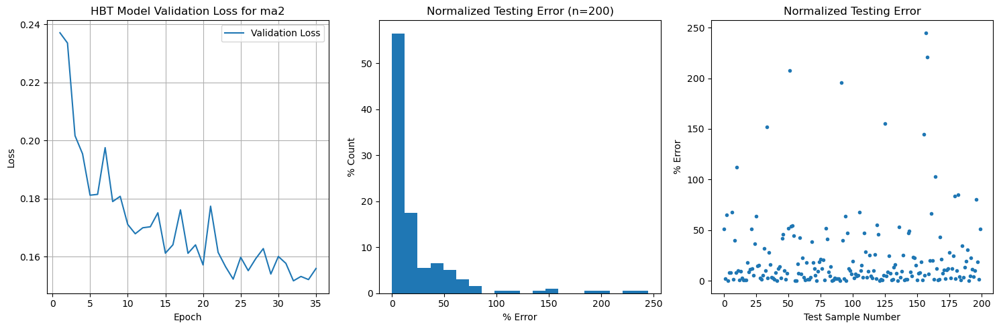

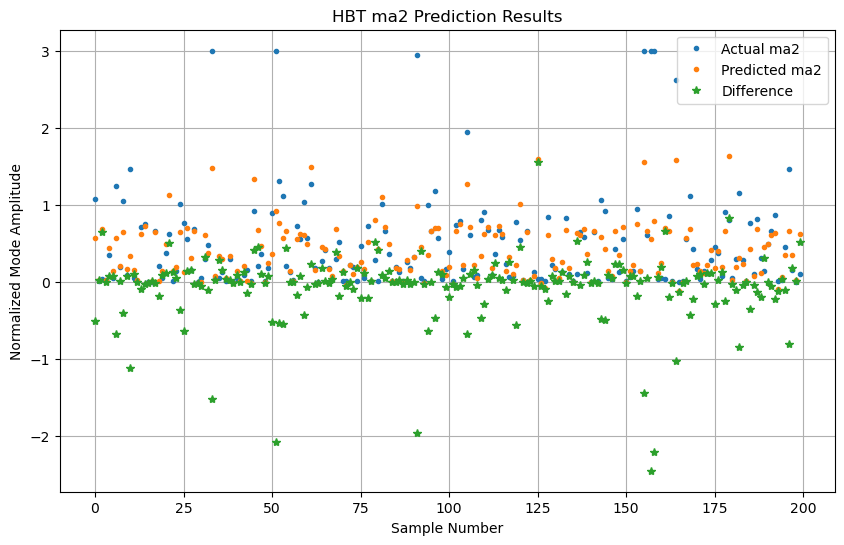

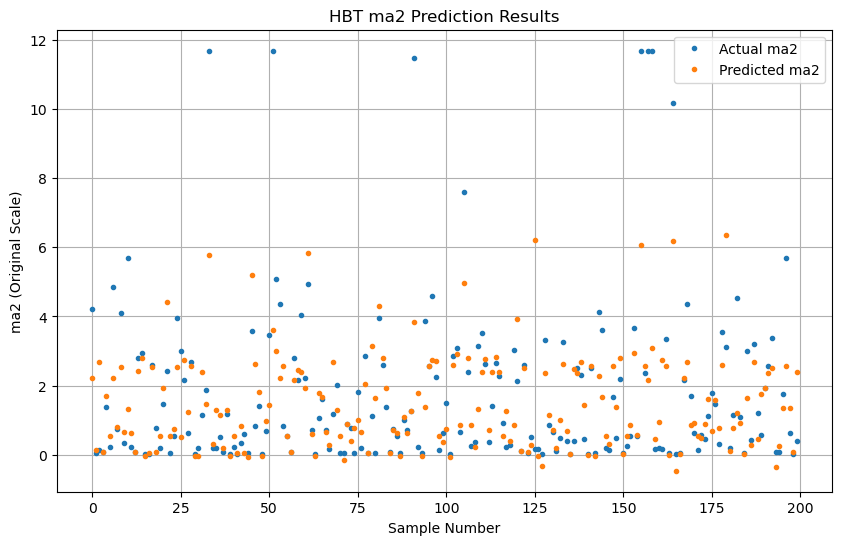

Maximum actual mode amplitude (normalized): 3.00
Maximum predicted mode amplitude (normalized): 1.63
Mean absolute percentage error: 23.54%


In [11]:
# Evaluate the model on test data
predictions = Model.predict(testing_inputs)

# Calculate prediction errors
prediction_errors = np.abs(testing_labels - predictions[:, 0]) * 100

# Create visualization plots
fig, axes = plt.subplots(figsize=(15, 5), ncols=3, nrows=1)

# Plot 1: Training History
axes[0].plot(range(1, len(history.history['val_loss']) + 1), 
             history.history['val_loss'], 
             label='Validation Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title(f'HBT Model Validation Loss for {selected_data_type}')
axes[0].legend()
axes[0].grid(True)

# Plot 2: Error Distribution
weights = np.ones_like(prediction_errors) / len(prediction_errors) * 100
axes[1].hist(prediction_errors, 20, weights=weights)
axes[1].set_xlabel('% Error')
axes[1].set_ylabel('% Count')
axes[1].set_title('Normalized Testing Error (n=200)')

# Plot 3: Error by Sample
axes[2].plot(prediction_errors, '.')
axes[2].set_xlabel('Test Sample Number')
axes[2].set_ylabel('% Error')
axes[2].set_title('Normalized Testing Error')
plt.tight_layout()
plt.show()

# Plot 4: Actual vs Predicted Values
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0], '.', label=f'Predicted {selected_data_type}')
plt.plot(-(testing_labels - predictions[:, 0]), '*', label='Difference')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

# Plot original scale predictions
plt.figure(figsize=(10, 6))
plt.plot(testing_labels * ma_norm, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0] * ma_norm, '.', label=f'Predicted {selected_data_type}')
plt.xlabel('Sample Number')
plt.ylabel(f'{selected_data_type} (Original Scale)')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

print(f"Maximum actual mode amplitude (normalized): {np.max(np.abs(testing_labels)):.2f}")
print(f"Maximum predicted mode amplitude (normalized): {np.max(np.abs(predictions[:, 0])):.2f}")
print(f"Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")

3.8972038269042963
Shot 119671: Camera frames=800, HBT frames=800, Time frames=800
Shape of reserved_shot_cut_2d: (800, 32, 32)
Shape of camera_data: (800, 32, 32)
Input data shape: (800, 32, 32, 1)
Model output shape: (None, 1)


Predictions shape: (800,)


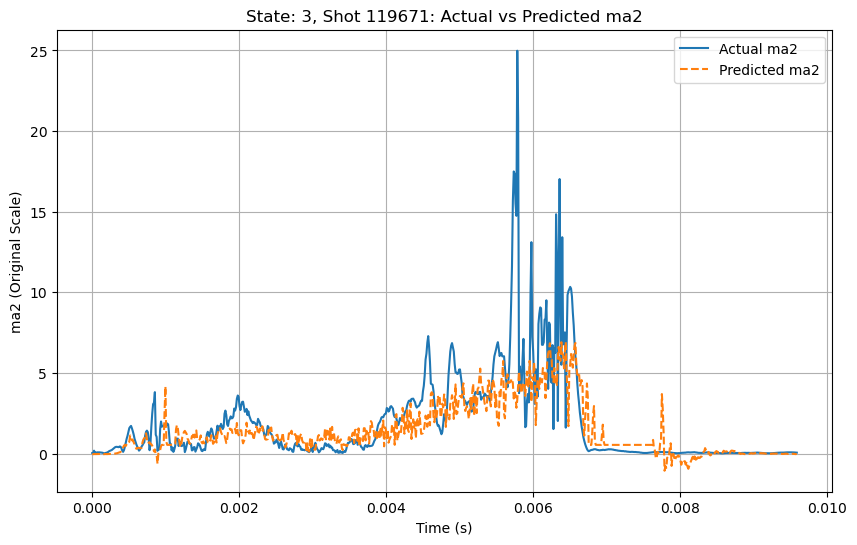

Shot 119671 - Mean absolute percentage error: 26.14%
Shot 119671 - Max actual ma2: 24.98
Shot 119671 - Max predicted ma2: 6.92


In [12]:
print(ma_norm)
def plot_RESERVED_SHOT_predictions(shot, shot_list, cut_training_data_2d, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, model, ma_norm):
    """Plot actual vs predicted Mode 2 amplitude for the reserved shot."""
    if reserved_shot_cut_2d is None:
        print(f"No data available for reserved shot {shot}. No plot generated.")
        return
    
    shot_idx = shot_list.index(shot)
    camera_data = reserved_shot_cut_2d
    hbt_data = hbt_dataType[shot_idx][:, 0]
    time_data = hbt_time_data[shot_idx]

    print(f"Shot {shot}: Camera frames={len(camera_data)}, HBT frames={len(hbt_data)}, Time frames={len(time_data)}")
    print(f"Shape of reserved_shot_cut_2d: {reserved_shot_cut_2d.shape}")
    print(f"Shape of camera_data: {np.array(camera_data).shape}")

    if len(camera_data) == 0:
        print(f"No camera data for shot {shot}. No plot generated.")
        return
    
    if len(camera_data) != len(hbt_data):
        print(f"Warning: Camera data ({len(camera_data)} frames) does not match HBT data ({len(hbt_data)} frames)")

    input_data = np.array(camera_data).reshape(-1, 32, 32, 1)
    print(f"Input data shape: {input_data.shape}")
    print(f"Model output shape: {model.output_shape}")

    predictions = []
    batch_size = 100
    for i in range(0, len(input_data), batch_size):
        batch = input_data[i:i+batch_size]
        batch_pred = model.predict(batch, verbose=0)[:, 0] * ma_norm
        predictions.extend(batch_pred)
    predictions = np.array(predictions)
    print(f"Predictions shape: {predictions.shape}")

    # Rest of the plotting code...
    
    # Plot actual vs predicted using time data
    plt.figure(figsize=(10, 6))
    plt.plot(time_data, hbt_data, label=f'Actual {selected_data_type}')
    plt.plot(time_data, predictions, '--', label=f'Predicted {selected_data_type}')
    plt.xlabel('Time (s)')  # Assuming time is in seconds; adjust if needed
    plt.ylabel(f'{selected_data_type} (Original Scale)')
    plt.title(f'State: {state}, Shot {shot}: Actual vs Predicted {selected_data_type}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Print metrics
    prediction_errors = np.abs(hbt_data - predictions) / ma_norm * 100
    print(f"Shot {shot} - Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")
    print(f"Shot {shot} - Max actual {selected_data_type}: {np.max(np.abs(hbt_data)):.2f}")
    print(f"Shot {shot} - Max predicted {selected_data_type}: {np.max(np.abs(predictions)):.2f}")

    return predictions

reserved_predictions = plot_RESERVED_SHOT_predictions(
    RESERVED_SHOT, shot_list, cut_training_data_2D, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, william_model, ma_norm
)

In [13]:
# Save true ma2 data, predictions, and time data for reserved shot
time_data = hbt_time_data[shot_list.index(RESERVED_SHOT)]

print(f"Untrimmed: Saving results for state {state}, shot {RESERVED_SHOT}")
print(f"True data defined: {'hbt_dataType' in locals()}, {'shot_list' in locals()}, {'RESERVED_SHOT' in locals()}")
print(f"Predictions defined: {'predictions' in locals()}, shape: {reserved_predictions.shape if 'predictions' in locals() else 'N/A'}")
print(f"Time data defined: {'hbt_time_data' in locals()}, shape: {hbt_time_data[shot_list.index(RESERVED_SHOT)].shape if 'hbt_time_data' in locals() else 'N/A'}")
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_true.npy', hbt_dataType[shot_list.index(RESERVED_SHOT)][:, 0])
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_pred.npy', reserved_predictions)
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_time.npy', time_data)
print("Done")

Untrimmed: Saving results for state 3, shot 119671
True data defined: True, True, True
Predictions defined: True, shape: (800,)
Time data defined: True, shape: (800,)
Done
